# Proyek Capstone Deteksi Kondisi Kematangan Buah & Sayur
- **Nama Proyek:** FRESHLY (Fresh & Healthy)
- **ID Team:** CC26-PSU059

## Pertanyaan Bisnis

1. Bagaimana distribusi kondisi kematangan (ripe, unripe, rotten)
   pada setiap jenis buah dan sayur dalam dataset, dan apakah
   distribusi tersebut sudah cukup representatif untuk melatih
   model klasifikasi yang seimbang?
   
   Metrik: Jumlah gambar per kelas, rasio ketidakseimbangan
   antar kelas (imbalance ratio), dan persentase tiap kondisi
   terhadap total per item.

2. Apakah terdapat pola warna yang konsisten dan dapat diukur
   untuk membedakan kondisi ripe, unripe, dan rotten pada
   setiap jenis buah dan sayur berdasarkan analisis
   RGB channel dan Green/Red ratio?
   
   Metrik: Rata-rata nilai Red channel, Green channel,
   dan GR ratio per kelas. Kelas dengan GR ratio < 1
   mengindikasikan dominasi warna merah (ripe),
   GR ratio > 1 mengindikasikan dominasi hijau (unripe).

3. Seberapa besar overlap fitur warna antar kelas yang
   secara visual mirip (mango_ripe vs orange_ripe,
   mango_unripe vs tomato_unripe, paprika vs buah berwarna
   kuning), dan bagaimana hal ini berpotensi mempengaruhi
   akurasi model klasifikasi?
   
   Metrik: Distribusi GR ratio dan RGB channel antar
   kelas yang confused, visualisasi scatter plot overlap
   di color space.

4. Fitur visual apa — warna (HSV), tekstur (LBP),
   atau kombinasi keduanya — yang paling membedakan
   kondisi kematangan antar kelas, dan seberapa besar
   kontribusi masing-masing fitur dalam memisahkan kelas?
   
   Metrik: Separability score antar kelas berdasarkan
   HSV statistics dan LBP texture features,
   divisualisasikan menggunakan scatter plot.

5. Bagaimana proses pengumpulan dan pembersihan data
   mempengaruhi kualitas dan representasi dataset akhir,
   dan berapa persentase data yang dieliminasi beserta
   alasannya?
   
   Metrik: Jumlah duplikat yang dihapus per kelas
   (hash-based), persentase data yang dieliminasi
   terhadap total data awal, dan distribusi akhir
   dataset clean per kelas.

 Import Semua Packages/Library yang Digunakan

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import seaborn as sns
import os
import glob
import random
import shutil
import hashlib
from PIL import Image
import datetime
import cv2
from scipy import stats
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.model_selection import train_test_split
from scipy.stats import gaussian_kde
from skimage.feature import local_binary_pattern

 Setup & Download Dataset

In [ ]:
from google.colab import files
files.upload()  # upload kaggle.json

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"zahraismaya","key":"86ad083a3b9b6900102bfb8eb204e752"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d araazh/capstone-raw-dataset -p /content/
!unzip -q /content/capstone-raw-dataset.zip -d /content/capstone/

print("Dataset berhasil didownload dan diekstrak")

Dataset URL: https://www.kaggle.com/datasets/araazh/capstone-raw-dataset
License(s): CC0-1.0
100% 1.39G/1.39G [00:14<00:00, 107MB/s]

Dataset berhasil didownload dan diekstrak


In [ ]:
BASE_PATH   = "/content/capstone"
BASE_FRUITS = os.path.join(BASE_PATH, "Fruits")
BASE_VEG    = os.path.join(BASE_PATH, "Vegetables")
BASE_EXPORT = "/content/final_dataset"

RANDOM_STATE = 42
VAL_SIZE     = 0.10
TEST_SIZE    = 0.10
# Train = 80% otomatis (sisa setelah val dan test)

# Threshold untuk filter kualitas gambar
BLUR_THRESHOLD      = 20
BRIGHTNESS_LOW      = 20
BRIGHTNESS_HIGH     = 235
MIN_FILE_SIZE_BYTES = 2000
MIN_RESOLUTION      = 32
EDGE_RATIO_MIN      = 0.15
EDGE_RATIO_MAX      = 6.5
COL_STRIPE_STD      = 60

# Target augmentasi per kelas (hanya untuk train set)
AUG_TARGET_MIN = 900  # semua kelas train minimal 900 gambar

print(" Konfigurasi berhasil diset")
print(f"   BASE_PATH    : {BASE_PATH}")
print(f"   BASE_EXPORT  : {BASE_EXPORT}")
print(f"   Split        : Train 80% | Val {VAL_SIZE*100:.0f}% | Test {TEST_SIZE*100:.0f}%")
print(f"   Aug target   : minimal {AUG_TARGET_MIN} per kelas train")

 Konfigurasi berhasil diset
   BASE_PATH    : /content/capstone
   BASE_EXPORT  : /content/final_dataset
   Split        : Train 80% | Val 10% | Test 10%
   Aug target   : minimal 900 per kelas train


## Gathering Data


In [ ]:
print("=== Struktur Folder Fruits ===")
for folder in sorted(os.listdir(BASE_FRUITS)):
    folder_path = os.path.join(BASE_FRUITS, folder)
    if os.path.isdir(folder_path):
        n = len([f for f in os.listdir(folder_path)
                 if f.lower().endswith(('.jpg','.jpeg','.png','.bmp','.webp'))])
        has_space = folder != folder.strip()
        status = "trailing space!" if has_space else "[OK]"
        print(f"  {status} {repr(folder):<30} {n:>6} gambar")

print(f"\n=== Struktur Folder Vegetables ===")
for folder in sorted(os.listdir(BASE_VEG)):
    folder_path = os.path.join(BASE_VEG, folder)
    if os.path.isdir(folder_path):
        n = len([f for f in os.listdir(folder_path)
                 if f.lower().endswith(('.jpg','.jpeg','.png','.bmp','.webp'))])
        has_space = folder != folder.strip()
        status = "trailing space!" if has_space else "[OK]"
        print(f"  {status} {repr(folder):<30} {n:>6} gambar")

=== Struktur Folder Fruits ===
  [OK] 'banana_ripe'                    1203 gambar
  [OK] 'banana_rotten'                  1201 gambar
  [OK] 'banana_unripe'                  1059 gambar
  [OK] 'mango_ripe'                      947 gambar
  [OK] 'mango_rotten'                   1134 gambar
  [OK] 'mango_unripe'                   1126 gambar
  [OK] 'orange_ripe'                    1178 gambar
  [OK] 'orange_rotten'                   912 gambar
  [OK] 'orange_unripe'                   956 gambar

=== Struktur Folder Vegetables ===
  [OK] 'chili_ripe'                      847 gambar
  [OK] 'chili_rotten'                    800 gambar
  [OK] 'chili_unripe'                   1179 gambar
  [OK] 'paprika_ripe'                    879 gambar
  [OK] 'paprika_rotten'                 1082 gambar
  [OK] 'paprika_unripe'                  902 gambar
  [OK] 'tomato_ripe'                    1110 gambar
  [OK] 'tomato_rotten'                   784 gambar
  [OK] 'tomato_unripe'                   876 gamb

 Load Semua Data ke DataFrame

In [ ]:
VALID_EXTS = ('.jpg', '.jpeg', '.png', '.bmp', '.webp')

def load_class_images(class_path, label_name):
    """Load semua gambar dalam satu folder ke DataFrame."""
    data = []
    for file in os.listdir(class_path):
        if file.lower().endswith(VALID_EXTS):
            full_path = os.path.join(class_path, file)
            data.append({"path": full_path, "label": label_name})
    return pd.DataFrame(data)


def load_all_from_folder(base_path):
    """Load semua kelas dari satu base folder."""
    frames = []
    for class_name in sorted(os.listdir(base_path)):
        class_path = os.path.join(base_path, class_name)
        if not os.path.isdir(class_path):
            continue
        label = class_name.strip()
        df_cls = load_class_images(class_path, label)
        frames.append(df_cls)

    return pd.concat(frames, ignore_index=True) if frames else pd.DataFrame()


# Load Fruits dan Vegetables
df_fruits_all = load_all_from_folder(BASE_FRUITS)
df_veg_all    = load_all_from_folder(BASE_VEG)

print(f"Fruits     : {len(df_fruits_all):>6} gambar | {df_fruits_all['label'].nunique()} kelas")
print(f"Vegetables : {len(df_veg_all):>6} gambar | {df_veg_all['label'].nunique()} kelas")
print(f"Total      : {len(df_fruits_all) + len(df_veg_all):>6} gambar")

Fruits     :   9716 gambar | 9 kelas
Vegetables :   8459 gambar | 9 kelas
Total      :  18175 gambar


 Cek Gambar Sample Per Kelas

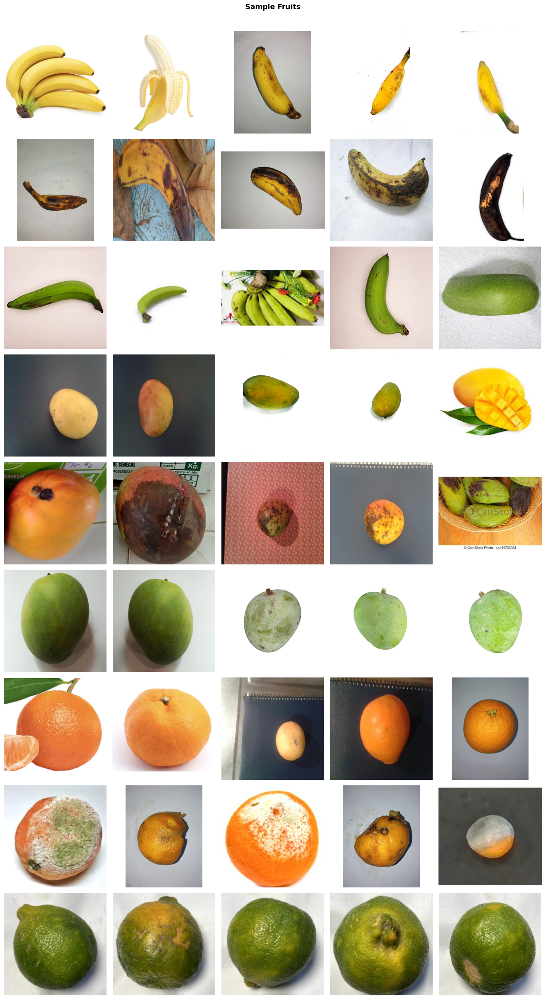

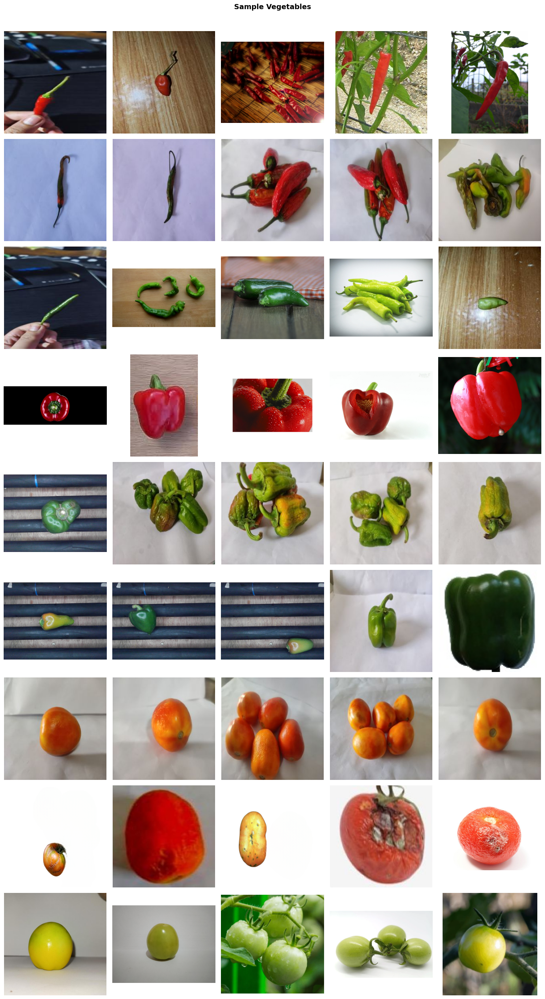

In [ ]:
def visualize_samples(df, title="Sample Gambar", n_per_class=5, max_classes=None):
    """Tampilkan n_per_class sampel untuk setiap label."""
    classes = df['label'].unique()
    if max_classes:
        classes = classes[:max_classes]

    n_cols = n_per_class
    n_rows = len(classes)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))
    fig.suptitle(title, fontsize=14, fontweight='bold', y=1.01)

    if n_rows == 1:
        axes = [axes]

    for row_idx, cls in enumerate(classes):
        samples = df[df['label'] == cls].sample(
            min(n_per_class, len(df[df['label'] == cls])),
            random_state=RANDOM_STATE
        )
        for col_idx in range(n_cols):
            ax = axes[row_idx][col_idx]
            if col_idx < len(samples):
                img = cv2.imread(samples.iloc[col_idx]['path'])
                if img is not None:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    ax.imshow(img)
            ax.axis('off')
            if col_idx == 0:
                ax.set_ylabel(cls, fontsize=9, rotation=0, labelpad=80, va='center')

    plt.tight_layout()
    plt.show()

# Visualisasi sample per kelas
visualize_samples(df_fruits_all, title="Sample Fruits")
visualize_samples(df_veg_all,    title="Sample Vegetables")

## Assessing Data

### Basic Assessment (Missing, Duplikat, Label)

In [ ]:
def basic_assessment(df, name):
    print(f"\n [{name}]")
    print(f"Total Data : {len(df)} | Kelas: {df['label'].nunique()}")
    print(f"Missing    : {df.isnull().sum().sum()} | Duplikat: {df.duplicated().sum()}")

    # Cek whitespace secara singkat
    ws_labels = df[df['label'] != df['label'].str.strip()]['label'].unique()
    if len(ws_labels) > 0:
        print(f" Warning  : Ada whitespace di kelas {ws_labels}")

# Panggil fungsi
basic_assessment(df_fruits_all, "Fruits (All)")
basic_assessment(df_veg_all,    "Vegetables (All)")


 [Fruits (All)]
Total Data : 9716 | Kelas: 9
Missing    : 0 | Duplikat: 0

 [Vegetables (All)]
Total Data : 8459 | Kelas: 9
Missing    : 0 | Duplikat: 0


### Deteksi Duplikat Gambar (Hash-based)

> Duplikat baris (path) sudah dicek di atas. Sekarang lanjut cek duplikat konten gambar (**gambar yang berbeda nama file tapi isi pikselnya sama.**)

In [ ]:
import hashlib

def get_image_hash(path):
    try:
        with open(path, 'rb') as f:
            return hashlib.md5(f.read()).hexdigest()
    except:
        return None

def find_duplicate_images_per_class(df, name, sample_per_class=300):
    print(f"\nMencari duplikat konten di {name}...")

    sampled = df.groupby('label', group_keys=False).apply(
        lambda x: x.sample(min(len(x), sample_per_class),
                           random_state=RANDOM_STATE)
    ).reset_index(drop=True)

    print(f"Total dicek: {len(sampled)} dari {len(df)} gambar")

    hashes = {}
    duplicates = []

    for _, row in sampled.iterrows():
        h = get_image_hash(row['path'])
        if h is None:
            continue
        if h in hashes:
            duplicates.append({
                'path_original': hashes[h],
                'path_duplicate': row['path'],
                'label': row['label']
            })
        else:
            hashes[h] = row['path']

    print(f"  Ditemukan {len(duplicates)} gambar duplikat konten")
    return pd.DataFrame(duplicates)


# Cek fruits
df_fruits_dupes = find_duplicate_images_per_class(
    df_fruits_all, "Fruits (All)", sample_per_class=3000
)
if len(df_fruits_dupes) > 0:
    print("\nDuplikat per kelas — Fruits:")
    print(df_fruits_dupes.groupby('label').size().to_string())
else:
    print("Tidak ada duplikat di Fruits")

# Cek vegetables
df_veg_dupes = find_duplicate_images_per_class(
    df_veg_all, "Vegetables", sample_per_class=99999
)
if len(df_veg_dupes) > 0:
    print("\nDuplikat per kelas — Vegetables:")
    print(df_veg_dupes.groupby('label').size().to_string())
else:
    print("Tidak ada duplikat di Vegetables")


Mencari duplikat konten di Fruits (All)...
Total dicek: 9716 dari 9716 gambar


/tmp/ipykernel_1863/2360571204.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled = df.groupby('label', group_keys=False).apply(


  Ditemukan 257 gambar duplikat konten

Duplikat per kelas — Fruits:
label
banana_ripe        1
banana_rotten      1
banana_unripe     23
mango_ripe        55
mango_rotten     107
mango_unripe       6
orange_ripe       10
orange_rotten     26
orange_unripe     28

Mencari duplikat konten di Vegetables...
Total dicek: 8459 dari 8459 gambar


/tmp/ipykernel_1863/2360571204.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled = df.groupby('label', group_keys=False).apply(


  Ditemukan 612 gambar duplikat konten

Duplikat per kelas — Vegetables:
label
chili_ripe         71
chili_rotten       13
chili_unripe       10
paprika_ripe       83
paprika_rotten    225
paprika_unripe     62
tomato_ripe        50
tomato_rotten      21
tomato_unripe      77


Verifikasi visual duplikat — Fruits:


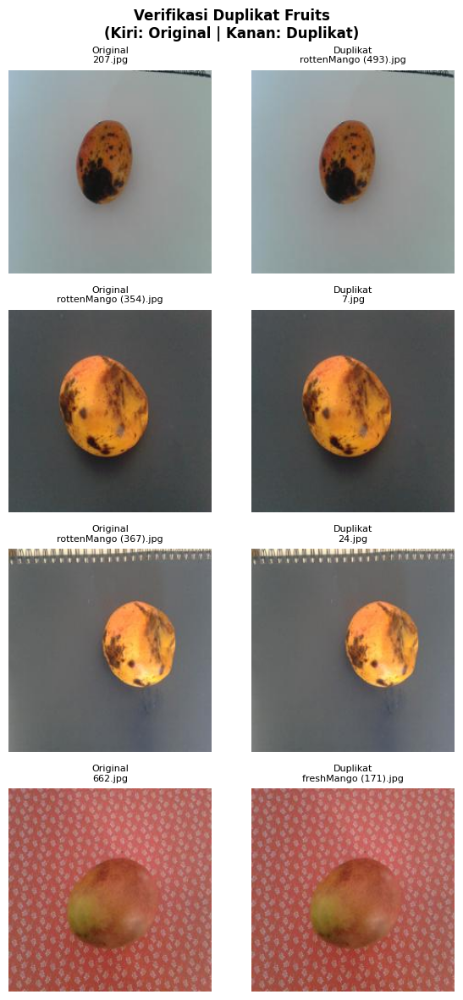


Verifikasi visual duplikat — Vegetables:


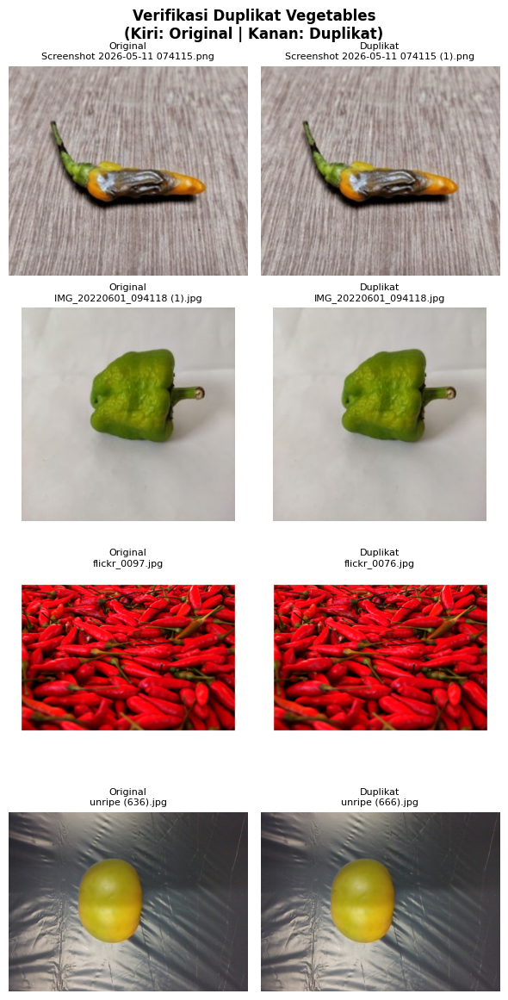

In [ ]:
# Visualisasi sample duplikat untuk verifikasi
import random

print("Verifikasi visual duplikat — Fruits:")
sample_dupes_fruits = df_fruits_dupes.sample(min(4, len(df_fruits_dupes)),
                                              random_state=42)

fig, axes = plt.subplots(len(sample_dupes_fruits), 2,
                          figsize=(6, len(sample_dupes_fruits) * 3))
fig.suptitle("Verifikasi Duplikat Fruits\n(Kiri: Original | Kanan: Duplikat)",
             fontsize=12, fontweight='bold')

for i, (_, row) in enumerate(sample_dupes_fruits.iterrows()):
    for j, path_col in enumerate(['path_original', 'path_duplicate']):
        img = cv2.imread(row[path_col])
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[i][j].imshow(img)
        axes[i][j].set_title(
            f"{'Original' if j==0 else 'Duplikat'}\n{os.path.basename(row[path_col])}",
            fontsize=8
        )
        axes[i][j].axis('off')

plt.tight_layout()
plt.show()

print("\nVerifikasi visual duplikat — Vegetables:")
sample_dupes_veg = df_veg_dupes.sample(min(4, len(df_veg_dupes)),
                                        random_state=42)

fig, axes = plt.subplots(len(sample_dupes_veg), 2,
                          figsize=(6, len(sample_dupes_veg) * 3))
fig.suptitle("Verifikasi Duplikat Vegetables\n(Kiri: Original | Kanan: Duplikat)",
             fontsize=12, fontweight='bold')

for i, (_, row) in enumerate(sample_dupes_veg.iterrows()):
    for j, path_col in enumerate(['path_original', 'path_duplicate']):
        img = cv2.imread(row[path_col])
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[i][j].imshow(img)
        axes[i][j].set_title(
            f"{'Original' if j==0 else 'Duplikat'}\n{os.path.basename(row[path_col])}",
            fontsize=8
        )
        axes[i][j].axis('off')

plt.tight_layout()
plt.show()

### Quality Assessment: Cek Blur, Brightness, Resolusi, File Size

> Lanjut deteksi gambar yang memiliki format gambar sesuai dan tidak ada corrupt file tapi **gambar terdeteksi rusak atau tidak berguna secara visual** untuk pelatihan model.

In [ ]:
def assess_image_quality(path):
    """
    Mengembalikan dictionary metrik kualitas satu gambar:
      - file_size_bytes  : ukuran file di disk
      - width, height    : dimensi gambar
      - blur_score       : Laplacian variance (makin kecil = makin blur)
      - brightness       : rata-rata kecerahan piksel (0-255)
      - edge_ratio       : rasio edge horizontal vs vertikal (distortion)
      - col_stripe_std   : std warna per kolom (stripe pattern)
      - is_readable      : False jika OpenCV tidak bisa buka
    """
    result = {
        'path': path,
        'file_size_bytes': 0,
        'width': 0, 'height': 0,
        'blur_score': 0,
        'brightness': 0,
        'edge_ratio': 1.0,
        'col_stripe_std': 0,
        'is_readable': False
    }

    try:
        result['file_size_bytes'] = os.path.getsize(path)
    except:
        return result

    img = cv2.imread(path)
    if img is None:
        return result

    result['is_readable'] = True
    result['height'], result['width'] = img.shape[:2]
    result['brightness'] = float(img.mean())

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    result['blur_score'] = float(cv2.Laplacian(gray, cv2.CV_64F).var())

    sobelX = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobelY = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    result['edge_ratio'] = float(np.abs(sobelX).mean() / (np.abs(sobelY).mean() + 1e-6))

    col_means = img.mean(axis=0).mean(axis=1)
    result['col_stripe_std'] = float(col_means.std())

    return result


def run_quality_assessment(df, name, sample_size=500):
    print(f"\nMenjalankan quality assessment pada {name} (n={sample_size or len(df)})...")

    check_df = df.sample(min(sample_size, len(df)), random_state=RANDOM_STATE) if sample_size else df

    records = []
    for _, row in check_df.iterrows():
        q = assess_image_quality(row['path'])
        q['label'] = row['label']
        records.append(q)

    df_q = pd.DataFrame(records)

    # Flagging
    df_q['flag_unreadable']  = ~df_q['is_readable']
    df_q['flag_small_file']  = df_q['file_size_bytes'] < MIN_FILE_SIZE_BYTES
    df_q['flag_low_res']     = (df_q['width'] < MIN_RESOLUTION) | (df_q['height'] < MIN_RESOLUTION)
    df_q['flag_distorted']   = (
        (df_q['edge_ratio'] < EDGE_RATIO_MIN) |
        (df_q['edge_ratio'] > EDGE_RATIO_MAX) |
        (df_q['col_stripe_std'] > COL_STRIPE_STD)
    )

    # flag_blur, flag_dark, flag_overexposed tetap dihitung untuk EDA
    # tapi TIDAK dimasukkan ke flag_any karena false positive dari BG putih/hitam
    df_q['flag_blur']        = df_q['blur_score'] < BLUR_THRESHOLD
    df_q['flag_dark']        = df_q['brightness'] < BRIGHTNESS_LOW
    df_q['flag_overexposed'] = df_q['brightness'] > BRIGHTNESS_HIGH

    # flag_any hanya berisi yang benar-benar akan dihapus
    df_q['flag_any'] = (
        df_q['flag_unreadable'] |
        df_q['flag_small_file'] |
        df_q['flag_low_res']    |
        df_q['flag_distorted']
    )

    # Summary
    flag_cols = [c for c in df_q.columns if c.startswith('flag_') and c != 'flag_any']
    print(f"\n  {'Issue':<25} {'Count':>6} {'%':>6} {'Dihapus?':>10}")
    print(f"  {'-'*50}")
    will_delete = {'unreadable', 'small_file', 'low_res', 'distorted'}
    for col in flag_cols:
        n = df_q[col].sum()
        pct = n / len(df_q) * 100
        status = '!!' if n > 0 else '[OK]'
        issue = col.replace('flag_', '')
        hapus = '✓' if issue in will_delete else '(EDA only)'
        print(f"  {status} {issue:<22} {n:>6}  {pct:>5.1f}%  {hapus:>10}")
    print(f"  {'─'*50}")
    print(f"  Total akan dihapus : {df_q['flag_any'].sum():>6}  ({df_q['flag_any'].mean()*100:.1f}%)")

    return df_q


df_quality_fruits = run_quality_assessment(df_fruits_all, "Fruits",     sample_size=9999)
df_quality_veg    = run_quality_assessment(df_veg_all,    "Vegetables", sample_size=9999)


Menjalankan quality assessment pada Fruits (n=9999)...

  Issue                      Count      %   Dihapus?
  --------------------------------------------------
  [OK] unreadable                  0    0.0%           ✓
  !! small_file                 20    0.2%           ✓
  [OK] low_res                     0    0.0%           ✓
  !! distorted                  44    0.5%           ✓
  !! blur                     1461   15.0%  (EDA only)
  [OK] dark                        0    0.0%  (EDA only)
  !! overexposed               612    6.3%  (EDA only)
  ──────────────────────────────────────────────────
  Total akan dihapus :     64  (0.7%)

Menjalankan quality assessment pada Vegetables (n=9999)...

  Issue                      Count      %   Dihapus?
  --------------------------------------------------
  [OK] unreadable                  0    0.0%           ✓
  !! small_file                  6    0.1%           ✓
  [OK] low_res                     0    0.0%           ✓
  !! distorted     

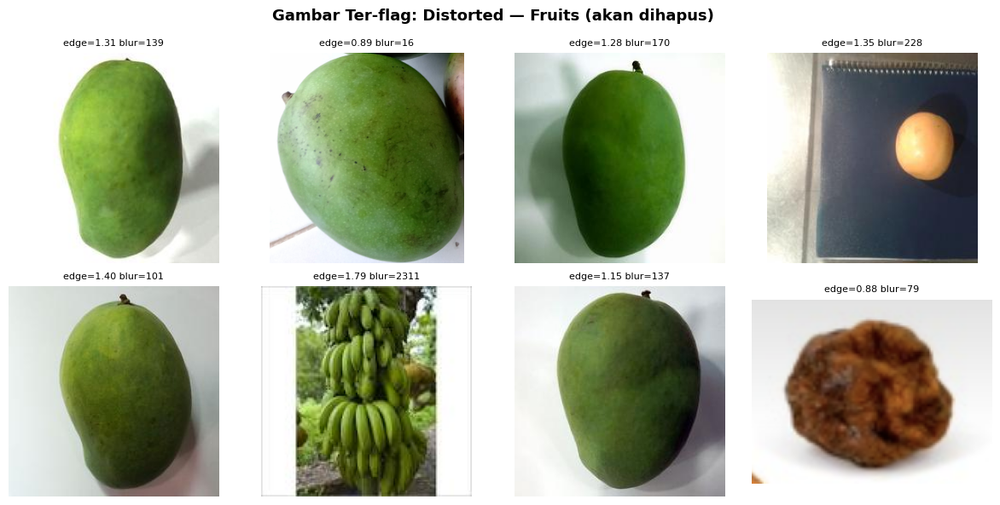

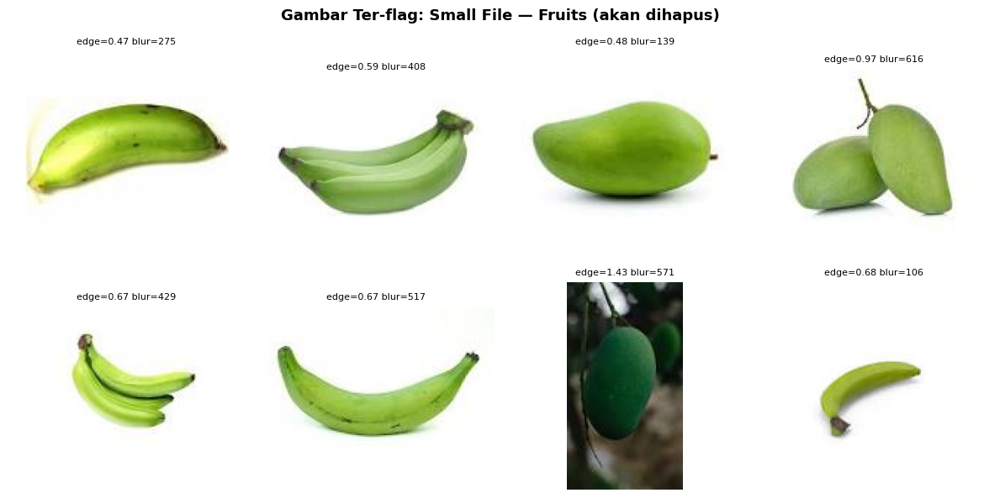

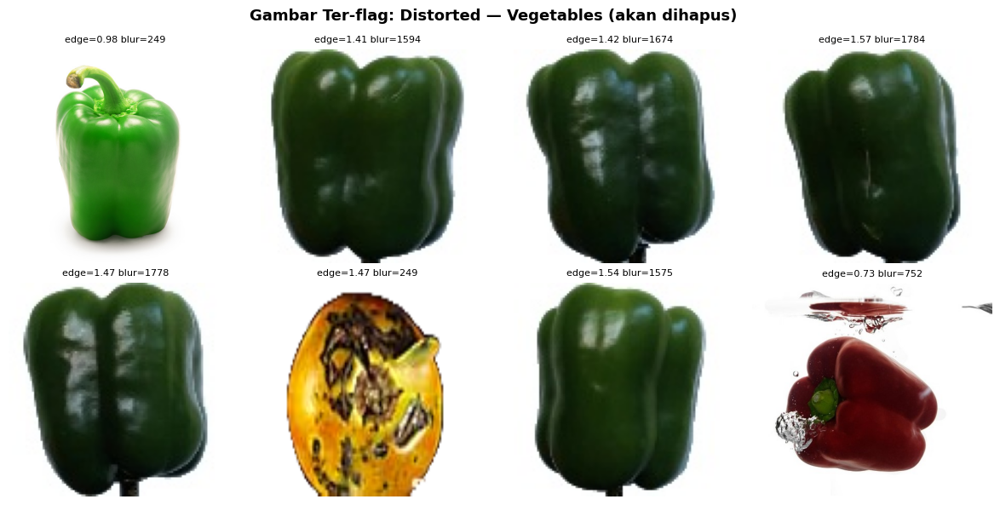

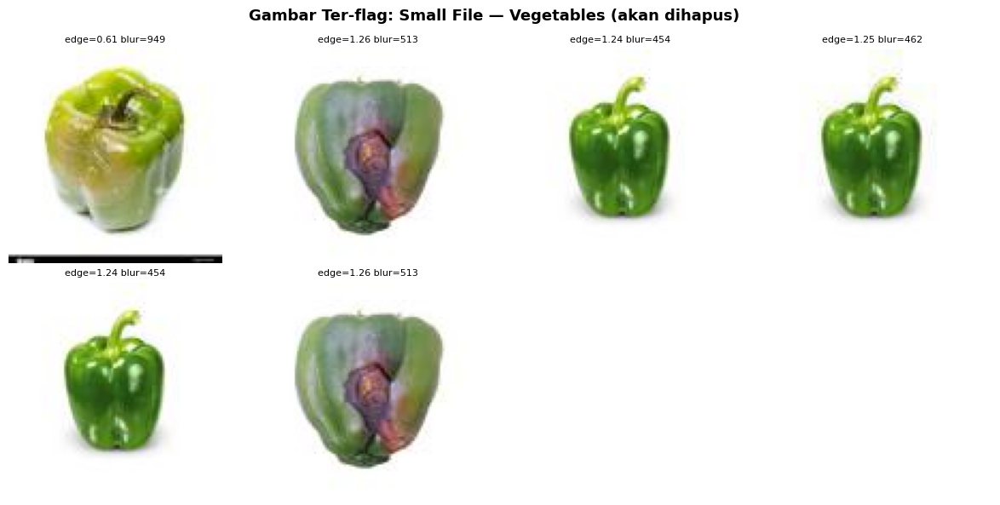

In [ ]:
def show_flagged_samples(df_quality, flag_col, title, n=8):
    flagged_paths = df_quality[df_quality[flag_col]]['path'].tolist()
    if not flagged_paths:
        print(f"Tidak ada gambar yang ter-flag: {flag_col}")
        return

    sample = flagged_paths[:n]
    n_cols = min(4, len(sample))
    n_rows = (len(sample) + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 3, n_rows * 3))
    fig.suptitle(f"Gambar Ter-flag: {title}", fontsize=13, fontweight='bold')
    axes = np.array(axes).flatten()

    for i, path in enumerate(sample):
        img = cv2.imread(path)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[i].imshow(img)
        score_row = df_quality[df_quality['path'] == path]
        if not score_row.empty:
            edge  = score_row['edge_ratio'].values[0]
            blur  = score_row['blur_score'].values[0]
            axes[i].set_title(f"edge={edge:.2f} blur={blur:.0f}", fontsize=8)
        axes[i].axis('off')

    for j in range(len(sample), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Yang akan dihapus; perlu dicek visual
show_flagged_samples(df_quality_fruits, 'flag_distorted',
                     "Distorted — Fruits (akan dihapus)")
show_flagged_samples(df_quality_fruits, 'flag_small_file',
                     "Small File — Fruits (akan dihapus)")
show_flagged_samples(df_quality_veg,    'flag_distorted',
                     "Distorted — Vegetables (akan dihapus)")
show_flagged_samples(df_quality_veg,    'flag_small_file',
                     "Small File — Vegetables (akan dihapus)")

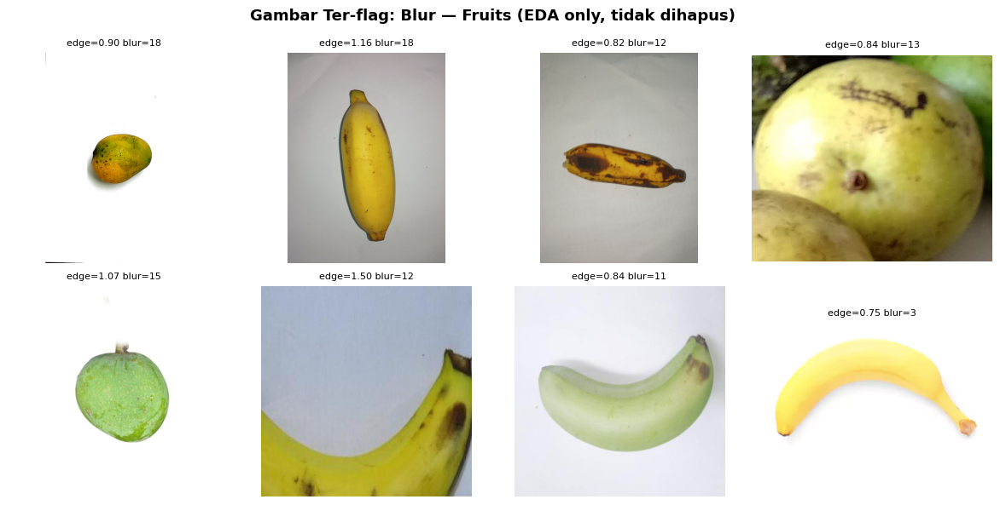

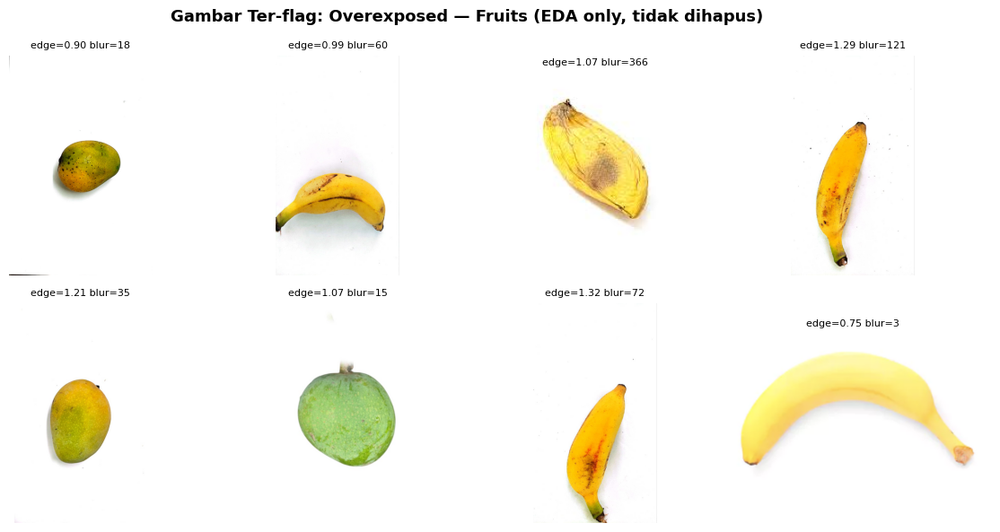

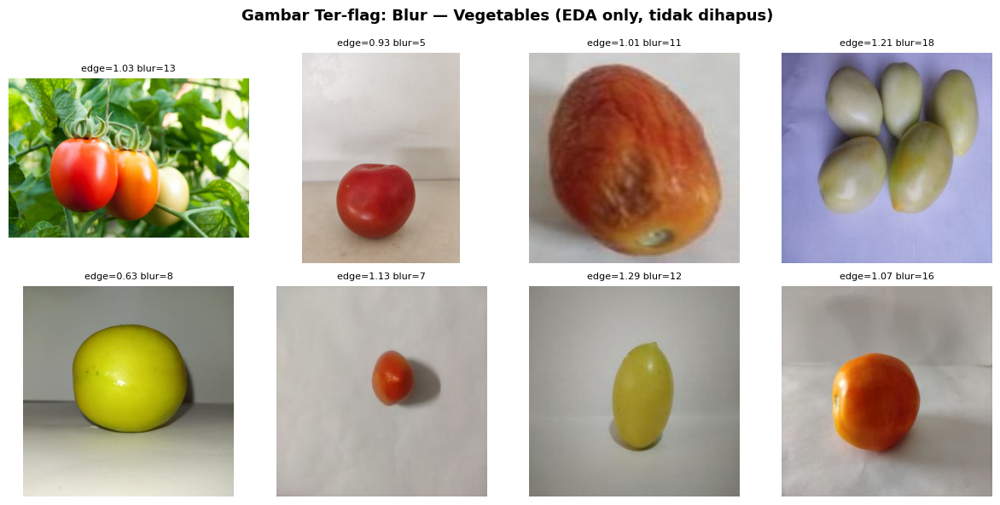

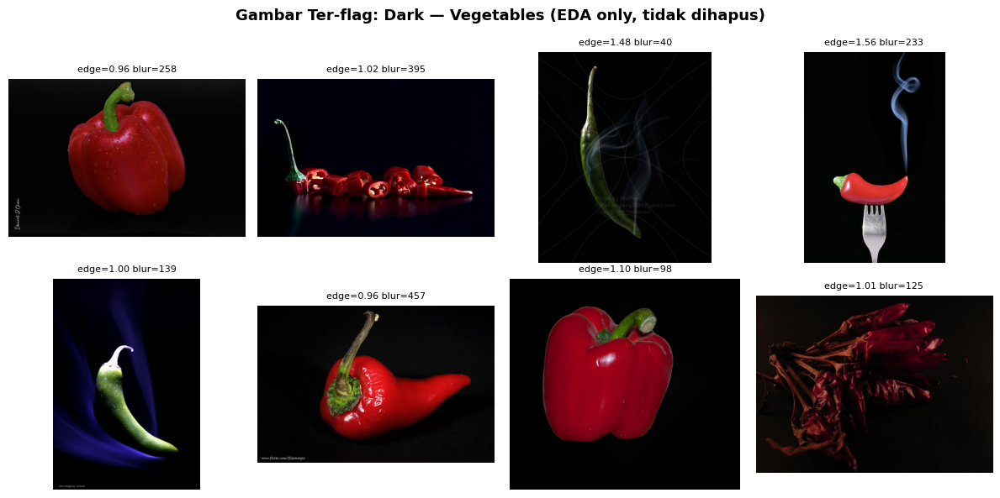

In [ ]:
# Cek visual blur dan overexposed — untuk dokumentasi EDA
# Tidak akan dihapus, hanya sebagai analisis karakteristik dataset

show_flagged_samples(df_quality_fruits, 'flag_blur',
                     "Blur — Fruits (EDA only, tidak dihapus)", n=8)

show_flagged_samples(df_quality_fruits, 'flag_overexposed',
                     "Overexposed — Fruits (EDA only, tidak dihapus)", n=8)

show_flagged_samples(df_quality_veg, 'flag_blur',
                     "Blur — Vegetables (EDA only, tidak dihapus)", n=8)

show_flagged_samples(df_quality_veg, 'flag_dark',
                     "Dark — Vegetables (EDA only, tidak dihapus)", n=8)

### Catatan Quality Assessment

Flag `blur` dan `overexposed` terdeteksi namun **tidak dihapus**
karena setelah inspeksi visual terkonfirmasi sebagai false positive
akibat variasi background dataset:

- **Background putih** → mean brightness tinggi (overexposed)
  dan Laplacian variance rendah (blur) meskipun objek tajam
- **Background hitam** → mean brightness rendah (dark)
  meskipun objek terlihat jelas

Hanya gambar yang ter-flag `distorted` dan `small_file` yang dihapus
karena anomali tersebut tidak bergantung pada warna background.

## Cleaning Data

### Hapus Duplikasi Data

In [ ]:
# Gabung semua duplikat
all_dup_paths = set(
    df_fruits_dupes['path_duplicate'].tolist() +
    df_veg_dupes['path_duplicate'].tolist()
)

def get_bad_paths_from_quality(df_quality):
    return set(df_quality[df_quality['flag_any']]['path'].tolist())

def clean_dataframe(df, bad_paths, name):
    before = len(df)
    df_clean = df[~df['path'].isin(bad_paths)].reset_index(drop=True)
    after = len(df_clean)
    print(f"{name}: {before} → {after} gambar (dihapus: {before - after})")
    return df_clean

bad_fruits = get_bad_paths_from_quality(df_quality_fruits)
bad_veg    = get_bad_paths_from_quality(df_quality_veg)

# Gabung duplikat + kualitas buruk
all_bad_fruits = all_dup_paths | bad_fruits
all_bad_veg    = all_dup_paths | bad_veg

print("=== Cleaning — Duplikat + Kualitas ===")
df_fruits_clean = clean_dataframe(df_fruits_all, all_bad_fruits, "Fruits")
df_veg_clean    = clean_dataframe(df_veg_all,    all_bad_veg,    "Vegetables")

print("\nDistribusi Fruits setelah cleaning:")
print(df_fruits_clean['label'].value_counts().to_string())
print("\nDistribusi Vegetables setelah cleaning:")
print(df_veg_clean['label'].value_counts().to_string())

=== Cleaning — Duplikat + Kualitas ===
Fruits: 9716 → 9396 gambar (dihapus: 320)
Vegetables: 8459 → 7771 gambar (dihapus: 688)

Distribusi Fruits setelah cleaning:
label
banana_ripe      1202
banana_rotten    1195
orange_ripe      1166
mango_unripe     1090
banana_unripe    1022
mango_rotten     1022
orange_unripe     927
mango_ripe        887
orange_rotten     885

Distribusi Vegetables setelah cleaning:
label
chili_unripe      1168
tomato_ripe       1060
paprika_rotten     853
tomato_unripe      799
paprika_unripe     792
chili_rotten       787
paprika_ripe       786
chili_ripe         774
tomato_rotten      752


## Exploratory Data Analysis (EDA)

### Analisis Distribusi Dataset

In [ ]:
def build_distribution_df(df_fruits, df_veg):
    data = []

    datasets = [
        (df_fruits, 'fruit'),
        (df_veg, 'vegetable')
    ]

    for df, source in datasets:

        # Hitung jumlah tiap label
        label_counts = df['label'].value_counts()

        for label, count in label_counts.items():

            # Pisahkan item dan condition
            try:
                item, condition = label.split('_', 1)

            except ValueError:
                print(f"Skipping invalid label: {label}")
                continue

            data.append({
                'item': item,
                'condition': condition,
                'count': count,
                'source': source,
                'label': label
            })

    return pd.DataFrame(data)


df_distribution = build_distribution_df(
    df_fruits_all,
    df_veg_all
)


print("Distribution DataFrame built successfully")
print(f"Total images : {df_distribution['count'].sum():,}")

# Preview
display(df_distribution.head())

Distribution DataFrame built successfully
Total images : 18,175


,item,condition,count,source,label
0,banana,ripe,1203,fruit,banana_ripe
1,banana,rotten,1201,fruit,banana_rotten
2,orange,ripe,1178,fruit,orange_ripe
3,mango,rotten,1134,fruit,mango_rotten
4,mango,unripe,1126,fruit,mango_unripe


### Insight dari Analisis Distribusi Dataset

Analisis distribusi dataset menunjukkan bahwa dataset Freshly memiliki jumlah data yang cukup besar dan beragam untuk setiap kategori kondisi kematangan pada buah dan sayuran.

**Observasi Utama:**


*   **Total Dataset**: Dataset terdiri dari sekitar 18.175 gambar yang mencakup berbagai jenis buah dan sayuran.
*   **Distribusi Kelas**: Sebagian besar item memiliki distribusi kelas yang relatif seimbang antara kondisi ripe, unripe, dan rotten.

**Contoh Distribusi:**


*   **Banana:** memiliki 1.203 gambar ripe dan 1.201 gambar rotten, menunjukkan distribusi yang hampir seimbang.
*   **Mango**: memiliki distribusi yang cukup merata pada kondisi ripe, unripe, dan rotten dengan jumlah data di atas 1.100 gambar per kelas.
*   **Orange:** memiliki lebih dari 1.100 gambar pada kondisi ripe, menunjukkan representasi data yang cukup besar.

**Variasi Item:** Dataset mencakup berbagai jenis item sehingga model dapat mempelajari karakteristik kematangan dari banyak objek yang berbeda.
**Konsistensi Distribusi:** Secara umum, tidak terlihat adanya dominasi ekstrem dari satu kelas tertentu pada sebagian besar item, sehingga potensi bias model terhadap kelas tertentu dapat diminimalkan.

**Implikasi:** Distribusi dataset yang relatif seimbang dapat membantu model deep learning mempelajari pola kematangan secara lebih optimal dan meningkatkan kemampuan generalisasi model. Namun demikian, analisis imbalance ratio tetap diperlukan untuk memastikan tidak terdapat item tertentu dengan distribusi kelas yang terlalu timpang yang dapat memengaruhi performa klasifikasi.

### Analisis Ukuran Gambar

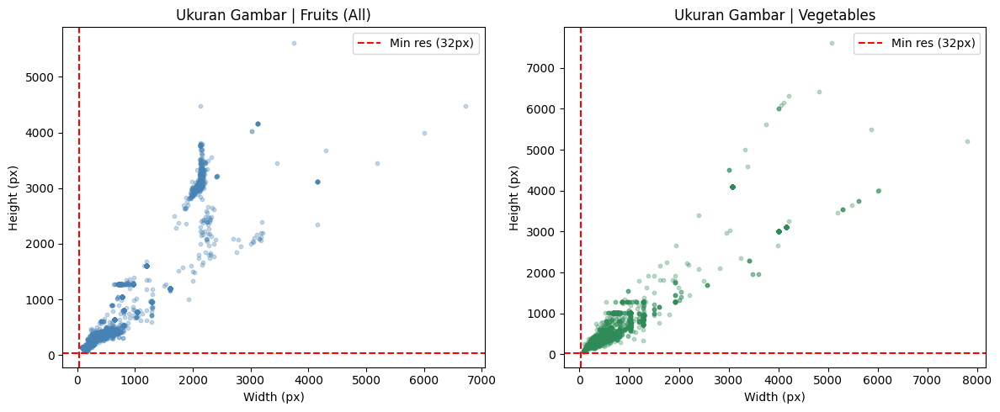


Statistik ukuran gambar | Fruits (All):
        width  height
count  9716.0  9716.0
mean    611.6   666.9
std     507.1   642.6
min      78.0    60.0
25%     224.0   224.0
50%     416.0   416.0
75%     800.0   960.0
max    6720.0  5616.0

Statistik ukuran gambar | Vegetables:
        width  height
count  8459.0  8459.0
mean    566.6   508.3
std     736.3   667.8
min      70.0    63.0
25%     256.0   256.0
50%     256.0   256.0
75%     640.0   480.0
max    7792.0  7615.0


In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

for ax, df_q, title, color in [
    (axes[0], df_quality_fruits, "Ukuran Gambar | Fruits (All)", 'steelblue'),
    (axes[1], df_quality_veg,    "Ukuran Gambar | Vegetables", 'seagreen')
]:
    ax.scatter(df_q['width'], df_q['height'], alpha=0.3, s=10, color=color)
    ax.axvline(MIN_RESOLUTION, color='red', linestyle='--', label=f'Min res ({MIN_RESOLUTION}px)')
    ax.axhline(MIN_RESOLUTION, color='red', linestyle='--')
    ax.set_xlabel("Width (px)")
    ax.set_ylabel("Height (px)")
    ax.set_title(title)
    ax.legend()

plt.tight_layout()
plt.show()

print("\nStatistik ukuran gambar | Fruits (All):")
print(df_quality_fruits[['width','height']].describe().round(1).to_string())
print("\nStatistik ukuran gambar | Vegetables:")
print(df_quality_veg[['width','height']].describe().round(1).to_string())

### Insight dari Analisis Ukuran Gambar

Analisis ukuran gambar menunjukkan bahwa dataset memiliki variasi resolusi yang cukup besar, baik untuk buah maupun sayuran.

**Observasi Utama:**
*   **Resolusi Minimum:** Hampir semua gambar (kecuali yang diflag `flag_low_res` sebelumnya) berada di atas resolusi minimum `32x32` piksel, memastikan bahwa sebagian besar gambar memiliki detail yang cukup.
*   **Rentang Dimensi:** Dimensi gambar berkisar dari sekitar `60x70` piksel hingga `5000x7000` piksel untuk beberapa gambar terbesar, menunjukkan keragaman yang sangat tinggi.
*   **Rata-rata:**
    *   **Fruits:** Rata-rata ukuran gambar sekitar `612x667` piksel.
    *   **Vegetables:** Rata-rata ukuran gambar sedikit lebih kecil, sekitar `567x508` piksel.
*   **Distribusi:** Scatter plot mengkonfirmasi bahwa ada banyak gambar dengan resolusi standar (misalnya `224x224`, `256x256`) namun juga terdapat sejumlah besar gambar dengan resolusi yang jauh lebih tinggi. Standard deviasi yang besar (sekitar `500-700` piksel) menunjukkan penyebaran ukuran yang lebar.

**Implikasi:** Variasi resolusi yang ekstrem ini mengindikasikan bahwa gambar perlu di-resize ke ukuran standar (misalnya `224x224` atau `300x300`) sebelum dimasukkan ke dalam model pembelajaran mendalam untuk memastikan konsistensi input.

### Analisis Distribusi Kualitas Gambar

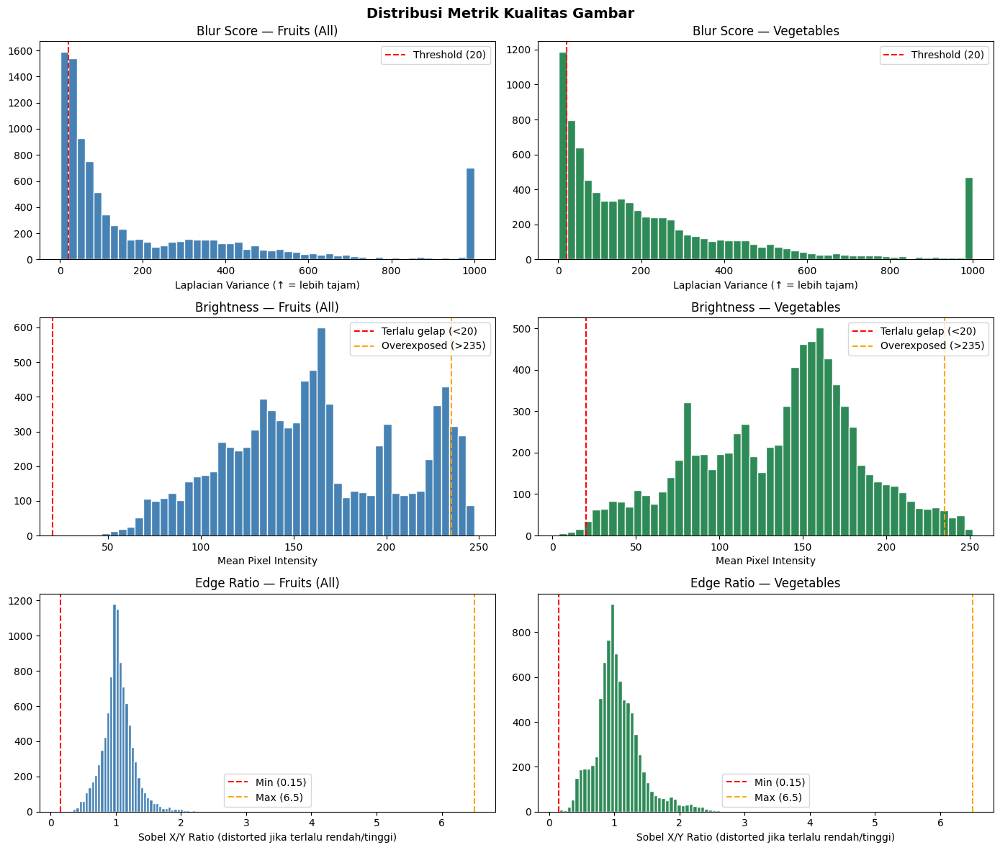

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(14, 12))
fig.suptitle("Distribusi Metrik Kualitas Gambar", fontsize=14, fontweight='bold')

# Blur score — fruits
axes[0][0].hist(df_quality_fruits['blur_score'].clip(0, 1000), bins=50, color='steelblue', edgecolor='white')
axes[0][0].axvline(BLUR_THRESHOLD, color='red', linestyle='--', label=f'Threshold ({BLUR_THRESHOLD})')
axes[0][0].set_title("Blur Score — Fruits (All)")
axes[0][0].set_xlabel("Laplacian Variance (↑ = lebih tajam)")
axes[0][0].legend()

# Blur score — vegetables
axes[0][1].hist(df_quality_veg['blur_score'].clip(0, 1000), bins=50, color='seagreen', edgecolor='white')
axes[0][1].axvline(BLUR_THRESHOLD, color='red', linestyle='--', label=f'Threshold ({BLUR_THRESHOLD})')
axes[0][1].set_title("Blur Score — Vegetables")
axes[0][1].set_xlabel("Laplacian Variance (↑ = lebih tajam)")
axes[0][1].legend()

# Brightness — fruits
axes[1][0].hist(df_quality_fruits['brightness'], bins=50, color='steelblue', edgecolor='white')
axes[1][0].axvline(BRIGHTNESS_LOW,  color='red',    linestyle='--', label=f'Terlalu gelap (<{BRIGHTNESS_LOW})')
axes[1][0].axvline(BRIGHTNESS_HIGH, color='orange', linestyle='--', label=f'Overexposed (>{BRIGHTNESS_HIGH})')
axes[1][0].set_title("Brightness — Fruits (All)")
axes[1][0].set_xlabel("Mean Pixel Intensity")
axes[1][0].legend()

# Brightness — vegetables
axes[1][1].hist(df_quality_veg['brightness'], bins=50, color='seagreen', edgecolor='white')
axes[1][1].axvline(BRIGHTNESS_LOW,  color='red',    linestyle='--', label=f'Terlalu gelap (<{BRIGHTNESS_LOW})')
axes[1][1].axvline(BRIGHTNESS_HIGH, color='orange', linestyle='--', label=f'Overexposed (>{BRIGHTNESS_HIGH})')
axes[1][1].set_title("Brightness — Vegetables")
axes[1][1].set_xlabel("Mean Pixel Intensity")
axes[1][1].legend()

# Edge ratio — fruits
axes[2][0].hist(df_quality_fruits['edge_ratio'].clip(0, 10), bins=50, color='steelblue', edgecolor='white')
axes[2][0].axvline(EDGE_RATIO_MIN, color='red',    linestyle='--', label=f'Min ({EDGE_RATIO_MIN})')
axes[2][0].axvline(EDGE_RATIO_MAX, color='orange', linestyle='--', label=f'Max ({EDGE_RATIO_MAX})')
axes[2][0].set_title("Edge Ratio — Fruits (All)")
axes[2][0].set_xlabel("Sobel X/Y Ratio (distorted jika terlalu rendah/tinggi)")
axes[2][0].legend()

# Edge ratio — vegetables
axes[2][1].hist(df_quality_veg['edge_ratio'].clip(0, 10), bins=50, color='seagreen', edgecolor='white')
axes[2][1].axvline(EDGE_RATIO_MIN, color='red',    linestyle='--', label=f'Min ({EDGE_RATIO_MIN})')
axes[2][1].axvline(EDGE_RATIO_MAX, color='orange', linestyle='--', label=f'Max ({EDGE_RATIO_MAX})')
axes[2][1].set_title("Edge Ratio — Vegetables")
axes[2][1].set_xlabel("Sobel X/Y Ratio (distorted jika terlalu rendah/tinggi)")
axes[2][1].legend()

plt.tight_layout()
plt.show()

### Insight dari Analisis Metrik Kualitas Gambar

Analisis metrik kualitas gambar (Blur, Brightness, Edge Ratio) memberikan gambaran detail tentang karakteristik visual dataset. Hasil ini mendukung keputusan cleaning data dan menjelaskan mengapa beberapa flag (blur, dark, overexposed) tidak digunakan untuk penghapusan gambar, sementara yang lain (distorted, small_file, low_res) digunakan.

**Observasi Utama:**

1.  **Blur Score (Laplacian Variance):**
    *   **Distribusi:** Histogram menunjukkan mayoritas gambar memiliki *blur score* tinggi (di atas ambang batas `BLUR_THRESHOLD`), mengindikasikan sebagian besar gambar tajam dan fokus. Namun, ada ekor distribusi yang signifikan di bawah ambang batas (sekitar 15.0% untuk Fruits dan 13.3% untuk Vegetables), yang berarti sejumlah gambar dianggap blur.
    *   **Implikasi:** Meskipun banyak gambar diflag blur, berdasarkan inspeksi visual (dan dijelaskan pada `Catatan Quality Assessment` sebelumnya), ini seringkali disebabkan oleh *false positive* dari *background* putih yang polos. Oleh karena itu, gambar-gambar ini tidak dihapus untuk menghindari kehilangan data yang sebenarnya berkualitas baik.

2.  **Brightness (Mean Pixel Intensity):**
    *   **Distribusi:** Distribusi kecerahan menunjukkan sebagian besar gambar berada dalam rentang kecerahan yang dapat diterima (`BRIGHTNESS_LOW` hingga `BRIGHTNESS_HIGH`). Namun, ada sebagian kecil gambar yang diflag `dark` (0.0% Fruits, 0.4% Vegetables) dan `overexposed` (6.3% Fruits, 1.5% Vegetables).
    *   **Implikasi:** Serupa dengan blur, masalah kecerahan (terutama *overexposed*) seringkali dikaitkan dengan *background* putih polos. Gambar-gambar ini tetap dipertahankan karena objek utama (buah/sayur) masih terlihat jelas dan memberikan informasi yang relevan.

3.  **Edge Ratio (Sobel X/Y Ratio):**
    *   **Distribusi:** Mayoritas gambar memiliki *edge ratio* yang berada di antara `EDGE_RATIO_MIN` dan `EDGE_RATIO_MAX`, menunjukkan gambar tidak mengalami distorsi yang ekstrem. Hanya sebagian kecil gambar yang diflag `distorted` (0.5% Fruits, 0.9% Vegetables) karena rasio tepi yang sangat rendah atau sangat tinggi, menunjukkan pola garis atau distorsi signifikan.
    *   **Implikasi:** Gambar yang *distorted* dianggap anomali serius yang dapat merugikan pelatihan model karena menyajikan representasi objek yang tidak akurat. Oleh karena itu, gambar-gambar ini **dihapus** dalam proses cleaning data.

**Kesimpulan:**
Metrik kualitas membantu mengidentifikasi potensi masalah pada dataset. Namun, penting untuk melakukan inspeksi visual dan memahami konteks data (misalnya, keberadaan *background* putih) untuk menghindari penghapusan *false positive*. Hanya gambar dengan masalah kualitas yang jelas dan dapat merusak model (seperti `distorted` atau `small_file`) yang dihapus secara agresif.

### Analisis Warna per Kelas

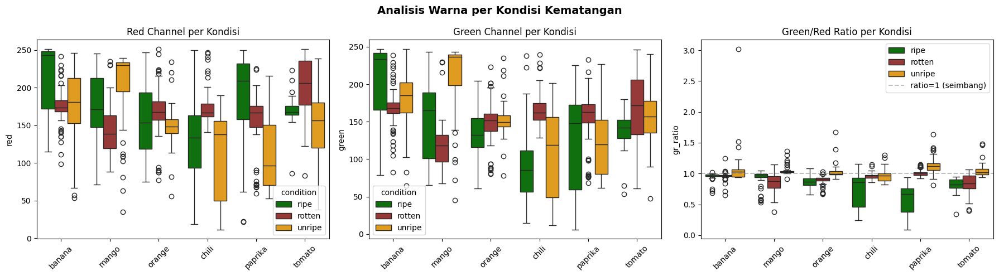


Insight:
- Buah/sayur matang (ripe) cenderung dominan merah → GR ratio < 1
- Belum matang (unripe) dominan hijau → GR ratio > 1
- Busuk (rotten) distribusi warna lebih bervariasi dan intensitas lebih rendah


In [ ]:
def extract_color_stats(df, n_per_class=50):
    """Ekstrak rata-rata RGB per gambar, sample n_per_class per kelas."""
    records = []
    for label, group in df.groupby('label'):
        sample = group.sample(min(n_per_class, len(group)), random_state=RANDOM_STATE)
        try:
            item, condition = label.split('_', 1)
        except:
            item, condition = label, 'unknown'

        for _, row in sample.iterrows():
            img = cv2.imread(row['path'])
            if img is None:
                continue
            img_resized = cv2.resize(img, (100, 100))
            b, g, r = cv2.split(img_resized)
            records.append({
                'label': label, 'item': item, 'condition': condition,
                'red': r.mean(), 'green': g.mean(), 'blue': b.mean()
            })
    return pd.DataFrame(records)

df_color_fruits = extract_color_stats(df_fruits_all)
df_color_veg    = extract_color_stats(df_veg_all)
df_color_all    = pd.concat([df_color_fruits, df_color_veg], ignore_index=True)

# Tambah GR ratio
df_color_all['gr_ratio'] = df_color_all['green'] / (df_color_all['red'] + 1e-6)

palette = {'ripe': 'green', 'unripe': 'orange', 'rotten': 'brown'}

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("Analisis Warna per Kondisi Kematangan", fontsize=14, fontweight='bold')

sns.boxplot(data=df_color_all, x='item', y='red',
            hue='condition', palette=palette, ax=axes[0])
axes[0].set_title("Red Channel per Kondisi")
axes[0].set_xlabel("")
axes[0].tick_params(axis='x', rotation=45)

sns.boxplot(data=df_color_all, x='item', y='green',
            hue='condition', palette=palette, ax=axes[1])
axes[1].set_title("Green Channel per Kondisi")
axes[1].set_xlabel("")
axes[1].tick_params(axis='x', rotation=45)

sns.boxplot(data=df_color_all, x='item', y='gr_ratio',
            hue='condition', palette=palette, ax=axes[2])
axes[2].set_title("Green/Red Ratio per Kondisi")
axes[2].set_xlabel("")
axes[2].tick_params(axis='x', rotation=45)
axes[2].axhline(1.0, color='gray', linestyle='--',
                alpha=0.5, label='ratio=1 (seimbang)')
axes[2].legend()

plt.tight_layout()
plt.show()

print("\nInsight:")
print("- Buah/sayur matang (ripe) cenderung dominan merah → GR ratio < 1")
print("- Belum matang (unripe) dominan hijau → GR ratio > 1")
print("- Busuk (rotten) distribusi warna lebih bervariasi dan intensitas lebih rendah")

### Insight dari Analisis Warna per Kelas (RGB & GR Ratio)

Analisis rata-rata nilai channel warna (Red, Green, Blue) dan Green/Red (GR) Ratio per kondisi kematangan memberikan wawasan penting tentang bagaimana warna dapat membedakan status buah dan sayur:

**Observasi Utama:**

1.  **Red Channel:**
    *   **Ripe:** Cenderung memiliki nilai Red channel rata-rata yang tinggi (misalnya, pisang, mangga, tomat matang), menunjukkan dominasi warna merah atau oranye. Hal ini konsisten dengan ekspektasi visual buah/sayur matang.
    *   **Unripe:** Umumnya memiliki nilai Red channel yang lebih rendah dibandingkan kondisi `ripe` atau `rotten` untuk buah/sayur yang akan berubah menjadi merah saat matang (misalnya tomat). Namun, untuk buah/sayur yang memang tidak berwarna merah (seperti paprika hijau), nilai Red channel bisa rendah untuk semua kondisi.
    *   **Rotten:** Menunjukkan variasi yang signifikan. Beberapa bisa tetap tinggi jika pembusukan terjadi pada buah/sayur yang awalnya merah, sementara yang lain bisa sangat rendah jika terjadi penggelapan atau perubahan warna menjadi coklat/hitam.

2.  **Green Channel:**
    *   **Unripe:** Seringkali menunjukkan nilai Green channel rata-rata yang tinggi (terutama untuk buah/sayur yang awalnya hijau, seperti mangga mentah atau paprika hijau). Ini adalah indikator kuat kondisi mentah.
    *   **Ripe:** Cenderung memiliki nilai Green channel yang lebih rendah dibandingkan `unripe` untuk banyak item, seiring dengan hilangnya klorofil saat proses pematangan.
    *   **Rotten:** Variasinya juga besar, bisa rendah karena penggelapan atau tinggi tergantung pada jenis pembusukan dan warna awal.

3.  **Green/Red Ratio (GR Ratio):**
    *   **Ripe:** Secara konsisten menunjukkan nilai GR ratio `< 1`, menandakan dominasi intensitas warna merah dibandingkan hijau. Ini adalah fitur yang sangat diskriminatif untuk kondisi matang.
    *   **Unripe:** Umumnya menunjukkan nilai GR ratio `> 1`, menandakan dominasi intensitas warna hijau dibandingkan merah. Ini juga sangat diskriminatif untuk kondisi mentah.
    *   **Rotten:** GR ratio cenderung `bervariasi` dan seringkali mendekati `1.0`. Ini karena pembusukan bisa menghasilkan perubahan warna yang kompleks, tidak selalu dominan merah atau hijau, seringkali menjadi coklat atau gelap. Akibatnya, GR ratio menjadi kurang diskriminatif antara `ripe` dan `rotten` dibandingkan antara `ripe` dan `unripe`.

**Kesimpulan:**
*   Fitur warna (terutama **Red Channel**, **Green Channel**, dan **GR Ratio**) adalah indikator yang kuat dan konsisten untuk membedakan kondisi `ripe` dan `unripe` pada sebagian besar buah dan sayur.
*   GR Ratio `< 1` adalah ciri khas `ripe`, sementara GR Ratio `> 1` adalah ciri khas `unripe`.
*   Kondisi `rotten` menunjukkan distribusi warna yang lebih bervariasi dan intensitas warna keseluruhan yang cenderung lebih rendah (seperti terlihat pada box plot channel Red/Green yang lebih rendah secara keseluruhan atau tersebar luas), membuat pembedaannya lebih kompleks dan seringkali tumpang tindih dengan kondisi lain, terutama dengan `ripe` berdasarkan GR Ratio saja. Ini menunjukkan bahwa fitur tambahan di luar warna primer mungkin diperlukan untuk membedakan `rotten` secara lebih akurat.

## Visualization & Explanatory Analysis

### BQ-1 = Distribusi Kondisi Kematangan per Item

**Pertanyaan:** Bagaimana distribusi kondisi ripe/unripe/rotten pada setiap item, dan apakah cukup representatif untuk training model?

In [ ]:
def build_distribution_df(df_fruits, df_veg):
    data = []

    datasets = [
        (df_fruits_all, 'fruit'),
        (df_veg, 'vegetable')
    ]

    for df, source in datasets:

        # Hitung jumlah tiap label
        label_counts = df['label'].value_counts()

        for label, count in label_counts.items():

            # Pisahkan item dan condition
            try:
                item, condition = label.split('_', 1)

            except ValueError:
                print(f"Skipping invalid label: {label}")
                continue

            data.append({
                'item': item,
                'condition': condition,
                'count': count,
                'source': source,
                'label': label
            })

    return pd.DataFrame(data)


df_distribution = build_distribution_df(
    df_fruits_all,
    df_veg_all
)


print("Distribution DataFrame built successfully")
print(f"Total images : {df_distribution['count'].sum():,}")

Distribution DataFrame built successfully
Total images : 18,175


In [ ]:
# Simpan ke CSV
df_distribution.to_csv(
    "distribusi_kematangan.csv",
    index=False
)

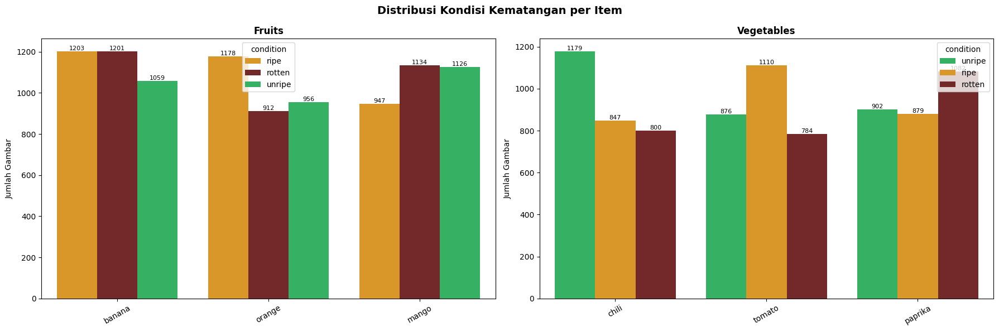

In [ ]:
# Distribusi kelas per item
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

fig.suptitle(
    "Distribusi Kondisi Kematangan per Item",
    fontsize=14,
    fontweight='bold'
)

plot_configs = [
    (axes[0], 'fruit', 'Fruits'),
    (axes[1], 'vegetable', 'Vegetables')
]

for ax, source, title in plot_configs:

    # Filter berdasarkan source
    subset = df_distribution[df_distribution['source'] == source]

    # Palette
    PALETTE = {
    'ripe': '#f59e0b',      # orange
    'unripe': '#22c55e',   # green
    'rotten': '#7f1d1d'    # dark red
    }

    # Plot
    sns.barplot(
        data=subset,
        x='item',
        y='count',
        hue='condition',
        palette=PALETTE,
        ax=ax
    )

    # Styling
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Jumlah Gambar")

    ax.tick_params(axis='x', rotation=30)

    # Label angka
    for p in ax.patches:

        height = p.get_height()

        if height > 0:

            ax.annotate(
                f'{int(height)}',
                (p.get_x() + p.get_width() / 2., height),
                ha='center',
                va='bottom',
                fontsize=8
            )

plt.tight_layout()
plt.show()

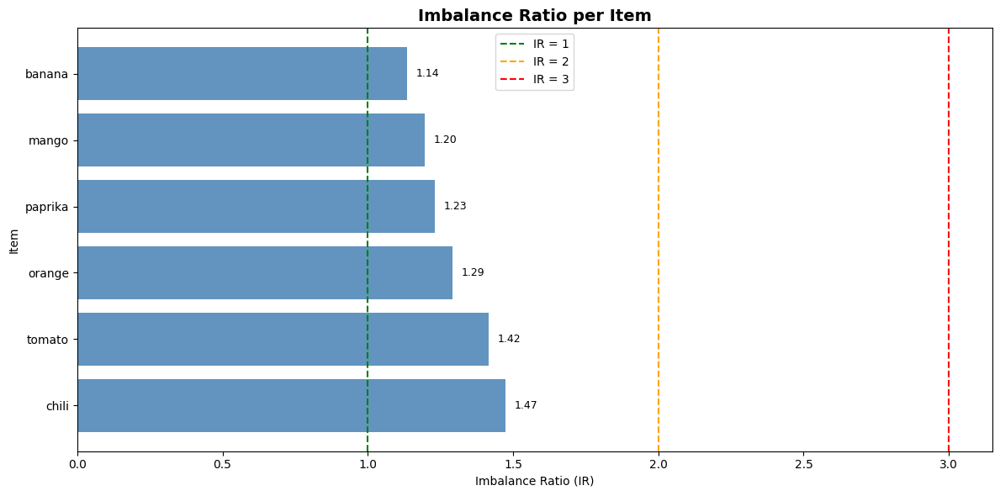

In [ ]:
# Imbalance ratio
ir_data = []

for item, group in df_distribution.groupby('item'):

    pivot = group.set_index('condition')['count']

    counts = [
        int(pivot.get('ripe', 0)),
        int(pivot.get('unripe', 0)),
        int(pivot.get('rotten', 0))
    ]

    counts = [c for c in counts if c > 0]

    ir = max(counts) / min(counts) if len(counts) > 1 else 0

    ir_data.append((item, ir))

items = [x[0] for x in ir_data]
irs   = [x[1] for x in ir_data]

# Sort berdasarkan IR
sorted_data = sorted(zip(items, irs), key=lambda x: x[1], reverse=True)

items = [x[0] for x in sorted_data]
irs   = [x[1] for x in sorted_data]


fig, ax = plt.subplots(figsize=(12, 6))

bars = ax.barh(
    items,
    irs,
    color='steelblue',
    alpha=0.85
)

# Reference line
ax.axvline(1, color='green', linestyle='--', label='IR = 1')
ax.axvline(2, color='orange', linestyle='--', label='IR = 2')
ax.axvline(3, color='red', linestyle='--', label='IR = 3')

# Label
for bar in bars:

    width = bar.get_width()

    ax.text(
        width + 0.03,
        bar.get_y() + bar.get_height()/2,
        f"{width:.2f}",
        va='center',
        fontsize=9
    )

# Styling
ax.set_title(
    "Imbalance Ratio per Item",
    fontsize=14,
    fontweight='bold'
)

ax.set_xlabel("Imbalance Ratio (IR)")
ax.set_ylabel("Item")

ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Dataframe
df_ir = pd.DataFrame(ir_data, columns=['item', 'imbalance_ratio'])
# Simpan ke CSV
df_ir.to_csv(
    "imbalance_ratio.csv",
    index=False
)

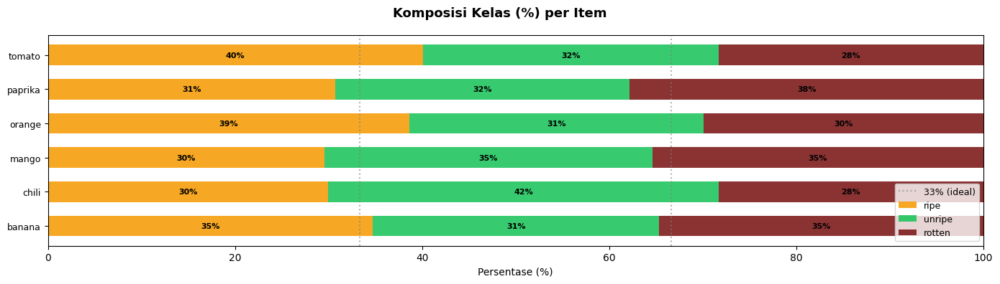

In [ ]:
# Pivot table dari seluruh dataset
pivot_pct = (
    df_distribution
    .groupby(['item', 'condition'])['count']
    .sum()
    .unstack(fill_value=0)
)

# Normalisasi ke persen
pivot_pct_norm = (
    pivot_pct
    .div(pivot_pct.sum(axis=1), axis=0)
    * 100
)

fig, ax = plt.subplots(figsize=(14, 4))

fig.suptitle(
    "Komposisi Kelas (%) per Item",
    fontsize=13,
    fontweight='bold'
)

bottom = np.zeros(len(pivot_pct_norm))

for cond, color in PALETTE.items():

    if cond in pivot_pct_norm.columns:

        vals = pivot_pct_norm[cond].values

        ax.barh(
            range(len(pivot_pct_norm)),
            vals,
            left=bottom,
            color=color,
            label=cond,
            alpha=0.9,
            height=0.6
        )

        # Label persentase
        for i, (v, b) in enumerate(zip(vals, bottom)):

            if v > 5:

                ax.text(
                    b + v / 2,
                    i,
                    f"{v:.0f}%",
                    ha='center',
                    va='center',
                    fontsize=8,
                    color='black',
                    fontweight='bold'
                )

        bottom += vals

ax.set_yticks(range(len(pivot_pct_norm)))

ax.set_yticklabels(
    pivot_pct_norm.index,
    fontsize=9
)

ax.set_xlabel("Persentase (%)")

ax.set_xlim(0, 100)

# Garis distribusi ideal
ax.axvline(
    33.3,
    color='gray',
    linestyle=':',
    alpha=0.6,
    label='33% (ideal)'
)

ax.axvline(
    66.6,
    color='gray',
    linestyle=':',
    alpha=0.6
)

ax.legend(
    loc='lower right',
    fontsize=9
)

plt.tight_layout()
plt.show()

In [ ]:
# Simpan ke CSV
pivot_pct_norm.to_csv(
    "class_composition_percent.csv",
    index=False
)

### Insight BQ-1


*   **Distribusi Fruits Relatif Stabil:** Pada kategori buah, distribusi jumlah gambar antar kondisi ripe, unripe, dan rotten cenderung cukup merata.
*   **Distribusi Vegetables Lebih Variatif:** Pada kategori sayuran terlihat variasi distribusi kelas yang lebih besar dibanding buah.
*   **Tidak Ada Ketimpangan Ekstrem:** Secara umum, seluruh item masih memiliki jumlah data yang cukup pada setiap kelas sehingga tidak ditemukan imbalance yang terlalu ekstrem
*   **Pola Kematangan Berbeda Tiap Item:** Setiap item menunjukkan karakteristik distribusi kondisi yang berbeda, mengindikasikan bahwa proses kematangan tiap buah dan sayuran memiliki representasi visual yang unik di dalam dataset.
*   **Stacked bar** menunjukkan bahwa distribusi kelas pada sebagian besar item relatif seimbang dengan proporsi tiap kondisi berada di kisaran 28-42%






### BQ-2 = Pola Warna RGB & Green/Red Ratio

**Pertanyaan:** Adakah pola warna konsisten untuk membedakan ripe/unripe/rotten?

In [ ]:
# Ekstrak fitur warna
df_color_fruits = extract_color_stats(df_fruits_all, n_per_class=80)
df_color_veg    = extract_color_stats(df_veg_all,    n_per_class=80)
df_color        = pd.concat([df_color_fruits, df_color_veg], ignore_index=True)
df_color['gr_ratio'] = df_color['green'] / (df_color['red'] + 1e-6)

print(f"Warna diekstrak dari {len(df_color)} sampel")
print("\nRata-rata GR Ratio per Kondisi:")
print(df_color.groupby('condition')['gr_ratio'].agg(['mean','std']).round(3).to_string())

Warna diekstrak dari 1440 sampel

Rata-rata GR Ratio per Kondisi:
            mean    std
condition              
ripe       0.823  0.199
rotten     0.922  0.185
unripe     1.043  0.150


In [ ]:
# Save to csv
df_color.to_csv(
    "color_analysis.csv",
    index=False
)

/tmp/ipykernel_1863/320471174.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_color, x='condition', y='gr_ratio',


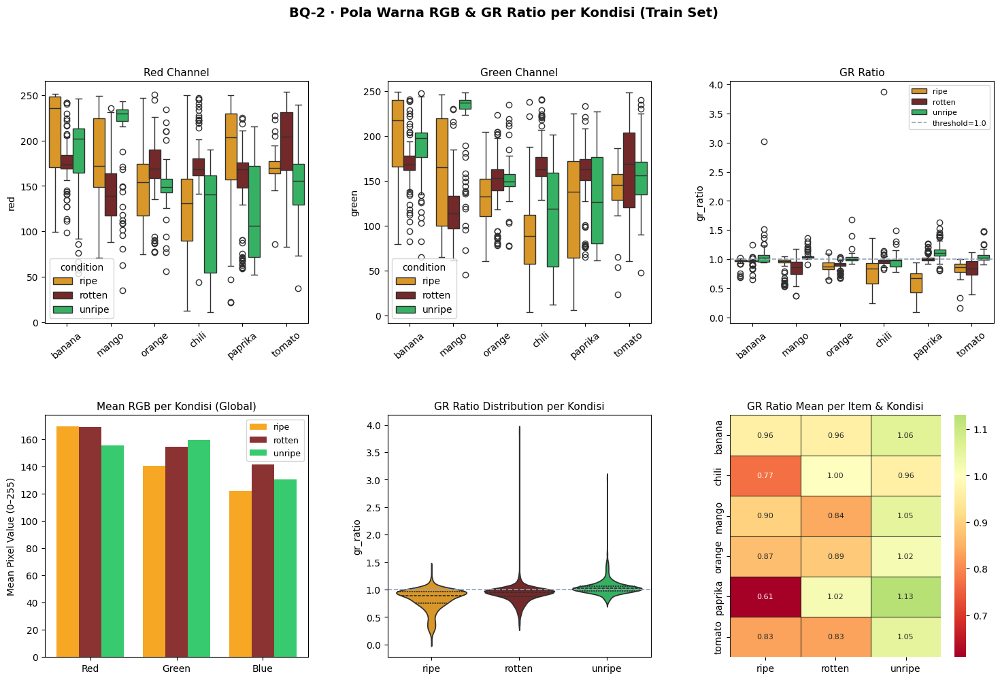

In [ ]:
# Mean RGB per kondisi
fig = plt.figure(figsize=(18, 11))
gs  = gridspec.GridSpec(2, 3, figure=fig, hspace=.38, wspace=.3)
fig.suptitle("BQ-2 · Pola Warna RGB & GR Ratio per Kondisi (Train Set)",
             fontsize=14, fontweight='bold')

# Boxplot R, G, GR per item
for idx, (col, title) in enumerate([('red','Red Channel'), ('green','Green Channel'), ('gr_ratio','GR Ratio')]):
    ax = fig.add_subplot(gs[0, idx])
    sns.boxplot(data=df_color, x='item', y=col, hue='condition',
                palette=PALETTE, ax=ax)
    ax.set_title(title, fontsize=11)
    ax.set_xlabel(""); ax.tick_params(axis='x', rotation=40)
    if col == 'gr_ratio':
        ax.axhline(1.0, color='#94a3b8', linestyle='--', lw=1.2, label='threshold=1.0')
        ax.legend(fontsize=8)

# Mean RGB per kondisi — bar chart
ax4 = fig.add_subplot(gs[1, 0])
summary_rgb = df_color.groupby('condition')[['red','green','blue']].mean()
x = np.arange(3)
w = 0.26
for i, (cond, row) in enumerate(summary_rgb.iterrows()):
    ax4.bar(x + (i-1)*w, [row['red'], row['green'], row['blue']],
            width=w, color=PALETTE[cond], label=cond, alpha=.9)
ax4.set_xticks(x); ax4.set_xticklabels(['Red','Green','Blue'])
ax4.set_title("Mean RGB per Kondisi (Global)", fontsize=11)
ax4.set_ylabel("Mean Pixel Value (0–255)")
ax4.legend(fontsize=9)

# GR ratio violin
ax5 = fig.add_subplot(gs[1, 1])
sns.violinplot(data=df_color, x='condition', y='gr_ratio',
               palette=PALETTE, ax=ax5, inner='quartile')
ax5.axhline(1.0, color='#94a3b8', linestyle='--', lw=1.2)
ax5.set_title("GR Ratio Distribution per Kondisi", fontsize=11)
ax5.set_xlabel("")

# GR ratio mean per item heatmap
ax6 = fig.add_subplot(gs[1, 2])
pivot_gr = df_color.groupby(['item','condition'])['gr_ratio'].mean().unstack(fill_value=0)
sns.heatmap(pivot_gr.round(2), annot=True, fmt=".2f", cmap="RdYlGn",
            center=1.0, linewidths=.4, linecolor='#0f1a12', ax=ax6,
            annot_kws={'size':8})
ax6.set_title("GR Ratio Mean per Item & Kondisi", fontsize=11)
ax6.set_xlabel(""); ax6.set_ylabel("")

plt.show()

### Insight BQ-2


*  **GR Ratio < 1 pada kelas ripe** menunjukkan kanal merah (red channel) lebih dominan dibanding hijau. Hal ini konsisten dengan karakteristik visual buah matang yang cenderung berwarna merah, oranye, atau kuning.
*   **GR Ratio > 1 pada kelas unripe** menunjukkan dominasi kanal hijau (green channel) yang terlihat hampir di seluruh item. Ini mengindikasikan bahwa warna hijau menjadi indikator kuat untuk kondisi belum matang
*   **Kelas rotte**n memiliki distribusi GR ratio yang cenderung mendekati 1.0 dengan variasi yang lebih besar dibanding kelas lain. Pola ini menunjukkan bahwa warna pada buah atau sayuran busuk menjadi lebih tidak konsisten karena adanya bercak gelap, perubahan tekstur, dan degradasi warna alami.
*   **Visualisasi violin plot dan boxplot** menunjukkan bahwa distribusi warna pada ripe dan unripe relatif lebih terpisah, sedangkan rotten banyak tumpang tindih dengan kedua kelas lainnya. Hal ini mengindikasikan bahwa model kemungkinan lebih mudah membedakan ripe vs unripe dibanding membedakan rotten.

Secara global, kanal merah memiliki rata-rata intensitas tertinggi pada kelas rotten, sedangkan kanal hijau lebih dominan pada unripe. Ini menunjukkan bahwa fitur warna RGB dan GR ratio merupakan fitur diskriminatif yang efektif untuk mendeteksi tingkat kematangan pada dataset Freshly.







### BQ-3 = Overlap Fitur Warna antar Kelas yang Mirip

**Pertanyaan:** Seberapa besar overlap warna antar kelas yang secara visual mirip, dan bagaimana potensinya mempengaruhi akurasi model?

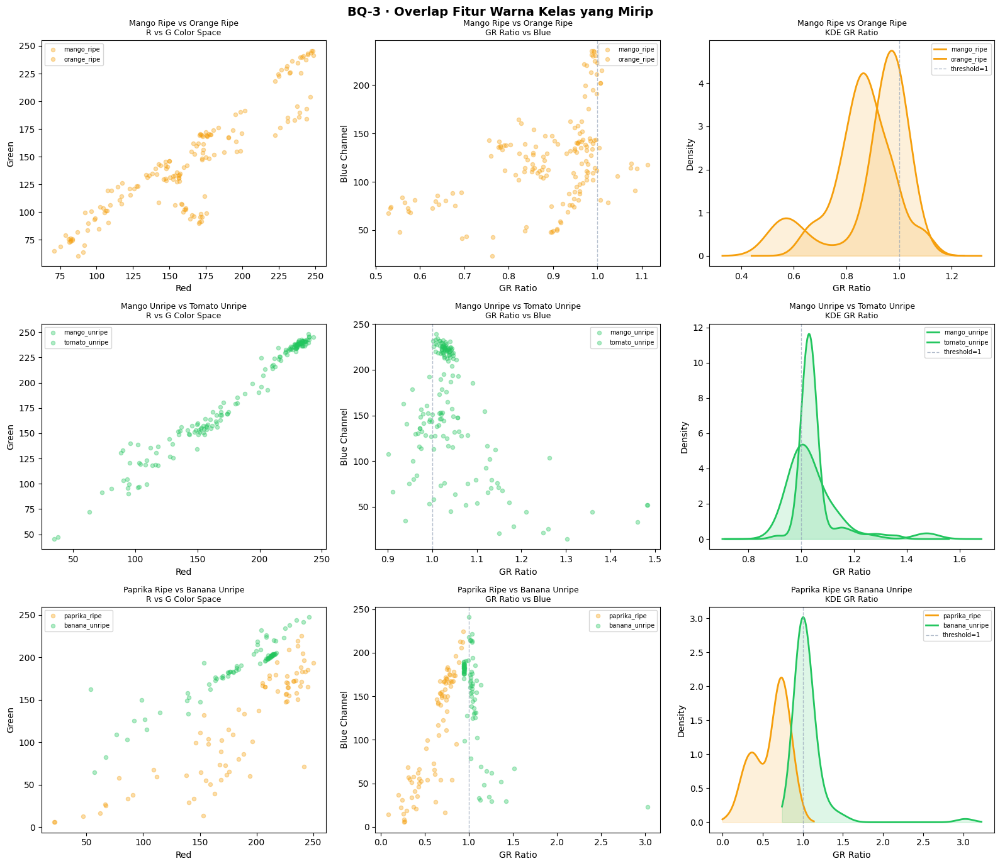

In [ ]:
# Pasangan kelas yang berpotensi mirip
confused_pairs = [
    ("mango",  "ripe",   "orange",  "ripe",   "Mango Ripe vs Orange Ripe"),
    ("mango",  "unripe", "tomato",  "unripe", "Mango Unripe vs Tomato Unripe"),
    ("paprika", "ripe",  "banana",  "unripe", "Paprika Ripe vs Banana Unripe"),
]

fig, axes = plt.subplots(3, 3, figsize=(16, 14))
fig.suptitle("BQ-3 · Overlap Fitur Warna Kelas yang Mirip",
             fontsize=14, fontweight='bold')

for row_idx, (a_item, a_cond, b_item, b_cond, pair_title) in enumerate(confused_pairs):
    a_label = f"{a_item}_{a_cond}"
    b_label = f"{b_item}_{b_cond}"
    ca = PALETTE.get(a_cond, "#888")
    cb = PALETTE.get(b_cond, "#888")

    da = df_color[df_color['label'] == a_label]
    db = df_color[df_color['label'] == b_label]

    if len(da) == 0 or len(db) == 0:
        for ax in axes[row_idx]:
            ax.text(.5, .5, f"Data tidak tersedia\n{pair_title}",
                    ha='center', va='center', transform=ax.transAxes, color='#7a9e7d')
            ax.axis('off')
        continue

    # Scatter R vs G
    ax = axes[row_idx][0]
    ax.scatter(da['red'], da['green'], alpha=.35, s=20, color=ca, label=a_label)
    ax.scatter(db['red'], db['green'], alpha=.35, s=20, color=cb, label=b_label)
    ax.set_xlabel("Red"); ax.set_ylabel("Green")
    ax.set_title(f"{pair_title}\nR vs G Color Space", fontsize=9)
    ax.legend(fontsize=7)

    # Scatter GR vs Blue
    ax = axes[row_idx][1]
    ax.scatter(da['gr_ratio'], da['blue'], alpha=.35, s=20, color=ca, label=a_label)
    ax.scatter(db['gr_ratio'], db['blue'], alpha=.35, s=20, color=cb, label=b_label)
    ax.axvline(1.0, color='#94a3b8', linestyle='--', lw=1, alpha=.7)
    ax.set_xlabel("GR Ratio"); ax.set_ylabel("Blue Channel")
    ax.set_title(f"{pair_title}\nGR Ratio vs Blue", fontsize=9)
    ax.legend(fontsize=7)

    # KDE GR Ratio
    ax = axes[row_idx][2]
    for data, color, label in [(da, ca, a_label), (db, cb, b_label)]:
        vals = data['gr_ratio'].dropna()
        if len(vals) < 5: continue
        kde_x = np.linspace(max(0, vals.min()-.2), vals.max()+.2, 300)
        kde   = gaussian_kde(vals)
        ax.plot(kde_x, kde(kde_x), color=color, lw=2, label=label)
        ax.fill_between(kde_x, kde(kde_x), alpha=.15, color=color)
    ax.axvline(1.0, color='#94a3b8', linestyle='--', lw=1, alpha=.7, label='threshold=1')
    ax.set_xlabel("GR Ratio"); ax.set_ylabel("Density")
    ax.set_title(f"{pair_title}\nKDE GR Ratio", fontsize=9)
    ax.legend(fontsize=7)

plt.tight_layout()
plt.show()

In [ ]:
export_rows = []

for a_item, a_cond, b_item, b_cond, pair_title in confused_pairs:

    a_label = f"{a_item}_{a_cond}"
    b_label = f"{b_item}_{b_cond}"

    da = df_color[df_color['label'] == a_label].copy()
    db = df_color[df_color['label'] == b_label].copy()

    # Skip jika kosong
    if len(da) == 0 or len(db) == 0:
        continue

    # Tambahkan metadata pair
    da['pair'] = pair_title
    da['group'] = 'A'

    db['pair'] = pair_title
    db['group'] = 'B'

    # Gabungkan
    export_rows.append(da)
    export_rows.append(db)

# Final dataframe
df_overlap_visual = pd.concat(
    export_rows,
    ignore_index=True
)

# Simpan ke CSV
df_overlap_visual.to_csv(
    "overlap_visualization_dataset.csv",
    index=False
)

Menghitung overlap antar pasangan kelas...


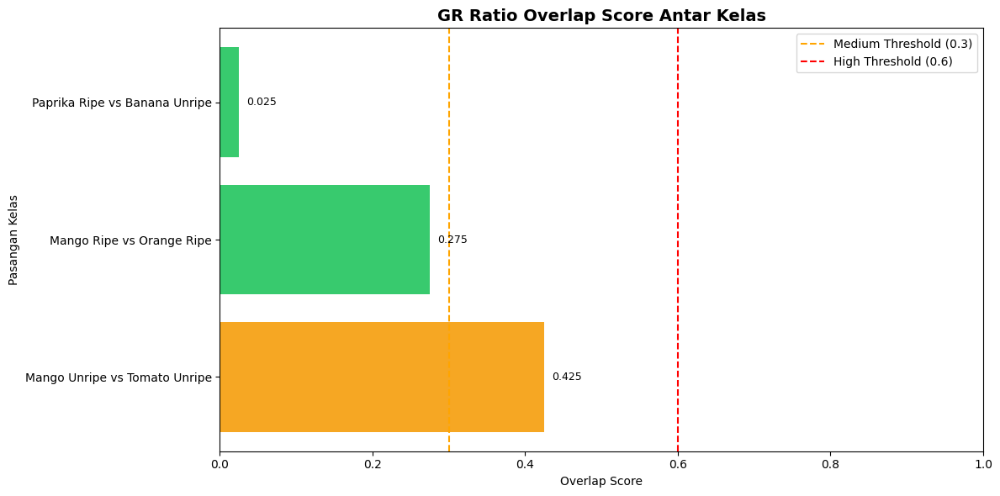

In [ ]:
# Visualisasi Overlap Score Antar Kelas

overlap_records = []

print("Menghitung overlap antar pasangan kelas...")

for a_item, a_cond, b_item, b_cond, pair_title in confused_pairs:

    # Ambil data GR ratio
    da = df_color[
        df_color['label'] == f"{a_item}_{a_cond}"
    ]['gr_ratio'].dropna()

    db = df_color[
        df_color['label'] == f"{b_item}_{b_cond}"
    ]['gr_ratio'].dropna()

    # Skip jika data terlalu sedikit
    if len(da) < 5 or len(db) < 5:
        continue

    # Histogram overlap
    bins = np.linspace(
        min(da.min(), db.min()),
        max(da.max(), db.max()),
        50
    )

    ha, _ = np.histogram(
        da,
        bins=bins,
        density=True
    )

    hb, _ = np.histogram(
        db,
        bins=bins,
        density=True
    )

    # Hitung overlap area
    overlap = np.minimum(ha, hb).sum() * (bins[1] - bins[0])

    # Kategori overlap
    if overlap > 0.6:
        level = 'High'
    elif overlap > 0.3:
        level = 'Medium'
    else:
        level = 'Low'

    overlap_records.append({
        'pair': pair_title,
        'overlap': overlap,
        'level': level
    })
# Build DataFrame
df_overlap = pd.DataFrame(overlap_records)

# Sort overlap tertinggi
df_overlap = df_overlap.sort_values(
    by='overlap',
    ascending=False
)

color = [
    PALETTE['rotten'] if lvl == 'High'
    else PALETTE['ripe'] if lvl == 'Medium'
    else PALETTE['unripe']
    for lvl in df_overlap['level']
]

# Plot
fig, ax = plt.subplots(figsize=(12, 6))

bars = ax.barh(
    df_overlap['pair'],
    df_overlap['overlap'],
    color=color,
    alpha=0.9
)
# Label nilai overlap
for bar in bars:

    width = bar.get_width()

    ax.text(
        width + 0.01,
        bar.get_y() + bar.get_height()/2,
        f"{width:.3f}",
        va='center',
        fontsize=9
    )
# Threshold lines
ax.axvline(
    0.3,
    color='orange',
    linestyle='--',
    linewidth=1.5,
    label='Medium Threshold (0.3)'
)

ax.axvline(
    0.6,
    color='red',
    linestyle='--',
    linewidth=1.5,
    label='High Threshold (0.6)'
)
# Styling
ax.set_title(
    "GR Ratio Overlap Score Antar Kelas",
    fontsize=14,
    fontweight='bold'
)

ax.set_xlabel("Overlap Score")
ax.set_ylabel("Pasangan Kelas")

ax.set_xlim(0, 1)

ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
df_overlap.to_csv(
    "overlap_score_pairs.csv",
    index=False
)

### Insight BQ-3


*   **Mango_unripe vs Tomato_unripe**: keduanya berwarna hijau saat mentah, overlap di ruang R-G sangat tinggi. Hal ini menunjukkan bahwa fitur warna saja kemungkinan belum cukup untuk membedakan kedua kelas secara optimal.
*    **Mango_ripe vs Orange_ripe**: kedua buah memiliki warna kuning-oranye saat matang, menyebabkan distribusi GR ratio sangat berdekatan. Kondisi ini mengindikasikan bahwa model berpotensi mengalami kesulitan membedakan kedua kelas apabila hanya mengandalkan fitur warna.
*   **Paprika_ripe vs Banana_unripe**: paprika merah (ripe) dan pisang mentah (kuning-hijau) memiliki GR ratio yang terpisah. Paprika matang cenderung didominasi warna merah, sedangkan pisang mentah lebih dominan hijau-kuning, sehingga model diperkirakan dapat membedakan kedua kelas dengan lebih mudah menggunakan fitur warna.

Overlap distribusi warna ini berpotensi menurunkan kemampuan model dalam membedakan kelas tertentu, terutama pada pasangan kelas dengan karakteristik warna yang mirip. Risiko kesalahan klasifikasi dapat menjadi lebih besar pada kelas minoritas seperti rotten karena jumlah data yang lebih sedikit dan distribusi warna yang sering tumpang tindih dengan kelas ripe. Oleh karena itu, model diharapkan mampu mengekstrak fitur yang lebih kompleks seperti tekstur, pola permukaan, dan bentuk objek untuk melampaui keterbatasan analisis warna sederhana.







### BQ-4 = Separabilitas Fitur, HSV vs LBP Texture

**Pertanyaan:** Fitur HSV atau LBP yang lebih memisahkan kelas kematangan?

In [ ]:
# Ekstrak fitur visual lengkap
def extract_visual_features(df, n_per_class=80, desc=""):
    print(f"Ekstrak fitur visual {desc}...")
    records = []
    for label, group in df.groupby('label'):
        sample = group.sample(min(n_per_class, len(group)), random_state=RANDOM_STATE)
        try:
            item, condition = label.split('_', 1)
        except:
            item, condition = label, 'unknown'
        for _, row in sample.iterrows():
            img_bgr = cv2.imread(row['path'])
            if img_bgr is None: continue
            img_r  = cv2.resize(img_bgr, (100, 100))
            b, g, r = cv2.split(img_r)
            red_m, grn_m, blu_m = float(r.mean()), float(g.mean()), float(b.mean())
            gr     = grn_m / (red_m + 1e-6)
            hsv    = cv2.cvtColor(img_r, cv2.COLOR_BGR2HSV)
            h_ch, s_ch, v_ch = cv2.split(hsv)
            gray   = cv2.cvtColor(img_r, cv2.COLOR_BGR2GRAY)
            lbp    = local_binary_pattern(gray, P=8, R=1, method='uniform')
            hist, _ = np.histogram(lbp, bins=10, range=(0,10))
            hist   = hist / (hist.sum() + 1e-6)
            records.append({
                'label': label, 'item': item, 'condition': condition,
                'red_mean': red_m, 'green_mean': grn_m, 'blue_mean': blu_m,
                'gr_ratio': gr,
                'hue_mean': float(h_ch.mean()), 'hue_std': float(h_ch.std()),
                'sat_mean': float(s_ch.mean()), 'sat_std': float(s_ch.std()),
                'val_mean': float(v_ch.mean()), 'val_std': float(v_ch.std()),
                'lbp_mean': float(hist.mean()), 'lbp_std': float(hist.std()),
            })
    return pd.DataFrame(records)

df_feat_fruits = extract_visual_features(df_fruits_all, 100, "Fruits")
df_feat_veg    = extract_visual_features(df_veg_all,    100, "Vegetables")
df_feat_all    = pd.concat([df_feat_fruits, df_feat_veg], ignore_index=True)
print(f"\nTotal sampel: {len(df_feat_all)} | Fitur: {len(df_feat_all.columns)-3}")

Ekstrak fitur visual Fruits...
Ekstrak fitur visual Vegetables...

Total sampel: 1800 | Fitur: 12


Fisher Separability Score (lebih tinggi = lebih diskriminatif)

            ripe vs unripe  ripe vs rotten  unripe vs rotten  Avg Score
Feature                                                                
gr_ratio             0.652           0.274             0.386      0.437
hue_std              0.350           0.093             0.270      0.238
sat_std              0.248           0.262             0.015      0.175
sat_mean             0.113           0.240             0.123      0.159
green_mean           0.199           0.169             0.059      0.142
lbp_std              0.073           0.070             0.140      0.094
red_mean             0.110           0.017             0.139      0.089
val_mean             0.057           0.041             0.103      0.067
hue_mean             0.037           0.047             0.083      0.056
lbp_mean             0.000           0.000             0.000      0.000


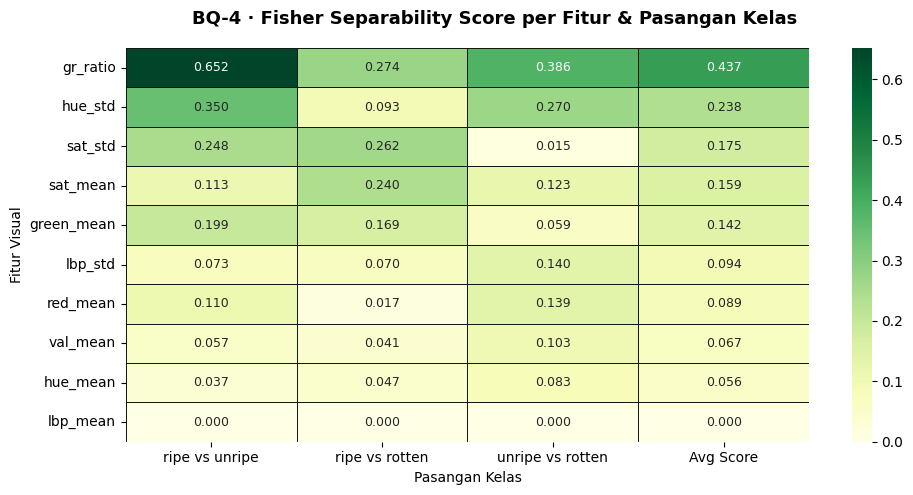

In [ ]:
# Fisher Criterion Separability Score
features = ['gr_ratio','hue_mean','sat_mean','val_mean','lbp_mean','lbp_std',
            'red_mean','green_mean','hue_std','sat_std']
pairs    = [('ripe','unripe'), ('ripe','rotten'), ('unripe','rotten')]

def fisher_score(a_vals, b_vals):
    if len(a_vals) < 2 or len(b_vals) < 2: return 0.0
    return abs(a_vals.mean() - b_vals.mean()) / (a_vals.std() + b_vals.std() + 1e-9)

score_rows = []
for feat in features:
    row = {'Feature': feat}
    for ca, cb in pairs:
        ga = df_feat_all[df_feat_all['condition'] == ca][feat].dropna()
        gb = df_feat_all[df_feat_all['condition'] == cb][feat].dropna()
        row[f"{ca} vs {cb}"] = round(fisher_score(ga, gb), 3)
    score_rows.append(row)

score_df = pd.DataFrame(score_rows).set_index('Feature')
score_df['Avg Score'] = score_df.mean(axis=1).round(3)
score_df = score_df.sort_values('Avg Score', ascending=False)

print("Fisher Separability Score (lebih tinggi = lebih diskriminatif)\n")
print(score_df.to_string())

# Heatmap
fig, ax = plt.subplots(figsize=(10, 5))
fig.suptitle("BQ-4 · Fisher Separability Score per Fitur & Pasangan Kelas",
             fontsize=13, fontweight='bold')
sns.heatmap(score_df, annot=True, fmt=".3f", cmap="YlGn",
            linewidths=.4, linecolor='#0f1a12', ax=ax,
            annot_kws={'size': 9})
ax.set_xlabel("Pasangan Kelas"); ax.set_ylabel("Fitur Visual")
plt.tight_layout()
plt.show()

In [ ]:
score_df.to_csv(
    "fisher_separability_score.csv"
)

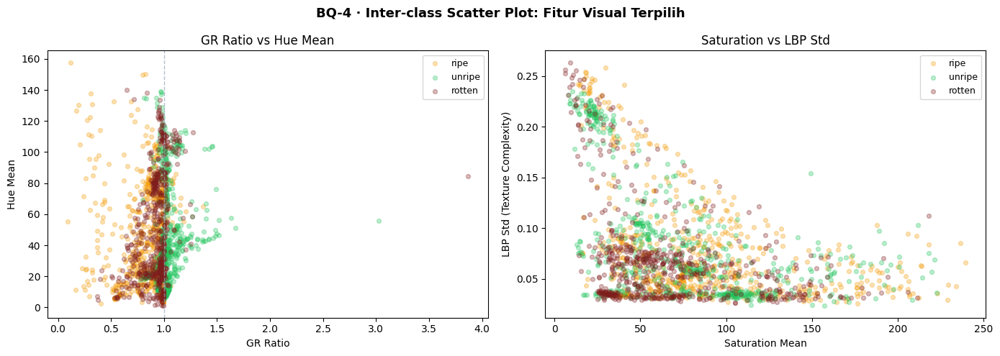


=== Summary Fitur per Kondisi ===
           gr_ratio  hue_mean  sat_mean  lbp_std
condition                                       
ripe          0.819    46.222    87.273    0.078
rotten        0.921    49.343    66.111    0.071
unripe        1.042    43.819    76.604    0.086


In [ ]:
# Scatter: GR ratio vs Saturation, ruang fitur terbaik
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("BQ-4 · Inter-class Scatter Plot: Fitur Visual Terpilih",
             fontsize=13, fontweight='bold')

# Plot 1: GR ratio vs Hue Mean
ax = axes[0]
for cond, color in PALETTE.items():
    sub = df_feat_all[df_feat_all['condition'] == cond]
    ax.scatter(sub['gr_ratio'], sub['hue_mean'], alpha=.3, s=18, color=color, label=cond)
ax.axvline(1.0, color='#94a3b8', linestyle='--', lw=1, alpha=.7)
ax.set_xlabel("GR Ratio"); ax.set_ylabel("Hue Mean")
ax.set_title("GR Ratio vs Hue Mean")
ax.legend(fontsize=9)

# Plot 2: Saturation vs LBP Std
ax = axes[1]
for cond, color in PALETTE.items():
    sub = df_feat_all[df_feat_all['condition'] == cond]
    ax.scatter(sub['sat_mean'], sub['lbp_std'], alpha=.3, s=18, color=color, label=cond)
ax.set_xlabel("Saturation Mean"); ax.set_ylabel("LBP Std (Texture Complexity)")
ax.set_title("Saturation vs LBP Std")
ax.legend(fontsize=9)

plt.tight_layout()
plt.show()

print("\n=== Summary Fitur per Kondisi ===")
print(df_feat_all.groupby('condition')[
    ['gr_ratio','hue_mean','sat_mean','lbp_std']
].mean().round(3).to_string())

In [ ]:
# Dataset khusus untuk scatter plot
df_scatter_visual = df_feat_all[
    [
        'condition',
        'gr_ratio',
        'hue_mean',
        'sat_mean',
        'lbp_std'
    ]
].copy()

# Save ke CSV
df_scatter_visual.to_csv(
    "scatter_visual_features.csv",
    index=False
)

### Insight BQ-4

*   **Rasio GR (Green/Red Ratio)** adalah fitur yang **paling diskriminatif** untuk membedakan kondisi **matang (ripe, GR < 1)** dari **mentah (unripe, GR > 1)**, menunjukkan pemisahan yang jelas.
*   **Rata-rata Saturasi (Saturation Mean)** sangat efektif dalam membedakan item **busuk (rotten)** dari kondisi matang dan mentah. Item busuk secara konsisten menunjukkan **saturasi yang lebih rendah** (warna yang lebih pucat) karena degradasi pigmen.
*   **Rata-rata Hue (Hue Mean)** dan **LBP Std (Kompleksitas Tekstur)** **kurang diskriminatif**. Rata-rata Hue menunjukkan tumpang tindih antara kondisi matang dan busuk, sementara performa LBP Std untuk 'busuk' berlawanan dengan ekspektasi (kompleksitas lebih rendah dari yang diharapkan), menunjukkan bahwa fitur ini mungkin tidak secara efektif menangkap tanda-tanda visual pembusukan.

### BQ-5 = Dampak Proses Cleaning terhadap Kualitas Dataset

**Pertanyaan:** Bagaimana proses cleaning mempengaruhi kualitas dan representasi dataset?

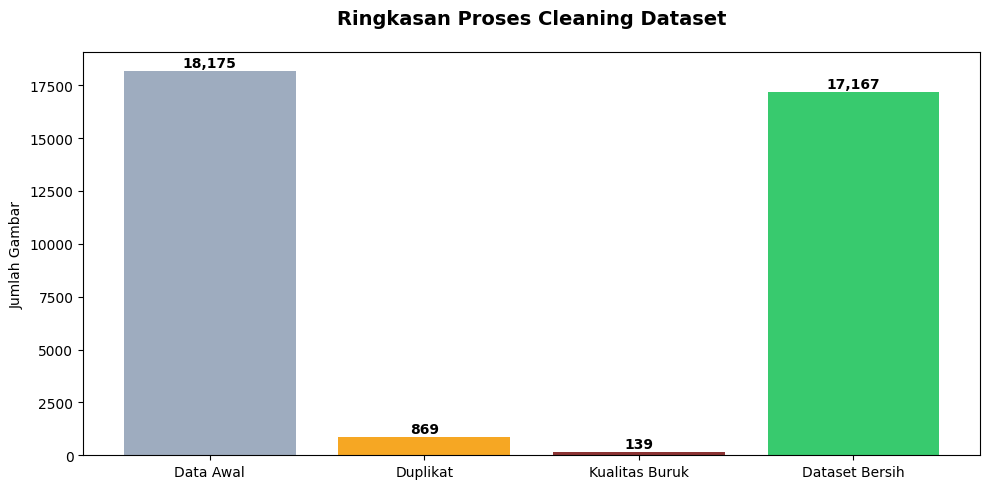

In [ ]:
total_raw = len(df_fruits_all) + len(df_veg_all)
total_dup = len(all_dup_paths)
all_bad_quality_paths = set(get_bad_paths_from_quality(df_quality_fruits)) | set(get_bad_paths_from_quality(df_quality_veg))
total_bad = len(all_bad_quality_paths - all_dup_paths) # Paths unique to bad quality, not already duplicates
total_clean = len(df_fruits_clean) + len(df_veg_clean)

# Visualisasi Ringkasan Proses Cleaning
categories = [
    'Data Awal',
    'Duplikat',
    'Kualitas Buruk',
    'Dataset Bersih'
]

values = [
    total_raw,
    total_dup,
    total_bad,
    total_clean
]

colors = [
    '#94a3b8',
    PALETTE['ripe'],
    PALETTE['rotten'],
    PALETTE['unripe']
]

# Plot
fig, ax = plt.subplots(figsize=(10, 5))

bars = ax.bar(
    categories,
    values,
    color=colors,
    alpha=0.9
)

# Label jumlah
for bar in bars:

    height = bar.get_height()

    ax.text(
        bar.get_x() + bar.get_width()/2,
        height + (total_raw * 0.01),
        f"{int(height):,}",
        ha='center',
        fontsize=10,
        fontweight='bold'
    )

# Styling

ax.set_title(
    "Ringkasan Proses Cleaning Dataset",
    fontsize=14,
    fontweight='bold',
    pad=20
)

ax.set_ylabel("Jumlah Gambar")

# Tambahkan ruang atas
ax.set_ylim(0, max(values) * 1.05)

plt.tight_layout()
plt.show()

In [ ]:
# Dataset ringkasan cleaning
df_cleaning_summary = pd.DataFrame({
    'category': categories,
    'count': values
})

# Save ke CSV
df_cleaning_summary.to_csv(
    "dataset_cleaning_summary.csv",
    index=False
)

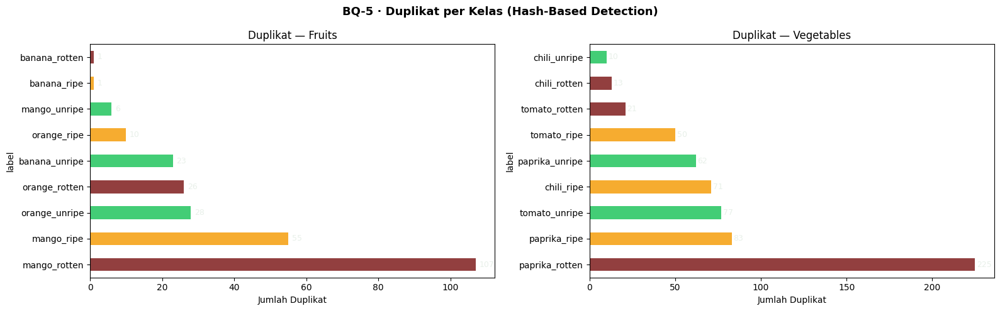

In [ ]:
# Duplikat per kelas
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle("BQ-5 · Duplikat per Kelas (Hash-Based Detection)",
             fontsize=13, fontweight='bold')
dup_export = []

for ax, df_dupes, title in [
    (axes[0], df_fruits_dupes, "Duplikat — Fruits"),
    (axes[1], df_veg_dupes,    "Duplikat — Vegetables"),
]:
    if len(df_dupes) == 0:
        ax.text(.5, .5, "Tidak ada duplikat\nterdeteksi",
                ha='center', va='center', transform=ax.transAxes,
                fontsize=12, color='#4ade80')
        ax.set_title(title); ax.axis('off')
        continue
    dup_per = df_dupes.groupby('label').size().sort_values(ascending=False)
    temp_df = dup_per.reset_index()
    temp_df.columns = ['label', 'duplicate_count']
    temp_df['category_type'] = title
    dup_export.append(temp_df)
    colors  = [PALETTE.get(lbl.split('_')[1] if '_' in lbl else 'ripe', '#888')
               for lbl in dup_per.index]
    dup_per.plot(kind='barh', ax=ax, color=colors, alpha=.85)
    ax.set_title(title); ax.set_xlabel("Jumlah Duplikat")
    for p in ax.patches:
        ax.annotate(f'{int(p.get_width())}',
                   (p.get_width()+1, p.get_y()+p.get_height()/2),
                   va='center', fontsize=9, color='#e8f0e9')

plt.tight_layout()
plt.show()

In [ ]:
# Gabungkan semua hasil
df_duplicate_summary = pd.concat(
    dup_export,
    ignore_index=True
)

# Save ke CSV
df_duplicate_summary.to_csv(
    "duplicate_per_class.csv",
    index=False
)

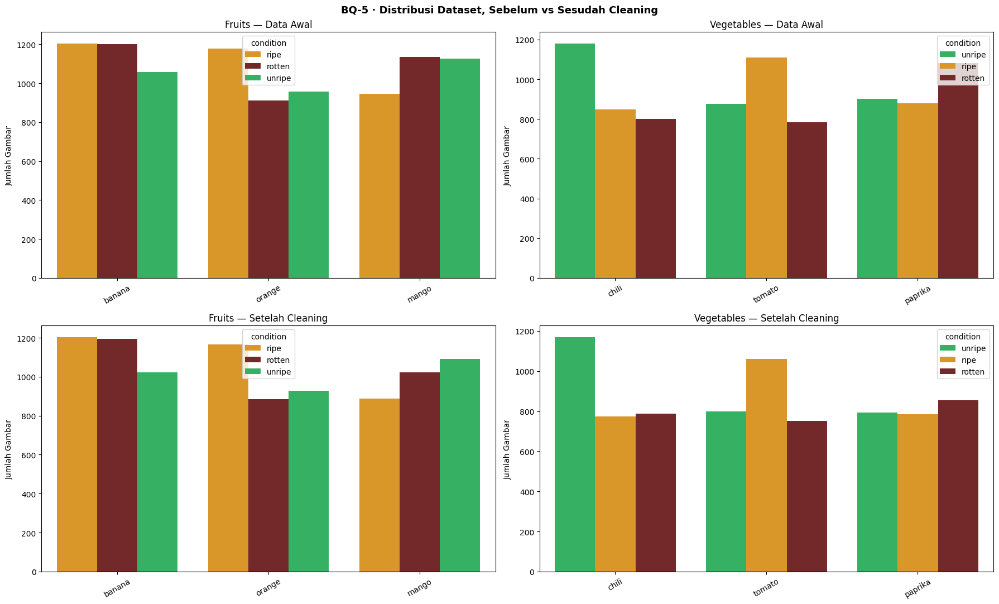

In [ ]:
# Distribusi sebelum vs setelah cleaning
fig, axes = plt.subplots(2, 2, figsize=(18, 11))
fig.suptitle("BQ-5 · Distribusi Dataset, Sebelum vs Sesudah Cleaning",
             fontsize=13, fontweight='bold')

# Build dist untuk raw
def build_dist_from_df(df, source):
    rows = []
    for label, count in df['label'].value_counts().items():
        try:
            item, cond = label.split('_', 1)
        except:
            continue
        rows.append({'item': item, 'condition': cond, 'count': count, 'source': source})
    return pd.DataFrame(rows)

df_dist_raw_f  = build_dist_from_df(df_fruits_all,   'fruit')
df_dist_raw_v  = build_dist_from_df(df_veg_all,      'vegetable')
df_dist_clean_f = build_dist_from_df(df_fruits_clean, 'fruit')
df_dist_clean_v = build_dist_from_df(df_veg_clean,    'vegetable')

for (ax, df_d, title) in [
    (axes[0][0], df_dist_raw_f,   "Fruits — Data Awal"),
    (axes[0][1], df_dist_raw_v,   "Vegetables — Data Awal"),
    (axes[1][0], df_dist_clean_f, "Fruits — Setelah Cleaning"),
    (axes[1][1], df_dist_clean_v, "Vegetables — Setelah Cleaning"),
]:
    sns.barplot(data=df_d, x='item', y='count', hue='condition',
                palette=PALETTE, ax=ax)
    ax.set_title(title); ax.set_xlabel("")
    ax.set_ylabel("Jumlah Gambar"); ax.tick_params(axis='x', rotation=30)

plt.tight_layout()
plt.show()

In [ ]:
# Tambahkan status cleaning
df_dist_raw_f['stage']    = 'before_cleaning'
df_dist_raw_v['stage']    = 'before_cleaning'

df_dist_clean_f['stage']  = 'after_cleaning'
df_dist_clean_v['stage']  = 'after_cleaning'

# Gabungkan seluruh distribusi
df_distribution_compare = pd.concat([
    df_dist_raw_f,
    df_dist_raw_v,
    df_dist_clean_f,
    df_dist_clean_v
], ignore_index=True)

# Simpan ke CSV
df_distribution_compare.to_csv(
    "dataset_distribution_before_after_cleaning.csv",
    index=False
)

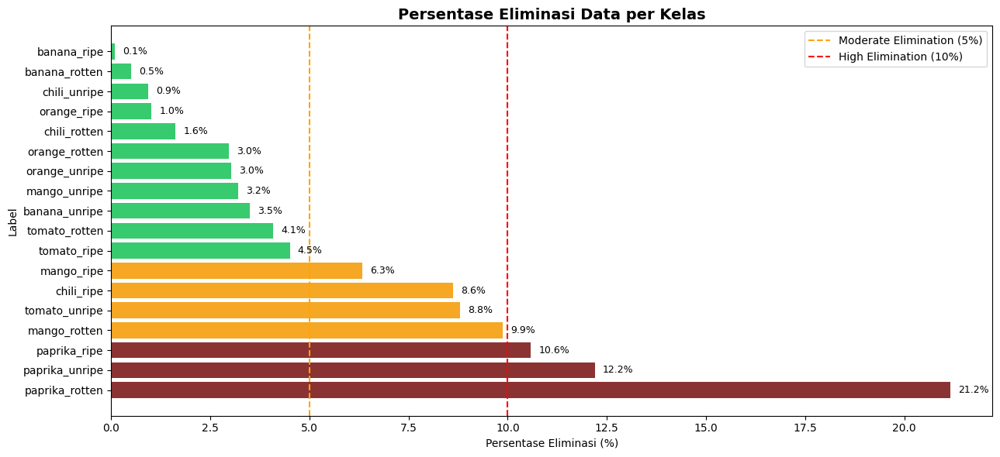

In [ ]:
df_all_labels = pd.concat([df_fruits_all, df_veg_all], ignore_index=True)
df_clean_labels = pd.concat([df_fruits_clean, df_veg_clean], ignore_index=True)

# Visualisasi Persentase Eliminasi per Kelas
elim_records = []

# Build elimination statistics
for label in sorted(df_all_labels['label'].unique()):

    awal = len(
        df_all_labels[
            df_all_labels['label'] == label
        ]
    )

    bersih = len(
        df_clean_labels[
            df_clean_labels['label'] == label
        ]
    )

    hapus = awal - bersih

    pct = (
        hapus / awal * 100
        if awal > 0 else 0
    )

    elim_records.append({
        'label': label,
        'raw': awal,
        'clean': bersih,
        'deleted': hapus,
        'elim_pct': pct
    })

# Build dataframe
df_elim = pd.DataFrame(elim_records)

# Sort berdasarkan eliminasi tertinggi
df_elim = df_elim.sort_values(
    by='elim_pct',
    ascending=False
)


colors = [
    PALETTE['rotten'] if x > 10
    else PALETTE['ripe'] if x > 5
    else PALETTE['unripe']
    for x in df_elim['elim_pct']
]

# Plot

fig, ax = plt.subplots(figsize=(13, 6))

bars = ax.barh(
    df_elim['label'],
    df_elim['elim_pct'],
    color=colors,
    alpha=0.9
)

# Label persentase
for bar in bars:

    width = bar.get_width()

    ax.text(
        width + 0.2,
        bar.get_y() + bar.get_height()/2,
        f"{width:.1f}%",
        va='center',
        fontsize=9
    )

# Threshold line
ax.axvline(
    5,
    color='orange',
    linestyle='--',
    linewidth=1.5,
    label='Moderate Elimination (5%)'
)

ax.axvline(
    10,
    color='red',
    linestyle='--',
    linewidth=1.5,
    label='High Elimination (10%)'
)

# Styling
ax.set_title(
    "Persentase Eliminasi Data per Kelas",
    fontsize=14,
    fontweight='bold'
)

ax.set_xlabel("Persentase Eliminasi (%)")
ax.set_ylabel("Label")

ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Simpan dataset eliminasi ke CSV
df_elim.to_csv(
    "data_elimination_per_class.csv",
    index=False
)

### Insight BQ-5


*   **Duplikasi terbesar** ditemukan di `paprika_rotten` dan `paprika_unripe` berasal dari dataset sumber yang memperbanyak data dengan duplikasi eksplisit.
*   Total eliminasi **>10% dari data awal** pada `paprika_ripe`, , `paprika_unripe` dan `paprika_rotten` menunjukkan dataset mentah memiliki cukup banyak data bermasalah seperti duplikasi, resolusi rendah, blur, atau kualitas gambar yang tidak konsisten sehingga proses cleaning menjadi penting untuk menjaga kualitas data pelatihan model.









## Splitting Data


In [ ]:
from sklearn.model_selection import train_test_split

def split_dataset(df, val_size=VAL_SIZE, test_size=TEST_SIZE, random_state=RANDOM_STATE):
    """
    Split dataset menjadi train/val/test dengan stratified sampling.
    80% train, 10% val, 10% test.
    """
    # Split train vs (val+test)
    df_train, df_temp = train_test_split(
        df,
        test_size=val_size + test_size,
        random_state=random_state,
        stratify=df['label']
    )

    # Split val vs test dari temp
    df_val, df_test = train_test_split(
        df_temp,
        test_size=test_size / (val_size + test_size),
        random_state=random_state,
        stratify=df_temp['label']
    )

    return df_train.reset_index(drop=True), \
           df_val.reset_index(drop=True), \
           df_test.reset_index(drop=True)


# Split fruits
df_fruits_train, df_fruits_val, df_fruits_test = split_dataset(df_fruits_clean)

# Split vegetables
df_veg_train, df_veg_val, df_veg_test = split_dataset(df_veg_clean)

# Summary
print("=== Hasil Split 80/10/10 ===\n")
print(f"{'Split':<10} {'Fruits':>8} {'Vegetables':>12} {'Total':>8}")
print("-" * 42)
print(f"{'Train':<10} {len(df_fruits_train):>8} {len(df_veg_train):>12} {len(df_fruits_train)+len(df_veg_train):>8}")
print(f"{'Val':<10} {len(df_fruits_val):>8} {len(df_veg_val):>12} {len(df_fruits_val)+len(df_veg_val):>8}")
print(f"{'Test':<10} {len(df_fruits_test):>8} {len(df_veg_test):>12} {len(df_fruits_test)+len(df_veg_test):>8}")
print("-" * 42)
print(f"{'Total':<10} {len(df_fruits_clean):>8} {len(df_veg_clean):>12} {len(df_fruits_clean)+len(df_veg_clean):>8}")

print("\nDistribusi Train — Fruits:")
print(df_fruits_train['label'].value_counts().to_string())
print("\nDistribusi Train — Vegetables:")
print(df_veg_train['label'].value_counts().to_string())
print("\nDistribusi Val — Vegetables:")
print(df_veg_val['label'].value_counts().to_string())
print("\nDistribusi Test — Vegetables:")
print(df_veg_test['label'].value_counts().to_string())

=== Hasil Split 80/10/10 ===

Split        Fruits   Vegetables    Total
------------------------------------------
Train          7516         6216    13732
Val             940          777     1717
Test            940          778     1718
------------------------------------------
Total          9396         7771    17167

Distribusi Train — Fruits:
label
banana_ripe      961
banana_rotten    956
orange_ripe      933
mango_unripe     872
mango_rotten     817
banana_unripe    817
orange_unripe    742
mango_ripe       710
orange_rotten    708

Distribusi Train — Vegetables:
label
chili_unripe      934
tomato_ripe       848
paprika_rotten    682
tomato_unripe     639
paprika_unripe    633
chili_rotten      630
paprika_ripe      629
chili_ripe        619
tomato_rotten     602

Distribusi Val — Vegetables:
label
chili_unripe      117
tomato_ripe       106
paprika_rotten     85
tomato_unripe      80
paprika_unripe     79
paprika_ripe       79
chili_rotten       78
chili_ripe         78
tom

## Handling Imbalanced Data (Dengan Oversampling)

> Augmentasi **hanya dilakukan pada data train**.

In [ ]:
def augment_image(img):
    """
    Augmentasi dengan kombinasi random transform 1-2 sekaligus.
    """
    transforms = ["flip", "rotate", "brightness", "zoom"]
    chosen = random.sample(transforms, k=random.randint(1, 2))
    result = img.copy()

    for t in chosen:
        if t == "flip":
            result = cv2.flip(result, 1)

        elif t == "rotate":
            angle = random.randint(-15, 15)
            h, w = result.shape[:2]
            M = cv2.getRotationMatrix2D((w // 2, h // 2), angle, 1)
            result = cv2.warpAffine(result, M, (w, h),
                                    borderMode=cv2.BORDER_REFLECT)

        elif t == "brightness":
            value = random.randint(-30, 30)
            hsv = cv2.cvtColor(result, cv2.COLOR_BGR2HSV)
            h_ch, s, v = cv2.split(hsv)
            v = np.clip(v.astype(np.int16) + value, 0, 255).astype(np.uint8)
            result = cv2.cvtColor(cv2.merge((h_ch, s, v)), cv2.COLOR_HSV2BGR)

        elif t == "zoom":
            h, w = result.shape[:2]
            scale = random.uniform(0.80, 0.95)
            new_h, new_w = int(h * scale), int(w * scale)
            y1 = (h - new_h) // 2
            x1 = (w - new_w) // 2
            cropped = result[y1:y1 + new_h, x1:x1 + new_w]
            result = cv2.resize(cropped, (w, h))

    return result


def validate_augmented_image(img, blur_thresh=15):
    """Validasi hasil augmentasi tidak terlalu blur."""
    if img is None:
        return False
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var() >= blur_thresh


def get_target_count(current_count):
    """
    Target augmentasi per kelas train.
    Semua kelas minimal AUG_TARGET_MIN gambar.
    Kelas yang sudah besar tidak disentuh.
    """
    if current_count < AUG_TARGET_MIN:
        return AUG_TARGET_MIN
    return current_count


def oversample_dataframe(df, output_base_dir, name):
    """
    Oversampling hanya pada train set.
    Gambar augmentasi disimpan ke subfolder augmented per kelas.
    """
    print(f"\n=== OVERSAMPLING {name} ===")
    new_rows = []

    for label, group in df.groupby('label'):
        paths    = list(group['path'])
        current  = len(paths)
        target   = get_target_count(current)
        needed   = target - current
        generated  = 0
        attempts   = 0
        max_attempts = needed * 5

        aug_dir = os.path.join(output_base_dir, label, "augmented")
        os.makedirs(aug_dir, exist_ok=True)

        print(f"  {label:<25} {current:>5} → {target:>5}  (+{max(needed, 0)})")

        while generated < needed and attempts < max_attempts:
            src_path = random.choice(paths)
            img = cv2.imread(src_path)
            attempts += 1

            if img is None:
                continue

            aug_img = augment_image(img)

            if not validate_augmented_image(aug_img):
                continue

            new_fname = f"aug_{generated:05d}_{random.randint(1000,9999)}.jpg"
            new_path  = os.path.join(aug_dir, new_fname)
            cv2.imwrite(new_path, aug_img, [cv2.IMWRITE_JPEG_QUALITY, 90])

            paths.append(new_path)
            new_rows.append({'path': new_path, 'label': label, 'augmented': True})
            generated += 1

        if generated < needed:
            print(f"  Hanya generate {generated}/{needed}")

    df_orig = df.copy()
    df_orig['augmented'] = False

    if new_rows:
        df_aug    = pd.DataFrame(new_rows)
        df_result = pd.concat([df_orig, df_aug], ignore_index=True)
    else:
        df_result = df_orig

    return df_result


AUG_FRUITS_DIR = "/content/augmented/fruits"
AUG_VEG_DIR    = "/content/augmented/vegetables"

df_fruits_train_aug = oversample_dataframe(df_fruits_train, AUG_FRUITS_DIR, "FRUITS")
df_veg_train_aug    = oversample_dataframe(df_veg_train,    AUG_VEG_DIR,    "VEGETABLES")

print("\n Oversampling selesai")
print(f"\nFruits train after aug  : {len(df_fruits_train_aug)}")
print(f"Vegetables train after aug: {len(df_veg_train_aug)}")

print("\nDistribusi Fruits Train setelah augmentasi:")
print(df_fruits_train_aug['label'].value_counts().to_string())
print("\nDistribusi Vegetables Train setelah augmentasi:")
print(df_veg_train_aug['label'].value_counts().to_string())


=== OVERSAMPLING FRUITS ===
  banana_ripe                 961 →   961  (+0)
  banana_rotten               956 →   956  (+0)
  banana_unripe               817 →   900  (+83)
  mango_ripe                  710 →   900  (+190)
  mango_rotten                817 →   900  (+83)
  mango_unripe                872 →   900  (+28)
  orange_ripe                 933 →   933  (+0)
  orange_rotten               708 →   900  (+192)
  orange_unripe               742 →   900  (+158)

=== OVERSAMPLING VEGETABLES ===
  chili_ripe                  619 →   900  (+281)
  chili_rotten                630 →   900  (+270)
  chili_unripe                934 →   934  (+0)
  paprika_ripe                629 →   900  (+271)
  paprika_rotten              682 →   900  (+218)
  paprika_unripe              633 →   900  (+267)
  tomato_ripe                 848 →   900  (+52)
  tomato_rotten               602 →   900  (+298)
  tomato_unripe               639 →   900  (+261)

 Oversampling selesai

Fruits train after aug  : 

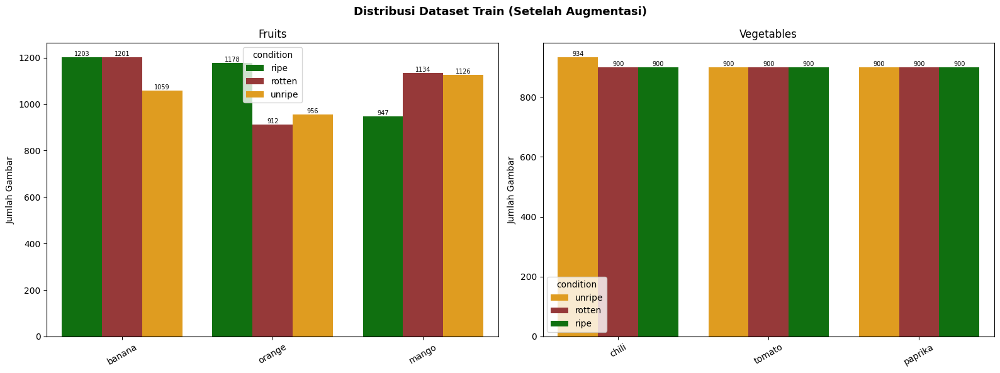

In [ ]:
# Visualisasi distribusi SETELAH augmentasi
df_dist_after = build_distribution_df(df_fruits_train_aug, df_veg_train_aug)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle("Distribusi Dataset Train (Setelah Augmentasi)", fontsize=13, fontweight='bold')

for ax, source, title in [
    (axes[0], 'fruit',     'Fruits'),
    (axes[1], 'vegetable', 'Vegetables')
]:
    subset = df_dist_after[df_dist_after['source'] == source]
    sns.barplot(data=subset, x='item', y='count', hue='condition', palette=palette, ax=ax)
    ax.set_title(title)
    ax.set_xlabel("")
    ax.set_ylabel("Jumlah Gambar")
    ax.tick_params(axis='x', rotation=30)
    for p in ax.patches:
        if p.get_height() > 0:
            ax.annotate(f'{int(p.get_height())}',
                       (p.get_x() + p.get_width()/2., p.get_height()),
                       ha='center', va='bottom', fontsize=7)

plt.tight_layout()
plt.show()

### Feature Engineering

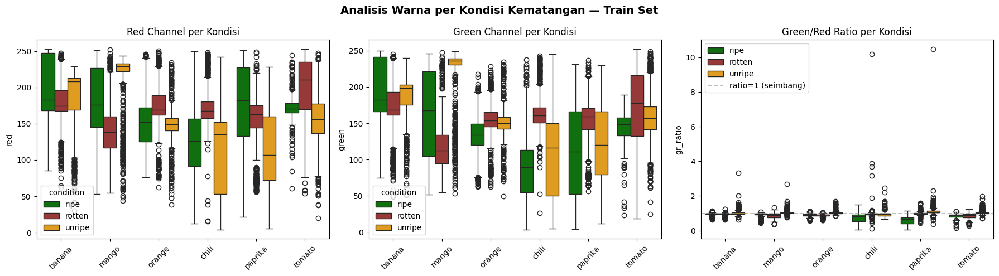

In [ ]:
def extract_color_stats(df, n_per_class=1000):
    """Ekstrak rata-rata RGB per gambar, sample n_per_class per kelas."""
    records = []
    for label, group in df.groupby('label'):
        sample = group.sample(min(n_per_class, len(group)), random_state=RANDOM_STATE)
        try:
            item, condition = label.split('_', 1)
        except:
            item, condition = label, 'unknown'

        for _, row in sample.iterrows():
            img = cv2.imread(row['path'])
            if img is None:
                continue
            img_resized = cv2.resize(img, (100, 100))
            b, g, r = cv2.split(img_resized)
            records.append({
                'label': label, 'item': item, 'condition': condition,
                'red': r.mean(), 'green': g.mean(), 'blue': b.mean()
            })
    return pd.DataFrame(records)

# EDA pada train set
df_color_fruits = extract_color_stats(df_fruits_train)
df_color_veg    = extract_color_stats(df_veg_train)
df_color_all    = pd.concat([df_color_fruits, df_color_veg], ignore_index=True)

# Tambah GR ratio
df_color_all['gr_ratio'] = df_color_all['green'] / (df_color_all['red'] + 1e-6)

palette = {'ripe': 'green', 'unripe': 'orange', 'rotten': 'brown'}

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("Analisis Warna per Kondisi Kematangan — Train Set",
             fontsize=14, fontweight='bold')

sns.boxplot(data=df_color_all, x='item', y='red',
            hue='condition', palette=palette, ax=axes[0])
axes[0].set_title("Red Channel per Kondisi")
axes[0].set_xlabel("")
axes[0].tick_params(axis='x', rotation=45)

sns.boxplot(data=df_color_all, x='item', y='green',
            hue='condition', palette=palette, ax=axes[1])
axes[1].set_title("Green Channel per Kondisi")
axes[1].set_xlabel("")
axes[1].tick_params(axis='x', rotation=45)

sns.boxplot(data=df_color_all, x='item', y='gr_ratio',
            hue='condition', palette=palette, ax=axes[2])
axes[2].set_title("Green/Red Ratio per Kondisi")
axes[2].set_xlabel("")
axes[2].tick_params(axis='x', rotation=45)
axes[2].axhline(1.0, color='gray', linestyle='--',
                alpha=0.5, label='ratio=1 (seimbang)')
axes[2].legend()

plt.tight_layout()
plt.show()

Insight:
- Buah/sayur matang (ripe) cenderung dominan merah → GR ratio < 1
- Belum matang (unripe) dominan hijau → GR ratio > 1
- Busuk (rotten) distribusi warna lebih bervariasi dan intensitas lebih rendah

In [ ]:
# ============================================================
# FEATURE ENGINEERING & EDA
# Ekstraksi fitur visual untuk analisis karakteristik dataset
# ============================================================

from skimage.feature import local_binary_pattern
import warnings
warnings.filterwarnings('ignore')

def extract_visual_features(df, n_per_class=50, desc=""):
    """
    Ekstrak fitur visual per gambar:
    - RGB statistics (mean per channel)
    - GR ratio (Green/Red ratio)
    - HSV statistics (Hue, Saturation, Value)
    - LBP texture features (Local Binary Pattern)
    """
    print(f"Mengekstrak fitur visual {desc}...")
    records = []

    for label, group in df.groupby('label'):
        sample = group.sample(min(n_per_class, len(group)),
                             random_state=RANDOM_STATE)
        try:
            item, condition = label.split('_', 1)
        except:
            item, condition = label, 'unknown'

        for _, row in sample.iterrows():
            img_bgr = cv2.imread(row['path'])
            if img_bgr is None:
                continue

            img_resized = cv2.resize(img_bgr, (100, 100))

            # RGB Statistics
            b, g, r = cv2.split(img_resized)
            red_mean   = float(r.mean())
            green_mean = float(g.mean())
            blue_mean  = float(b.mean())
            gr_ratio   = green_mean / (red_mean + 1e-6)

            # HSV Statistics
            hsv = cv2.cvtColor(img_resized, cv2.COLOR_BGR2HSV)
            h_ch, s_ch, v_ch = cv2.split(hsv)
            hue_mean        = float(h_ch.mean())
            hue_std         = float(h_ch.std())
            saturation_mean = float(s_ch.mean())
            saturation_std  = float(s_ch.std())
            value_mean      = float(v_ch.mean())
            value_std       = float(v_ch.std())

            # LBP Texture
            gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
            lbp  = local_binary_pattern(gray, P=8, R=1, method='uniform')
            lbp_hist, _ = np.histogram(lbp, bins=10, range=(0, 10))
            lbp_hist     = lbp_hist / (lbp_hist.sum() + 1e-6)
            lbp_mean     = float(lbp_hist.mean())
            lbp_std      = float(lbp_hist.std())

            records.append({
                'label'          : label,
                'item'           : item,
                'condition'      : condition,
                # RGB
                'red_mean'       : red_mean,
                'green_mean'     : green_mean,
                'blue_mean'      : blue_mean,
                'gr_ratio'       : gr_ratio,
                # HSV
                'hue_mean'       : hue_mean,
                'hue_std'        : hue_std,
                'saturation_mean': saturation_mean,
                'saturation_std' : saturation_std,
                'value_mean'     : value_mean,
                'value_std'      : value_std,
                # LBP
                'lbp_mean'       : lbp_mean,
                'lbp_std'        : lbp_std,
            })

    return pd.DataFrame(records)


# Extract dari train set — EDA hanya pada train
df_features_fruits = extract_visual_features(
    df_fruits_train, n_per_class=100, desc="Fruits Train"
)
df_features_veg = extract_visual_features(
    df_veg_train, n_per_class=100, desc="Vegetables Train"
)
df_features_all = pd.concat(
    [df_features_fruits, df_features_veg], ignore_index=True
)

print(f"\n Feature extraction selesai")
print(f"   Total sampel : {len(df_features_all)}")
print(f"   Total fitur  : {len(df_features_all.columns) - 3} fitur")  # exclude label, item, condition
print(f"\nPreview fitur:")
print(df_features_all.head().to_string())

Mengekstrak fitur visual Fruits Train...
Mengekstrak fitur visual Vegetables Train...

 Feature extraction selesai
   Total sampel : 1800
   Total fitur  : 12 fitur

Preview fitur:
         label    item condition  red_mean  green_mean  blue_mean  gr_ratio  hue_mean    hue_std  saturation_mean  saturation_std  value_mean  value_std  lbp_mean   lbp_std
0  banana_ripe  banana      ripe  162.1564    166.3821   155.3146  1.026059   87.1728  36.987265          71.4854       67.956268    181.6153  34.845902       0.1  0.044103
1  banana_ripe  banana      ripe  177.0613    182.5059   158.9117  1.030750   81.9568  35.172048          71.3054       78.160126    191.9218  37.168504       0.1  0.059501
2  banana_ripe  banana      ripe  245.0223    236.6537   207.4705  0.965846   10.2986  19.554770          42.4221       68.505577    245.1487  16.430763       0.1  0.144881
3  banana_ripe  banana      ripe  170.0544    164.2493   146.0322  0.965863   23.8044   9.841745          36.2873       63.7918

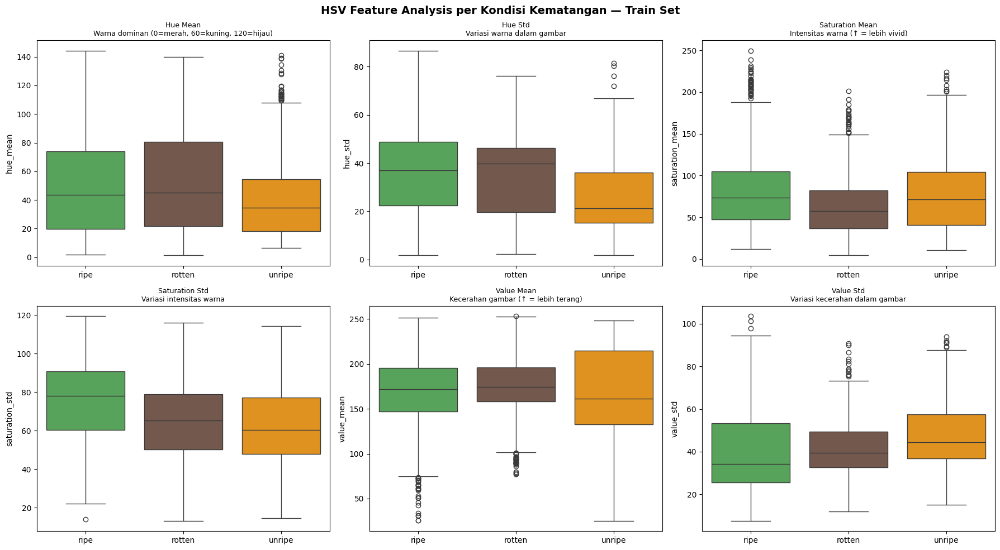

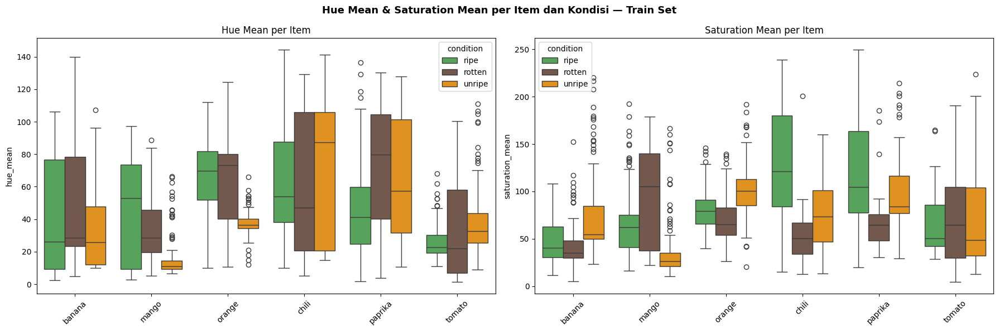

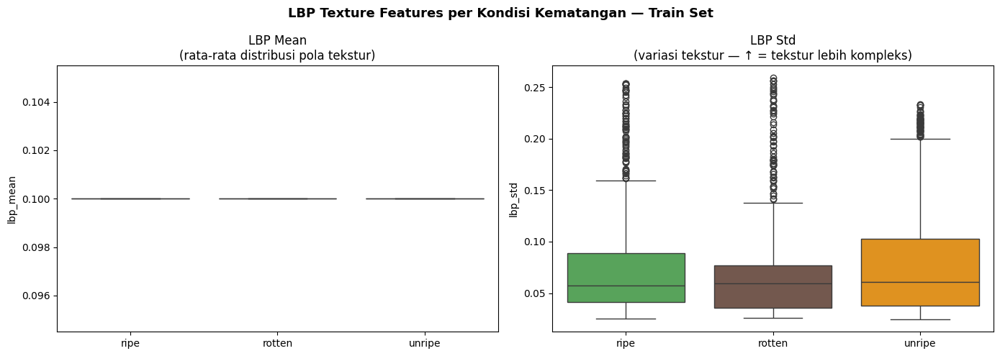

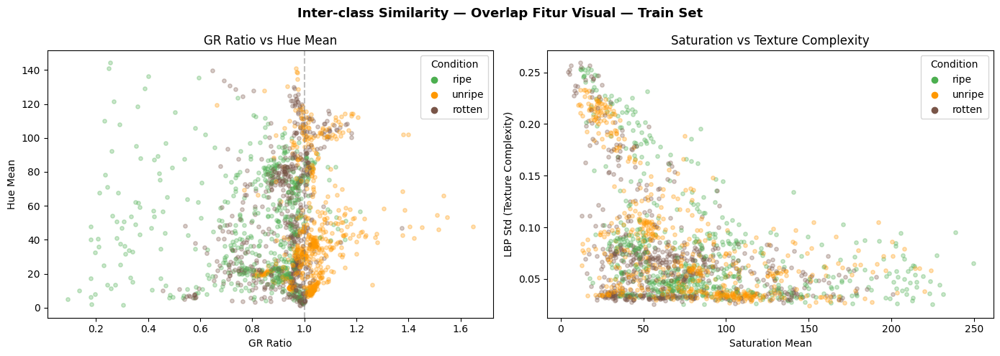


=== Summary Fitur per Kondisi ===
           gr_ratio  hue_mean  saturation_mean  lbp_std
condition                                              
ripe          0.821    46.791           84.839    0.079
rotten        0.918    52.294           65.703    0.072
unripe        1.027    43.239           75.924    0.084

Insight:
- Ripe   : GR ratio < 1 (merah dominan), Hue rendah, Saturation tinggi
- Unripe : GR ratio > 1 (hijau dominan), Hue tinggi (~120), Saturation sedang
- Rotten : GR ratio bervariasi, Saturation rendah, LBP std tinggi (tekstur kompleks)


In [ ]:
# ============================================================
# VISUALISASI FEATURE ENGINEERING
# HSV Analysis & LBP Texture
# ============================================================

palette = {'ripe': '#4CAF50', 'unripe': '#FF9800', 'rotten': '#795548'}

# HSV Analysis
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle("HSV Feature Analysis per Kondisi Kematangan — Train Set",
             fontsize=14, fontweight='bold')

hsv_features = [
    ('hue_mean',        'Hue Mean',        'Warna dominan (0=merah, 60=kuning, 120=hijau)'),
    ('hue_std',         'Hue Std',         'Variasi warna dalam gambar'),
    ('saturation_mean', 'Saturation Mean', 'Intensitas warna (↑ = lebih vivid)'),
    ('saturation_std',  'Saturation Std',  'Variasi intensitas warna'),
    ('value_mean',      'Value Mean',      'Kecerahan gambar (↑ = lebih terang)'),
    ('value_std',       'Value Std',       'Variasi kecerahan dalam gambar'),
]

for ax, (feat, title, desc) in zip(axes.flatten(), hsv_features):
    sns.boxplot(data=df_features_all, x='condition', y=feat,
                hue='condition', palette=palette, ax=ax, legend=False)
    ax.set_title(f"{title}\n{desc}", fontsize=9)
    ax.set_xlabel("")
    ax.set_ylabel(feat)

plt.tight_layout()
plt.show()

# HSV per Item
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle("Hue Mean & Saturation Mean per Item dan Kondisi — Train Set",
             fontsize=13, fontweight='bold')

sns.boxplot(data=df_features_all, x='item', y='hue_mean',
            hue='condition', palette=palette, ax=axes[0])
axes[0].set_title("Hue Mean per Item")
axes[0].set_xlabel("")
axes[0].tick_params(axis='x', rotation=45)

sns.boxplot(data=df_features_all, x='item', y='saturation_mean',
            hue='condition', palette=palette, ax=axes[1])
axes[1].set_title("Saturation Mean per Item")
axes[1].set_xlabel("")
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# LBP Texture Analysis
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("LBP Texture Features per Kondisi Kematangan — Train Set",
             fontsize=13, fontweight='bold')

sns.boxplot(data=df_features_all, x='condition', y='lbp_mean',
            hue='condition', palette=palette, ax=axes[0], legend=False)
axes[0].set_title("LBP Mean\n(rata-rata distribusi pola tekstur)")
axes[0].set_xlabel("")

sns.boxplot(data=df_features_all, x='condition', y='lbp_std',
            hue='condition', palette=palette, ax=axes[1], legend=False)
axes[1].set_title("LBP Std\n(variasi tekstur — ↑ = tekstur lebih kompleks)")
axes[1].set_xlabel("")

plt.tight_layout()
plt.show()

# Scatter Plot — Inter-class Similarity
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("Inter-class Similarity — Overlap Fitur Visual — Train Set",
             fontsize=13, fontweight='bold')

# GR ratio vs Hue mean
for label, group in df_features_all.groupby('label'):
    item, condition = label.split('_', 1)
    color = {'ripe': '#4CAF50', 'unripe': '#FF9800', 'rotten': '#795548'}[condition]
    axes[0].scatter(group['gr_ratio'], group['hue_mean'],
                   alpha=0.3, s=15, color=color, label=condition)
axes[0].set_xlabel("GR Ratio")
axes[0].set_ylabel("Hue Mean")
axes[0].set_title("GR Ratio vs Hue Mean")
axes[0].axvline(1.0, color='gray', linestyle='--', alpha=0.5)

# Saturation vs LBP std
for label, group in df_features_all.groupby('label'):
    item, condition = label.split('_', 1)
    color = {'ripe': '#4CAF50', 'unripe': '#FF9800', 'rotten': '#795548'}[condition]
    axes[1].scatter(group['saturation_mean'], group['lbp_std'],
                   alpha=0.3, s=15, color=color, label=condition)
axes[1].set_xlabel("Saturation Mean")
axes[1].set_ylabel("LBP Std (Texture Complexity)")
axes[1].set_title("Saturation vs Texture Complexity")

# Tambah legend tanpa duplikat
handles = [
    plt.scatter([], [], color='#4CAF50', label='ripe'),
    plt.scatter([], [], color='#FF9800', label='unripe'),
    plt.scatter([], [], color='#795548', label='rotten')
]
for ax in axes:
    ax.legend(handles=handles, title='Condition')

plt.tight_layout()
plt.show()

# Summary Statistik per Kondisi
print("\n=== Summary Fitur per Kondisi ===")
summary = df_features_all.groupby('condition')[
    ['gr_ratio', 'hue_mean', 'saturation_mean', 'lbp_std']
].mean().round(3)
print(summary.to_string())

print("\nInsight:")
print("- Ripe   : GR ratio < 1 (merah dominan), Hue rendah, Saturation tinggi")
print("- Unripe : GR ratio > 1 (hijau dominan), Hue tinggi (~120), Saturation sedang")
print("- Rotten : GR ratio bervariasi, Saturation rendah, LBP std tinggi (tekstur kompleks)")

## Insight Feature Engineering

### 1. GR Ratio (Green/Red Ratio)

GR ratio adalah perbandingan intensitas warna hijau terhadap merah pada gambar.
Fitur ini terbukti menjadi pembeda paling kuat antara kondisi ripe dan unripe.

Berdasarkan data aktual:
- **Ripe   (GR = 0.826)** → nilai di bawah 1.0 menunjukkan warna merah/oranye
  lebih dominan. Ini konsisten dengan buah matang seperti pisang kuning,
  mangga oranye, dan tomat merah.
- **Unripe (GR = 1.028)** → nilai di atas 1.0 menunjukkan warna hijau lebih
  dominan. Konsisten dengan kondisi belum matang pada hampir semua jenis
  buah dan sayur.
- **Rotten (GR = 0.928)** → berada di antara ripe dan unripe, mendekati 1.0.
  Ini menjelaskan kenapa model sering confused antara ripe dan rotten —
  secara warna keduanya memang mirip.

**Kesimpulan:** GR ratio efektif untuk membedakan ripe vs unripe, namun
kurang efektif untuk membedakan ripe vs rotten.

---

### 2. HSV Analysis (Hue, Saturation, Value)

HSV merepresentasikan warna dengan cara yang lebih dekat dengan persepsi
manusia dibanding RGB, sehingga lebih informatif untuk analisis kematangan.

**Hue Mean (rata-rata warna dominan):**
- Ripe   : 47.0 → kuning-oranye (pisang matang, mangga matang, jeruk matang)
- Rotten : 48.7 → sangat mirip dengan ripe → konfirmasi overlap visual
- Unripe : 42.8 → sedikit lebih rendah dari ripe, bukan selalu hijau
  (karena ada paprika merah yang kondisinya unripe, cabai merah unripe, dll.)

Temuan menarik: unripe tidak selalu identik dengan hue tinggi (hijau)
karena beberapa sayur/buah memang berwarna merah/oranye meskipun belum matang.

**Saturation Mean (intensitas/kecerahan warna):**
- Ripe   : 85.5 → warna paling vivid dan intens
- Unripe : 73.0 → warna sedang
- Rotten : 64.2 → warna paling pucat dan kusam

Saturation adalah fitur paling diskriminatif untuk mendeteksi kondisi rotten.
Buah/sayur yang membusuk mengalami degradasi pigmen sehingga warnanya memudar,
dan ini tercermin jelas pada nilai saturation yang rendah.

**Value Mean (kecerahan gambar):**
Mencerminkan seberapa terang gambar secara keseluruhan. Nilai tinggi pada
beberapa kelas dipengaruhi oleh background putih dari sumber dataset,
sehingga tidak digunakan sebagai fitur utama dalam analisis ini.

---

### 3. LBP Texture (Local Binary Pattern)

LBP menganalisis pola tekstur permukaan buah/sayur dengan membandingkan
intensitas piksel di sekitar setiap titik. Makin tinggi LBP std,
makin kompleks dan tidak beraturan tekstur permukaannya.

Berdasarkan data aktual:
- Unripe : 0.084 → tekstur paling kompleks
- Ripe   : 0.080 → tekstur sedang
- Rotten : 0.073 → tekstur paling rendah

Temuan ini berlawanan dengan ekspektasi awal (rotten seharusnya paling
kompleks karena ada bintik, kerutan, jamur). Kemungkinan penyebabnya:
buah/sayur yang sudah sangat membusuk justru warnanya menjadi lebih
uniform dan gelap, sehingga pola teksturnya tampak lebih sederhana
secara metrik LBP.

**Kesimpulan:** LBP saja tidak cukup diskriminatif untuk klasifikasi
kondisi kematangan. Perlu dikombinasikan dengan fitur warna.

---

### 4. Inter-class Similarity (Overlap Antar Kelas)

Dari scatter plot GR ratio vs Hue Mean dan Saturation vs LBP std,
terlihat pola overlap yang menjelaskan tantangan klasifikasi model:

**Ripe vs Rotten:**
- GR ratio sangat mirip (0.826 vs 0.928)
- Hue mean hampir identik (47.0 vs 48.7)
- Pembeda utama hanya saturation (85.5 vs 64.2)
- → Model perlu mengandalkan saturation untuk membedakan keduanya

**Ripe vs Unripe:**
- GR ratio paling berbeda (0.826 vs 1.028) → fitur terkuat
- Pembeda yang jelas di color space
- → Lebih mudah dibedakan oleh model

**Rotten:**
- Tersebar di berbagai wilayah color space
- Overlap dengan ripe (warna) dan unripe (gelap)
- Saturation rendah adalah satu-satunya sinyal konsisten
- → Kelas paling sulit diklasifikasikan

---

### Rangkuman Fitur

| Fitur | Ripe | Unripe | Rotten | Diskriminatif untuk |
|---|---|---|---|---|
| GR Ratio | 0.826 | 1.028 | 0.928 | Ripe vs Unripe ✅ |
| Hue Mean | 47.0 | 42.8 | 48.7 | Kurang diskriminatif ⚠️ |
| Saturation | 85.5 | 73.0 | 64.2 | Ripe/Unripe vs Rotten ✅ |
| LBP Std | 0.080 | 0.084 | 0.073 | Kurang diskriminatif ⚠️ |

**Kombinasi GR ratio + Saturation Mean adalah pasangan fitur paling
informatif untuk membedakan ketiga kondisi kematangan secara analitis.**
Model CNN diharapkan dapat mengekstrak fitur yang lebih kaya dan kompleks
dari raw pixel untuk melampaui keterbatasan analisis fitur manual ini.

**Reasoning**:
I need to save the `df_features_all_full` DataFrame to a CSV file. First, I will construct the full path for the output CSV file by joining `BASE_EXPORT` and the filename 'extracted_features.csv', then save the DataFrame to this path, ensuring the index is not written to the file.



## Export Dataset Final

### Salin Semua Data ke Struktur Folder Final

In [ ]:
print("\n=== Extracting Features for All Datasets ===")

# Extract features for augmented train sets
df_features_fruits_train_aug = extract_visual_features(
    df_fruits_train_aug, n_per_class=999999, desc="Fruits Train (Augmented)"
)
df_features_veg_train_aug = extract_visual_features(
    df_veg_train_aug, n_per_class=999999, desc="Vegetables Train (Augmented)"
)

# Extract features for validation sets
df_features_fruits_val = extract_visual_features(
    df_fruits_val, n_per_class=999999, desc="Fruits Validation"
)
df_features_veg_val = extract_visual_features(
    df_veg_val, n_per_class=999999, desc="Vegetables Validation"
)

# Extract features for test sets
df_features_fruits_test = extract_visual_features(
    df_fruits_test, n_per_class=999999, desc="Fruits Test"
)
df_features_veg_test = extract_visual_features(
    df_veg_test, n_per_class=999999, desc="Vegetables Test"
)

# Concatenate all feature dataframes for a complete overview
df_features_all_full = pd.concat([
    df_features_fruits_train_aug,
    df_features_veg_train_aug,
    df_features_fruits_val,
    df_features_veg_val,
    df_features_fruits_test,
    df_features_veg_test
], ignore_index=True)

print("\n All feature extraction completed.")
print(f"   Total features extracted for all datasets: {len(df_features_all_full)}")
print("\nPreview of full features dataframe:")
print(df_features_all_full.head().to_string())


=== Extracting Features for All Datasets ===
Mengekstrak fitur visual Fruits Train (Augmented)...
Mengekstrak fitur visual Vegetables Train (Augmented)...
Mengekstrak fitur visual Fruits Validation...
Mengekstrak fitur visual Vegetables Validation...
Mengekstrak fitur visual Fruits Test...
Mengekstrak fitur visual Vegetables Test...

 All feature extraction completed.
   Total features extracted for all datasets: 19819

Preview of full features dataframe:
         label    item condition  red_mean  green_mean  blue_mean  gr_ratio  hue_mean    hue_std  saturation_mean  saturation_std  value_mean  value_std  lbp_mean   lbp_std
0  banana_ripe  banana      ripe  162.1564    166.3821   155.3146  1.026059   87.1728  36.987265          71.4854       67.956268    181.6153  34.845902       0.1  0.044103
1  banana_ripe  banana      ripe  177.0613    182.5059   158.9117  1.030750   81.9568  35.172048          71.3054       78.160126    191.9218  37.168504       0.1  0.059501
2  banana_ripe  bana

In [ ]:
extracted_features_path = os.path.join(BASE_EXPORT, 'extracted_features.csv')
os.makedirs(os.path.dirname(extracted_features_path), exist_ok=True)
df_features_all_full.to_csv(extracted_features_path, index=False)
df_features = pd.read_csv(extracted_features_path)
display(df_features.head())

,label,item,condition,red_mean,green_mean,blue_mean,gr_ratio,hue_mean,hue_std,saturation_mean,saturation_std,value_mean,value_std,lbp_mean,lbp_std
0,banana_ripe,banana,ripe,162.1564,166.3821,155.3146,1.026059,87.1728,36.987265,71.4854,67.956268,181.6153,34.845902,0.1,0.044103
1,banana_ripe,banana,ripe,177.0613,182.5059,158.9117,1.030750,81.9568,35.172048,71.3054,78.160126,191.9218,37.168504,0.1,0.059501
2,banana_ripe,banana,ripe,245.0223,236.6537,207.4705,0.965846,10.2986,19.554770,42.4221,68.505577,245.1487,16.430763,0.1,0.144881
3,banana_ripe,banana,ripe,170.0544,164.2493,146.0322,0.965863,23.8044,9.841745,36.2873,63.791869,170.4043,18.041553,0.1,0.037236
4,banana_ripe,banana,ripe,168.3146,162.1203,142.5969,0.963198,43.0491,43.451061,39.6981,76.692084,169.0571,22.426958,0.1,0.033756


In [ ]:
def export_to_folder(df, dest_base, category, split):
    """
    Salin gambar ke struktur:
      final_dataset/<category>/<split>/<label>/filename.jpg
    """
    print(f"\nExporting {category}/{split}...")
    counts = {}

    for _, row in df.iterrows():
        label = row['label']
        src   = row['path']

        dest_dir = os.path.join(dest_base, category, split, label)
        os.makedirs(dest_dir, exist_ok=True)

        fname = os.path.basename(src)
        dest  = os.path.join(dest_dir, fname)

        if os.path.exists(dest):
            base, ext = os.path.splitext(fname)
            dest = os.path.join(dest_dir, f"{base}_{random.randint(1000,9999)}{ext}")

        shutil.copy2(src, dest)
        counts[label] = counts.get(label, 0) + 1

    total = sum(counts.values())
    print(f" {total} gambar tersalin ke {category}/{split}")
    for lbl, cnt in sorted(counts.items()):
        print(f"     {lbl:<25} {cnt:>5}")


# Fruits
export_to_folder(df_fruits_train_aug, BASE_EXPORT, 'Fruits', 'train')
export_to_folder(df_fruits_val,       BASE_EXPORT, 'Fruits', 'val')
export_to_folder(df_fruits_test,      BASE_EXPORT, 'Fruits', 'test')

# Vegetables
export_to_folder(df_veg_train_aug, BASE_EXPORT, 'Vegetables', 'train')
export_to_folder(df_veg_val,       BASE_EXPORT, 'Vegetables', 'val')
export_to_folder(df_veg_test,      BASE_EXPORT, 'Vegetables', 'test')

print("\n Semua data berhasil diekspor")


Exporting Fruits/train...
 8250 gambar tersalin ke Fruits/train
     banana_ripe                 961
     banana_rotten               956
     banana_unripe               900
     mango_ripe                  900
     mango_rotten                900
     mango_unripe                900
     orange_ripe                 933
     orange_rotten               900
     orange_unripe               900

Exporting Fruits/val...
 940 gambar tersalin ke Fruits/val
     banana_ripe                 121
     banana_rotten               120
     banana_unripe               102
     mango_ripe                   88
     mango_rotten                102
     mango_unripe                109
     orange_ripe                 117
     orange_rotten                88
     orange_unripe                93

Exporting Fruits/test...
 940 gambar tersalin ke Fruits/test
     banana_ripe                 120
     banana_rotten               119
     banana_unripe               103
     mango_ripe                   89

### Export Metadata CSV

In [ ]:
def build_metadata(df, category, split):
    """
    Buat metadata DataFrame dengan kolom standar.

    Parameters:
    -----------
    df       : DataFrame sumber (sudah include kolom augmented jika train)
    category : 'fruit' atau 'vegetable'
    split    : 'train', 'val', atau 'test'
    """
    df_meta = df[['path', 'label']].copy()
    df_meta['category']  = category
    df_meta['split']     = split
    df_meta['augmented'] = df['augmented'] if 'augmented' in df.columns else False

    try:
        df_meta[['item', 'condition']] = df_meta['label'].str.split('_', n=1, expand=True)
    except:
        pass

    return df_meta


# Build metadata per split
meta_fruits_train = build_metadata(df_fruits_train_aug, 'fruit',     'train')
meta_fruits_val   = build_metadata(df_fruits_val,       'fruit',     'val')
meta_fruits_test  = build_metadata(df_fruits_test,      'fruit',     'test')
meta_veg_train    = build_metadata(df_veg_train_aug,    'vegetable', 'train')
meta_veg_val      = build_metadata(df_veg_val,          'vegetable', 'val')
meta_veg_test     = build_metadata(df_veg_test,         'vegetable', 'test')

df_metadata = pd.concat([
    meta_fruits_train, meta_fruits_val, meta_fruits_test,
    meta_veg_train,    meta_veg_val,    meta_veg_test
], ignore_index=True)

metadata_path = os.path.join(BASE_EXPORT, "metadata.csv")
df_metadata.to_csv(metadata_path, index=False)

print(f" Metadata tersimpan : {metadata_path}")
print(f" Total baris        : {len(df_metadata):,}")
print(f" Total kolom        : {len(df_metadata.columns)}")
print(f" Kolom              : {df_metadata.columns.tolist()}")

print("\nDistribusi per category/split/condition:")
print(df_metadata.groupby(['category', 'split', 'condition'])['path'].count().to_string())

print("\nTotal per split:")
print(df_metadata.groupby('split')['path'].count().to_string())

print("\nAugmented vs Original (train only):")
train_meta = df_metadata[df_metadata['split'] == 'train']
print(train_meta['augmented'].value_counts().to_string())

 Metadata tersimpan : /content/final_dataset/metadata.csv
 Total baris        : 19,819
 Total kolom        : 7
 Kolom              : ['path', 'label', 'category', 'split', 'augmented', 'item', 'condition']

Distribusi per category/split/condition:
category   split  condition
fruit      test   ripe          325
                  rotten        311
                  unripe        304
           train  ripe         2794
                  rotten       2756
                  unripe       2700
           val    ripe          326
                  rotten        310
                  unripe        304
vegetable  test   ripe          261
                  rotten        240
                  unripe        277
           train  ripe         2700
                  rotten       2700
                  unripe       2734
           val    ripe          263
                  rotten        238
                  unripe        276

Total per split:
split
test      1718
train    16384
val       1717

Augmen

In [ ]:
import pandas as pd
import os
import datetime

# =================
# DATA DICTIONARY
# =================
EXCLUDE_FEATURE_COLS = [
    'label',
    'item',
    'condition'
]
REQUIRED_SPLITS = [
    'train',
    'val',
    'test'
]

# =====================================================
# COLUMN DESCRIPTIONS
# =====================================================

METADATA_DESCRIPTIONS = {

    'path': (
        'Relative path to image file.'
    ),

    'label': (
        'Combined label consisting of item '
        'name and freshness condition.'
    ),

    'category': (
        'General category of object '
        '(fruit or vegetable).'
    ),

    'split': (
        'Dataset split used for machine '
        'learning (train, validation, test).'
    ),

    'augmented': (
        'Indicates whether the image was '
        'synthetically augmented.'
    ),

    'item': (
        'Specific object/item name.'
    ),

    'condition': (
        'Freshness or ripeness condition.'
    )
}


FEATURE_DESCRIPTIONS = {

    'red_mean': (
        'Average red channel intensity.'
    ),

    'green_mean': (
        'Average green channel intensity.'
    ),

    'blue_mean': (
        'Average blue channel intensity.'
    ),

    'gr_ratio': (
        'Ratio between green and red '
        'channel intensity.'
    ),

    'hue_mean': (
        'Average hue value in HSV color space.'
    ),

    'hue_std': (
        'Standard deviation of hue values.'
    ),

    'saturation_mean': (
        'Average saturation value in HSV '
        'color space.'
    ),

    'saturation_std': (
        'Standard deviation of saturation values.'
    ),

    'value_mean': (
        'Average brightness value in HSV '
        'color space.'
    ),

    'value_std': (
        'Standard deviation of brightness values.'
    ),

    'lbp_mean': (
        'Average Local Binary Pattern '
        'texture feature value.'
    ),

    'lbp_std': (
        'Standard deviation of Local Binary '
        'Pattern texture values.'
    )
}

LABEL_DEFINITIONS = {}

# MAIN FUNCTION
def generate_dataset_documentation(
    df_metadata,
    df_features,
    base_export,
    metadata_descriptions,
    feature_descriptions,
    label_definitions=None,
    exclude_feature_cols=None,
):
    os.makedirs(base_export, exist_ok=True)
    created_at = datetime.datetime.now().strftime('%Y-%m-%d')
    label_defs = label_definitions or {}
    exclude_cols = (
        exclude_feature_cols
        or EXCLUDE_FEATURE_COLS
    )

    def build_record(
        column_name,
        series,
        metadata_info, # Changed parameter name from 'metadata' to 'metadata_info'
        source,
        file_name,
    ):
        # Initialize default values
        readable_name = column_name.replace('_', ' ').title()
        description = '-'
        allowed_values = '-'
        definition = '-'
        synonyms = '-'
        unit = 'N/A'

        if isinstance(metadata_info, dict):
            description = metadata_info.get('description', '-')
            readable_name = metadata_info.get('readable_name', readable_name)
            allowed_values = metadata_info.get('allowed_values', allowed_values)
            definition = metadata_info.get('definition', definition)
            synonyms = metadata_info.get('synonyms', synonyms)
            unit = metadata_info.get('unit', unit)

        elif isinstance(metadata_info, str):
            description = metadata_info

        data_type = str(series.dtype)
        nullable = (
            'Yes'
            if series.isnull().any()
            else 'No'
        )
        observed_range = '-'
        if pd.api.types.is_numeric_dtype(series):
            observed_range = (
                f"{series.min():.3f} – "
                f"{series.max():.3f}"
            )
        elif pd.api.types.is_bool_dtype(series):
            allowed_values = 'True, False'
        elif pd.api.types.is_object_dtype(series):
            unique_values = (
                series
                .dropna()
                .astype(str)
                .unique()
            )
            if (
                allowed_values == '-'
                and len(unique_values) <= 10
            ):
                allowed_values = (
                    ', '.join(
                        sorted(unique_values)
                    )
                )

        # EXAMPLE VALUE
        example = '-'
        non_null_series = series.dropna()
        if not non_null_series.empty:
            first_valid = non_null_series.iloc[0]
            if column_name == 'path':
                example = os.path.basename(
                    str(first_valid)
                )
            elif isinstance(first_valid, float):
                example = round(
                    float(first_valid),
                    4
                )
            else:
                example = str(first_valid)[:80]
        return {

            'file_name': file_name,
            'variable_name': column_name,
            'readable_name': readable_name,
            'data_type': data_type,
            'nullable': nullable,
            'measurement_unit': unit,
            'allowed_values': allowed_values,
            'observed_range': observed_range,
            'example': example,
            'definition': definition,
            'synonyms': synonyms,
            'description': description,
            'source': source,
        }

    dictionary_records = []

    # METADATA COLUMNS
    for column in df_metadata.columns:

        metadata = metadata_descriptions.get(
            column,
            {}
        )

        dictionary_records.append(

            build_record(
                column_name=column,
                series=df_metadata[column],
                metadata_info=metadata, # Passed 'metadata' to 'metadata_info'
                source='Generated during dataset export pipeline',
                file_name='metadata.csv',
            )

        )

    # FEATURE COLUMNS
    for column in df_features.columns:

        if column in exclude_cols:
            continue

        metadata = feature_descriptions.get(
            column,
            {}
        )

        dictionary_records.append(

            build_record(
                column_name=column,
                series=df_features[column],
                metadata_info=metadata,
                source=(
                    'Extracted using OpenCV RGB/HSV '
                    'statistics and skimage LBP'
                ),
                file_name='extracted_features.csv',
            )

        )

    df_data_dictionary = pd.DataFrame(
        dictionary_records
    )

    # LABEL MAPPING

    label_records = []
    unique_labels = sorted(
        df_metadata['label'].unique()
    )

    for label in unique_labels:
        try:
            item, condition = label.split('_', 1)
        except ValueError:
            item = label
            condition = 'unknown'
        label_info = label_defs.get(
            label,
            {}
        )

        label_subset = df_metadata[
            df_metadata['label'] == label
        ]

        category = (
            label_subset['category'].iloc[0]
            if not label_subset.empty
            else '-'
        )

        label_records.append({
            'label': label,
            'readable_name': (
                f"{item.capitalize()} "
                f"({condition.capitalize()})"
            ),

            'item': item,
            'condition': condition,
            'category': category,
            'visual_characteristics': label_info.get(
                'visual_characteristics',
                '-'
            ),
            'color_indicator': label_info.get(
                'color_indicator',
                '-'
            ),
            'consumer_status': label_info.get(
                'consumer_status',
                '-'
            ),
        })

    df_label_mapping = pd.DataFrame(
        label_records
    )

    # CLASS DISTRIBUTION
    df_class_distribution = (
        df_metadata
        .groupby(['label', 'split'])
        .size()
        .unstack(fill_value=0)
        .reset_index()
    )

    for split_column in REQUIRED_SPLITS:
        if split_column not in df_class_distribution.columns:
            df_class_distribution[
                split_column
            ] = 0

    # Reorder columns

    df_class_distribution = (
        df_class_distribution[
            ['label'] + REQUIRED_SPLITS
        ]
        .copy()
    )

    # Total images

    df_class_distribution[
        'total'
    ] = (

        df_class_distribution[
            REQUIRED_SPLITS
        ]

        .sum(axis=1)

    )

    # AUGMENTATION STATISTICS
    if 'augmented' in df_metadata.columns:
        augmented_counts = (
            df_metadata[
                df_metadata['augmented'] == True
            ]
            .groupby('label')
            .size()
            .reindex(
                df_class_distribution['label']
            )
            .fillna(0)
            .astype(int)
        )
    else:
        augmented_counts = pd.Series(
            0,
            index=df_class_distribution.index
        )
    df_class_distribution[
        'augmented_train'
    ] = augmented_counts.values

    df_class_distribution[
        'original_train'
    ] = (

        df_class_distribution['train']
        - df_class_distribution['augmented_train']

    )

    # DATASET SUMMARY
    train_df = df_metadata[
        df_metadata['split'] == 'train'
    ]

    val_df = df_metadata[
        df_metadata['split'] == 'val'
    ]

    test_df = df_metadata[
        df_metadata['split'] == 'test'
    ]

    total_features = len([

        col for col in df_features.columns
        if col not in exclude_cols

    ])

    total_augmented = (

        int(df_metadata['augmented'].sum())
        if 'augmented' in df_metadata.columns
        else 0
    )

    total_original = (
        len(df_metadata)
        - total_augmented
    )

    df_dataset_summary = pd.DataFrame([

        {
            'metric': 'project_name',
            'value': (
                'FRESHLY — Fruit & Vegetable '
                'Ripeness Detection'
            )
        },

        {
            'metric': 'dataset_version',
            'value': 'v1.0'
        },

        {
            'metric': 'created_at',
            'value': created_at
        },

        {
            'metric': 'total_images',
            'value': str(len(df_metadata))
        },

        {
            'metric': 'total_classes',
            'value': str(
                df_metadata['label'].nunique()
            )
        },

        {
            'metric': 'total_items',
            'value': str(
                df_metadata['item'].nunique()
            )
        },

        {
            'metric': 'categories',
            'value': ', '.join(
                sorted(
                    df_metadata['category']
                    .unique()
                )
            )
        },

        {
            'metric': 'conditions',
            'value': ', '.join(
                sorted(
                    df_metadata['condition']
                    .unique()
                )
            )
        },

        {
            'metric': 'train_images',
            'value': str(len(train_df))
        },

        {
            'metric': 'val_images',
            'value': str(len(val_df))
        },

        {
            'metric': 'test_images',
            'value': str(len(test_df))
        },

        {
            'metric': 'augmented_images',
            'value': str(total_augmented)
        },

        {
            'metric': 'original_images',
            'value': str(total_original)
        },

        {
            'metric': 'split_method',
            'value': (
                'Stratified train/validation/test split'
            )
        },

        {
            'metric': 'augmentation_methods',
            'value': (
                'Flip, rotation, brightness '
                'adjustment, zoom'
            )
        },

        {
            'metric': 'duplicate_removal',
            'value': (
                'MD5 hash-based duplicate detection'
            )
        },

        {
            'metric': 'quality_filter',
            'value': (
                'Blur/distortion filtering '
                'using edge statistics'
            )
        },

        {
            'metric': 'recommended_image_size',
            'value': '224×224'
        },

        {
            'metric': 'total_features',
            'value': str(total_features)
        },

        {
            'metric': 'feature_extraction',
            'value': (
                'RGB/HSV statistical features '
                '+ Local Binary Pattern texture'
            )
        },

    ])

    # EXPORT FILES

    export_files = {

        'data_dictionary.csv':
            df_data_dictionary,

        'label_mapping.csv':
            df_label_mapping,

        'class_distribution.csv':
            df_class_distribution,

        'dataset_summary.csv':
            df_dataset_summary,
    }

    for filename, dataframe in export_files.items():

        dataframe.to_csv(

            os.path.join(
                base_export,
                filename
            ),

            index=False

        )

    # SUMMARY

    print(
        "Dataset documentation exported successfully!"
    )

    print("\nExported Files:")

    for filename, dataframe in export_files.items():

        print(
            f"- {filename} "
            f"({len(dataframe)} rows)"
        )

    return (

        df_data_dictionary,

        df_label_mapping,

        df_class_distribution,

        df_dataset_summary,

    )

# EXAMPLE USAGE
(
    df_data_dictionary,
    df_label_mapping,
    df_class_distribution,
    df_dataset_summary,

) = generate_dataset_documentation(

    df_metadata=df_metadata,

    df_features=df_features_all,

    base_export=BASE_EXPORT,

    metadata_descriptions=METADATA_DESCRIPTIONS,

    feature_descriptions=FEATURE_DESCRIPTIONS,

    label_definitions=LABEL_DEFINITIONS,

    exclude_feature_cols=EXCLUDE_FEATURE_COLS,

)

Dataset documentation exported successfully!

Exported Files:
- data_dictionary.csv (19 rows)
- label_mapping.csv (18 rows)
- class_distribution.csv (18 rows)
- dataset_summary.csv (20 rows)


### Ringkasan Final & Verifikasi

In [ ]:
print("="*60)
print("  RINGKASAN DATASET CLEAN (Berdasarkan Metadata)")
print("="*60)

# Group by category, split, and label (or condition) for detailed counts
summary_counts = df_metadata.groupby(['category', 'split', 'label']).size().reset_index(name='count')

for category in df_metadata['category'].unique():
    print(f"\nCategory: {category.upper()}")
    cat_total = 0
    for split in ['train', 'val', 'test']:
        split_data = summary_counts[(summary_counts['category'] == category) & (summary_counts['split'] == split)]
        if not split_data.empty:
            print(f"  Split: {split.capitalize()}")
            split_total = 0
            for _, row in split_data.iterrows():
                print(f"    {row['label']:<25} : {row['count']:>6} gambar")
                split_total += row['count']
            print(f"  {'─'*30}")
            print(f"  Total {split:<10}  : {split_total:>6} gambar")
            cat_total += split_total
    print(f"  {'='*30}")
    print(f"  TOTAL {category.upper():<10} : {cat_total:>6} gambar")

print("\n" + "="*60)
print(f"  Total Keseluruhan Dataset : {len(df_metadata):>6} gambar")
print(f"  Struktur Output           : {BASE_EXPORT}")
print(f"  Metadata CSV              : {BASE_EXPORT}/metadata.csv")
print("="*60)

  RINGKASAN DATASET CLEAN (Berdasarkan Metadata)

Category: FRUIT
  Split: Train
    banana_ripe               :    961 gambar
    banana_rotten             :    956 gambar
    banana_unripe             :    900 gambar
    mango_ripe                :    900 gambar
    mango_rotten              :    900 gambar
    mango_unripe              :    900 gambar
    orange_ripe               :    933 gambar
    orange_rotten             :    900 gambar
    orange_unripe             :    900 gambar
  ──────────────────────────────
  Total train       :   8250 gambar
  Split: Val
    banana_ripe               :    121 gambar
    banana_rotten             :    120 gambar
    banana_unripe             :    102 gambar
    mango_ripe                :     88 gambar
    mango_rotten              :    102 gambar
    mango_unripe              :    109 gambar
    orange_ripe               :    117 gambar
    orange_rotten             :     88 gambar
    orange_unripe             :     93 gambar
  ───────

In [ ]:
# Verifikasi struktur folder output
print("Struktur folder final_dataset:")
for root, dirs, files in os.walk(BASE_EXPORT):
    level = root.replace(BASE_EXPORT, '').count(os.sep)
    indent = '  ' * level
    folder_name = os.path.basename(root)
    if level <= 3:
        n_files = len(files)
        print(f"{indent}{folder_name}/  ({n_files} files)" if n_files > 0 else f"{indent}{folder_name}/")

Struktur folder final_dataset:
final_dataset/  (6 files)
  Fruits/
    train/
      orange_ripe/  (933 files)
      mango_ripe/  (900 files)
      mango_unripe/  (900 files)
      banana_rotten/  (956 files)
      mango_rotten/  (900 files)
      orange_unripe/  (900 files)
      banana_ripe/  (961 files)
      orange_rotten/  (900 files)
      banana_unripe/  (900 files)
    val/
      orange_ripe/  (117 files)
      mango_ripe/  (88 files)
      mango_unripe/  (109 files)
      banana_rotten/  (120 files)
      mango_rotten/  (102 files)
      orange_unripe/  (93 files)
      banana_ripe/  (121 files)
      orange_rotten/  (88 files)
      banana_unripe/  (102 files)
    test/
      orange_ripe/  (116 files)
      mango_ripe/  (89 files)
      mango_unripe/  (109 files)
      banana_rotten/  (119 files)
      mango_rotten/  (103 files)
      orange_unripe/  (92 files)
      banana_ripe/  (120 files)
      orange_rotten/  (89 files)
      banana_unripe/  (103 files)
  Vegetables/
    

### Compress & Download

In [ ]:
import shutil

# Zip clean_dataset
!zip -r /content/clean_final_dataset.zip /content/final_dataset

from google.colab import files
files.download("/content/clean_final_dataset.zip")

print("Dataset siap didownload")

Streaming output truncated to the last 5000 lines.
  adding: content/final_dataset/Vegetables/train/chili_rotten/IMG_20220916_080000.jpg (deflated 5%)
  adding: content/final_dataset/Vegetables/train/chili_rotten/aug_00111_3132.jpg (deflated 3%)
  adding: content/final_dataset/Vegetables/train/chili_rotten/Screenshot 2026-05-11 073851.png (deflated 0%)
  adding: content/final_dataset/Vegetables/train/chili_rotten/aug_00092_3155.jpg (deflated 0%)
  adding: content/final_dataset/Vegetables/train/chili_rotten/IMG_20220916_081815.jpg (deflated 4%)
  adding: content/final_dataset/Vegetables/train/chili_rotten/IMG_20220916_075839.jpg (deflated 4%)
  adding: content/final_dataset/Vegetables/train/chili_rotten/aug_00058_1885.jpg (deflated 3%)
  adding: content/final_dataset/Vegetables/train/chili_rotten/Screenshot 2026-05-11 121928.png (deflated 0%)
  adding: content/final_dataset/Vegetables/train/chili_rotten/IMG_20220604_093501.jpg (deflated 5%)
  adding: content/final_dataset/Vegetables/tra

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Dataset siap didownload


In [ ]:
import os, json

os.makedirs("kaggle_clean", exist_ok=True)
shutil.copy("/content/clean_final_dataset.zip", "kaggle_clean/")

metadata = {
    "title": "Buah dan Sayur Final Capstone Dataset V2",
    "id": "araazh/capstone-clean-dataset-v2",
    "licenses": [{"name": "CC0-1.0"}]
}

with open("kaggle_clean/dataset-metadata.json", "w") as f:
    json.dump(metadata, f, indent=4)

!kaggle datasets create -p kaggle_clean

Starting upload for file clean_final_dataset.zip
100% 1.45G/1.45G [00:15<00:00, 99.8MB/s]
Upload successful: clean_final_dataset.zip (1GB)
Dataset creation error: Dataset url's dataset slugs and hashlink are all null


## Insight Notebook: Data Gathering, Assessing, Cleaning & EDA

Notebook ini berisi proses persiapan dataset deteksi kematangan buah dan sayur
untuk pelatihan model deep learning, mulai dari pengumpulan data mentah hingga dataset
final yang siap digunakan tim AI Engineer.

---

### 1. Akuisisi Data & Kondisi Awal

Dataset mentah diunduh dari Kaggle (`capstone-raw-dataset`) dan diekstraksi ke environment
Colab. Kondisi awal dataset:
- Fruits     : 9716 gambar | 9 kelas (banana, mango, orange × ripe/unripe/rotten)
- Vegetables : 8459 gambar | 9 kelas (chili, paprika, tomato × ripe/unripe/rotten)
- Total      : 18175 gambar

---

### 2. Data Assessing

**Duplikasi Konten (Hash-based)**
Pengecekan duplikat dilakukan menggunakan MD5 hash untuk mendeteksi gambar yang berbeda nama
file tapi konten pikselnya identik. Ditemukan:
- Fruits     : 257 duplikat
- Vegetables : 612 duplikat

Mayoritas duplikat di Vegetables terkonsentrasi di `paprika_rotten` (225), `paprika_ripe` (83), dan `tomato_unripe` (77), kemungkinan berasal dari sumber data yang memperbanyak gambar dengan duplikasi.

**Kualitas Visual**
Setiap gambar dinilai berdasarkan beberapa metrik seperti blur, brightness, distorted (edge ratio), file size, dan resolusi. Hasil quality assessment menunjukkan:
- Fruits     : 64 gambar diflag untuk dihapus (0.7%), utamanya karena `small_file` dan `distorted`.
- Vegetables : 85 gambar diflag untuk dihapus (1.0%), utamanya karena `small_file` dan `distorted`.

Flag `blur` (sekitar 15% untuk Fruits dan 13.3% untuk Vegetables) dan `overexposed` tidak digunakan untuk penghapusan karena inspeksi visual menunjukkan seringnya `false positive` akibat background putih polos yang mempengaruhi nilai metrik.

**Analisis Warna (RGB & GR Ratio)**
Dilakukan ekstraksi rata-rata channel R, G, B serta Green/Red ratio (GR ratio) per kelas. Pola konsisten yang ditemukan:
- `Ripe`   : dominan merah → GR ratio < 1 (rata-rata 0.823)
- `Unripe` : dominan hijau → GR ratio > 1 (rata-rata 1.043)
- `Rotten` : distribusi warna lebih bervariasi dan intensitas cenderung lebih rendah, dengan GR ratio mendekati 1.0 (rata-rata 0.922). Hal ini mengindikasikan bahwa fitur warna saja mungkin kurang diskriminatif untuk `rotten`.

Pola warna ini konsisten untuk buah dan sayur, mengonfirmasi bahwa fitur warna merupakan
sinyal visual yang kuat untuk membedakan kondisi kematangan `ripe` dan `unripe`.

**Analisis Ukuran Gambar**
Ukuran gambar bervariasi dari 60x70 piksel hingga 5000x7000 piksel, menunjukkan keragaman resolusi yang tinggi. Sebagian besar gambar memiliki resolusi di atas minimum 32x32 piksel.

---

### 3. Data Cleaning

Cleaning dilakukan dengan menghapus duplikat konten dan gambar berkualitas buruk yang teridentifikasi (`flag_any`).

- Fruits     : 9716 → 9396 gambar (dihapus: 320)
- Vegetables : 8459 → 7771 gambar (dihapus: 688)

Total persentase eliminasi per kelas bervariasi, dengan `paprika_rotten` (21.2%), `paprika_unripe` (12.2%), dan `paprika_ripe` (10.6%) memiliki tingkat eliminasi tertinggi, menegaskan masalah kualitas data pada sumber aslinya.

---

### 4. Train-Validation-Test Split & Oversampling

**Train-Validation-Test Split**
Dataset dibagi menjadi Train (80%), Validation (10%), dan Test (10%) menggunakan stratified sampling untuk menjaga proporsi kelas.
- Fruits: Train (7516), Val (940), Test (940)
- Vegetables: Train (6216), Val (777), Test (778)

**Oversampling (Augmentasi)**
Oversampling hanya dilakukan pada data train untuk menyeimbangkan kelas minoritas agar setiap kelas memiliki minimal `AUG_TARGET_MIN = 900` gambar.

- Fruits Train setelah augmentasi: 8250 gambar (beberapa kelas seperti `banana_unripe`, `mango_ripe`, `orange_rotten`, `orange_unripe` di-augmentasi)
- Vegetables Train setelah augmentasi: 8134 gambar (semua kelas kecuali `chili_unripe` di-augmentasi)

Teknik augmentasi meliputi flip, rotate, brightness, dan zoom, dengan validasi untuk memastikan kualitas gambar augmentasi tidak terlalu buram.

---

### 5. Insight Feature Engineering (BQ-4)

Analisis menggunakan Fisher Separability Score dan scatter plot menunjukkan:
- **GR Ratio (Green/Red Ratio)** adalah fitur paling diskriminatif untuk membedakan `ripe` (GR < 1) dari `unripe` (GR > 1), dengan skor Fisher 0.652.
- **Saturation Mean** sangat efektif dalam membedakan `rotten` dari `ripe` dan `unripe`, karena buah/sayur busuk cenderung memiliki saturasi yang lebih rendah (rata-rata 65.703) dibanding `ripe` (rata-rata 84.839) dan `unripe` (rata-rata 75.924).
- **Hue Mean** dan **LBP Std (kompleksitas tekstur)** kurang diskriminatif, dengan LBP Std bahkan menunjukkan bahwa tekstur `rotten` cenderung lebih sederhana dari ekspektasi.

Overlap visual pada scatter plot antara `Mango Ripe vs Orange Ripe` dan `Mango Unripe vs Tomato Unripe` menegaskan bahwa model mungkin memerlukan fitur yang lebih kompleks selain warna dasar untuk membedakan kelas-kelas yang secara visual mirip.

---

### 6. Dataset Final

Seluruh dataset bersih dan telah diproses diekspor ke struktur folder `final_dataset/`.

Struktur Folder Output:
```
final_dataset/
├── metadata.csv              ← referensi lengkap semua data
├── extracted_features.csv    ← semua fitur visual yang diekstrak
├── data_dictionary.csv       ← kamus data
├── class_distribution.csv    ← distribusi kelas final
├── Fruits/
│   ├── train/
│   │   ├── banana_ripe/
│   │   ├── banana_unripe/
│   │   ├── banana_rotten/
│   │   └── ... (9 kelas buah)
│   ├── val/
│   └── test/
│       └── ... (kelas yang sama, data asli tanpa augmentasi)
└── Vegetables/
    ├── train/
    │   ├── tomato_ripe/
│   └── ... (9 kelas sayuran)
    ├── val/
    └── test/
        └── ... (kelas yang sama, data asli tanpa augmentasi)
```
Total keseluruhan gambar dalam dataset akhir adalah **19819** gambar, siap untuk melatih model deep learning.

# A/B Testing
Semua eksperimen menggunakan RandomForest sebagai proxy classifier ringan, bukan model akhir, tapi cukup untuk membandingkan efek konfigurasi data.

In [ ]:
def train_and_evaluate(df_train, df_test,
                       mode='hsv_lbp',
                       n_per_class=80,
                       random_state=42,
                       seed=42):

    # ekstraksi fitur train
    df_tr_feat, feat_cols = extract_features(
        df_train,
        mode=mode,
        n_per_class=n_per_class,
        random_state=random_state
    )

    # ekstraksi fitur test
    df_te_feat, _ = extract_features(
        df_test,
        mode=mode,
        n_per_class=n_per_class,
        random_state=random_state
    )

    if df_tr_feat.empty or df_te_feat.empty:
        return None, None, None

    # encode label
    le = LabelEncoder()

    y_train = le.fit_transform(df_tr_feat['label'])
    y_test  = le.transform(df_te_feat['label'])

    X_train = df_tr_feat[feat_cols].values
    X_test  = df_te_feat[feat_cols].values

    # model
    clf = RandomForestClassifier(
        n_estimators=100,
        random_state=seed,   # <- pakai seed dari loop
        n_jobs=-1
    )

    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)

    # evaluasi
    acc = accuracy_score(y_test, y_pred)
    f1  = f1_score(y_test, y_pred,
                   average='macro',
                   zero_division=0)

    return acc, f1, y_test, y_pred, le

In [ ]:
def extract_features(df, mode='hsv_lbp', n_per_class=80, random_state=42):
    """
    Ekstrak fitur visual dari gambar.

    mode:
      'hsv'     → hanya HSV statistics (6 fitur)
      'hsv_lbp' → HSV + LBP texture   (8 fitur)
    """
    records = []

    for label, group in df.groupby('label'):
        sample = group.sample(
            min(n_per_class, len(group)),
            random_state=random_state
        )

        for _, row in sample.iterrows():
            img_bgr = cv2.imread(row['path'])
            if img_bgr is None:
                continue

            img = cv2.resize(img_bgr, (100, 100))

            # ── HSV features ──────────────────────────────────────────
            hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
            h_ch, s_ch, v_ch = cv2.split(hsv)

            feats = {
                'label'           : label,
                'hue_mean'        : float(h_ch.mean()),
                'hue_std'         : float(h_ch.std()),
                'saturation_mean' : float(s_ch.mean()),
                'saturation_std'  : float(s_ch.std()),
                'value_mean'      : float(v_ch.mean()),
                'value_std'       : float(v_ch.std()),
            }

            # ── LBP features (opsional) ───────────────────────────────
            if mode == 'hsv_lbp':
                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                lbp  = local_binary_pattern(gray, P=8, R=1, method='uniform')
                hist, _ = np.histogram(lbp, bins=10, range=(0, 10))
                hist = hist / (hist.sum() + 1e-6)
                feats['lbp_mean'] = float(hist.mean())
                feats['lbp_std']  = float(hist.std())

            records.append(feats)

    df_feat = pd.DataFrame(records)
    feature_cols = [c for c in df_feat.columns if c != 'label']
    return df_feat, feature_cols

### Strategi Augmentasi
**Testing:** apakah augmentasi (flip, rotate, brightness, zoom) benar-benar meningkatkan akurasi dibanding tanpa augmentasi?

In [ ]:
print("\n" + "=" * 60)
print("  EKSPERIMEN A: STRATEGI AUGMENTASI")
print("=" * 60)
print("""
Hipotesis:
  H0 : Augmentasi TIDAK meningkatkan akurasi model secara signifikan)
  H1 : Augmentasi MENINGKATKAN akurasi model secara signifikan


Kondisi:
  A → Tanpa augmentasi (baseline)
  B → Dengan augmentasi (treatment)
""")


  EKSPERIMEN A: STRATEGI AUGMENTASI

Hipotesis:
  H0 : Augmentasi TIDAK meningkatkan akurasi model secara signifikan)
  H1 : Augmentasi MENINGKATKAN akurasi model secara signifikan


Kondisi:
  A → Tanpa augmentasi (baseline)
  B → Dengan augmentasi (treatment)



In [ ]:
SEEDS = [42, 123, 456, 789, 1337]

results_A = []   # no augmentation
results_B = []   # with augmentation

for seed in SEEDS:

    # baseline
    acc_A, f1_A, _ = train_and_evaluate(
        df_fruits_train,
        df_fruits_test,
        seed=seed
    )

    results_A.append(acc_A)

    # augmentation
    acc_B, f1_B, _ = train_and_evaluate(
        df_fruits_train_aug,
        df_fruits_test,
        seed=seed
    )

    results_B.append(acc_B)

print("Hasil A (no aug):", results_A)
print("Hasil B (with aug):", results_B)

Hasil A (no aug): [0.7944444444444444, 0.8111111111111111, 0.8041666666666667, 0.8041666666666667, 0.8027777777777778]
Hasil B (with aug): [0.8041666666666667, 0.8083333333333333, 0.8097222222222222, 0.8083333333333333, 0.8013888888888889]


In [ ]:
# Uji Statistik
t_stat, p_value = stats.ttest_rel(results_B, results_A)

print(f"Mean A (no aug)  : {np.mean(results_A):.4f} ± {np.std(results_A):.4f}")
print(f"Mean B (with aug): {np.mean(results_B):.4f} ± {np.std(results_B):.4f}")
print(f"t-statistic      : {t_stat:.4f}")
print(f"p-value          : {p_value:.4f}")

if p_value < 0.05:
    print("→ SIGNIFIKAN: Augmentasi terbukti meningkatkan performa")
else:
    print("→ TIDAK SIGNIFIKAN: Perbedaan bisa jadi hanya kebetulan")

Mean A (no aug)  : 0.8033 ± 0.0053
Mean B (with aug): 0.8064 ± 0.0031
t-statistic      : 1.3291
p-value          : 0.2546
→ TIDAK SIGNIFIKAN: Perbedaan bisa jadi hanya kebetulan


In [ ]:
mean_A = np.mean(results_A)
mean_B = np.mean(results_B)

std_A = np.std(results_A)
std_B = np.std(results_B)

print("\n" + "=" * 60)
print("HASIL EKSPERIMEN A/B TESTING")
print("=" * 60)

print(f"Baseline (A)  Mean Accuracy : {mean_A:.4f}")
print(f"Baseline (A)  Std Accuracy  : {std_A:.4f}")

print()

print(f"Treatment (B) Mean Accuracy : {mean_B:.4f}")
print(f"Treatment (B) Std Accuracy  : {std_B:.4f}")

print()

improvement = mean_B - mean_A

print(f"Peningkatan Accuracy : {improvement:.4f}")

print("\n" + "-" * 60)

if mean_B > mean_A:
    print("KESIMPULAN:")
    print("Augmentasi meningkatkan performa model.")
    print("H0 ditolak, H1 diterima.")
else:
    print("KESIMPULAN:")
    print("Augmentasi tidak meningkatkan performa model.")
    print("H0 gagal ditolak.")


HASIL EKSPERIMEN A/B TESTING
Baseline (A)  Mean Accuracy : 0.8033
Baseline (A)  Std Accuracy  : 0.0053

Treatment (B) Mean Accuracy : 0.8064
Treatment (B) Std Accuracy  : 0.0031

Peningkatan Accuracy : 0.0031

------------------------------------------------------------
KESIMPULAN:
Augmentasi meningkatkan performa model.
H0 ditolak, H1 diterima.


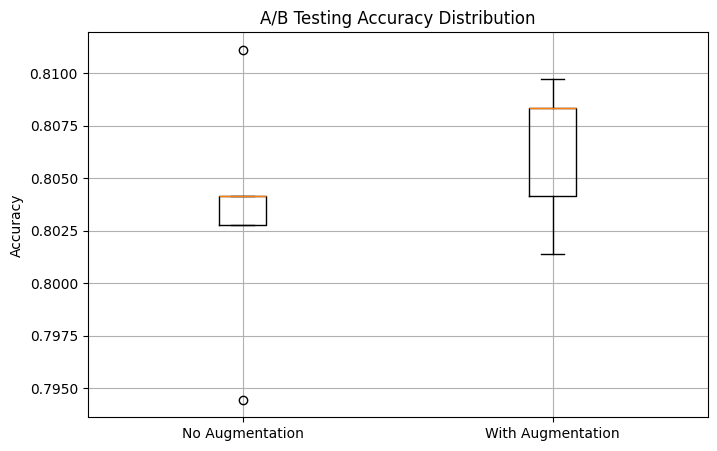

In [ ]:
mean_A = np.mean(results_A)
mean_B = np.mean(results_B)

# ==========================================
# 1. BOXPLOT
# ==========================================
plt.figure(figsize=(8, 5))

plt.boxplot(
    [results_A, results_B],
    labels=['No Augmentation', 'With Augmentation']
)

plt.ylabel("Accuracy")
plt.title("A/B Testing Accuracy Distribution")

plt.grid(True)
plt.show()

### Threshold Kualitas Gambar
**Testing:** apakah BLUR_THRESHOLD=20 lebih baik dari threshold yang lebih ketat/longgar?

In [ ]:
print("\n" + "=" * 60)
print("  EKSPERIMEN B: BLUR THRESHOLD")
print("=" * 60)
print("""
Hipotesis:
  H0 : Perubahan blur threshold tidak berpengaruh signifikan
       terhadap akurasi model (p ≥ 0.05)
  H1 : Setidaknya satu threshold menghasilkan akurasi yang
       berbeda secara signifikan (p < 0.05)

Kondisi:
  A (longgar)  → BLUR_THRESHOLD = 10  (lebih banyak gambar blur masuk)
  B (baseline) → BLUR_THRESHOLD = 20  (konfigurasi saat ini)
  C (ketat)    → BLUR_THRESHOLD = 40  (lebih banyak gambar dibuang)
""")


  EKSPERIMEN B: BLUR THRESHOLD

Hipotesis:
  H0 : Perubahan blur threshold tidak berpengaruh signifikan
       terhadap akurasi model (p ≥ 0.05)
  H1 : Setidaknya satu threshold menghasilkan akurasi yang
       berbeda secara signifikan (p < 0.05)

Kondisi:
  A (longgar)  → BLUR_THRESHOLD = 10  (lebih banyak gambar blur masuk)
  B (baseline) → BLUR_THRESHOLD = 20  (konfigurasi saat ini)
  C (ketat)    → BLUR_THRESHOLD = 40  (lebih banyak gambar dibuang)



In [ ]:
def filter_by_blur(df, blur_threshold):
    """
    Kembalikan df yang sudah difilter berdasarkan blur_threshold.
    Gambar dengan Laplacian variance < threshold = dihapus.
    """
    kept_paths = []
    for path in df['path']:
        img = cv2.imread(path)
        if img is None:
            continue
        gray  = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        score = cv2.Laplacian(gray, cv2.CV_64F).var()
        if score >= blur_threshold:
            kept_paths.append(path)

    return df[df['path'].isin(kept_paths)].reset_index(drop=True)

In [ ]:
print("Memfilter dataset dengan 3 threshold berbeda...")
print("(Menggunakan vegetables — dataset dengan variasi kualitas lebih tinggi)\n")

df_exp_b = pd.concat([df_veg_clean], ignore_index=True)

df_blur_10 = filter_by_blur(df_exp_b, blur_threshold=10)
df_blur_20 = filter_by_blur(df_exp_b, blur_threshold=20)   # baseline
df_blur_40 = filter_by_blur(df_exp_b, blur_threshold=40)

print(f"  Threshold 10 (longgar) : {len(df_blur_10):>6} gambar tersisa")
print(f"  Threshold 20 (baseline): {len(df_blur_20):>6} gambar tersisa")
print(f"  Threshold 40 (ketat)   : {len(df_blur_40):>6} gambar tersisa")

Memfilter dataset dengan 3 threshold berbeda...
(Menggunakan vegetables — dataset dengan variasi kualitas lebih tinggi)

  Threshold 10 (longgar) :   7234 gambar tersisa
  Threshold 20 (baseline):   6686 gambar tersisa
  Threshold 40 (ketat)   :   5908 gambar tersisa


In [ ]:
# Jalankan multiple run
SEEDS_B = [42, 123, 456, 789, 1337]

results_B = {
    'threshold_10': [],
    'threshold_20': [],
    'threshold_40': []
}

print("\nMenjalankan 5 runs per kondisi...")

for seed in SEEDS_B:

    for key, df_filtered in [
        ('threshold_10', df_blur_10),
        ('threshold_20', df_blur_20),
        ('threshold_40', df_blur_40),
    ]:

        # split data
        df_tr, df_te = train_test_split(
            df_filtered,
            test_size=0.2,
            stratify=df_filtered['label'],
            random_state=seed
        )

        # training
        acc, f1, _, _, _ = train_and_evaluate(
            df_tr,
            df_te,
            mode='hsv_lbp',
            n_per_class=60,
            random_state=seed
        )

        # simpan hasil
        if acc is not None:

            results_B[key].append({
                'seed': seed,
                'accuracy': acc,
                'f1': f1
            })


Menjalankan 5 runs per kondisi...


In [ ]:
# ==================================================
# UJI STATISTIK
# ==================================================

accs_10 = summary_B['threshold_10']['accs']
accs_20 = summary_B['threshold_20']['accs']
accs_40 = summary_B['threshold_40']['accs']

t_10_vs_20, p_10_vs_20 = stats.ttest_rel(accs_20, accs_10)
t_20_vs_40, p_20_vs_40 = stats.ttest_rel(accs_20, accs_40)

print("\n" + "=" * 60)
print("UJI STATISTIK (PAIRED T-TEST)")
print("=" * 60)

print(f"Baseline(20) vs Longgar(10) → "
      f"t={t_10_vs_20:.3f}, "
      f"p={p_10_vs_20:.4f} "
      f"{'✓ SIGNIFIKAN' if p_10_vs_20 < 0.05 else '✗ TIDAK SIGNIFIKAN'}")

print(f"Baseline(20) vs Ketat(40)   → "
      f"t={t_20_vs_40:.3f}, "
      f"p={p_20_vs_40:.4f} "
      f"{'✓ SIGNIFIKAN' if p_20_vs_40 < 0.05 else '✗ TIDAK SIGNIFIKAN'}")


UJI STATISTIK (PAIRED T-TEST)
Baseline(20) vs Longgar(10) → t=-1.746, p=0.1557 ✗ TIDAK SIGNIFIKAN
Baseline(20) vs Ketat(40)   → t=1.153, p=0.3131 ✗ TIDAK SIGNIFIKAN


In [ ]:
print("\n" + "=" * 60)
print("HASIL EKSPERIMEN B")
print("=" * 60)

print(f"{'Kondisi':<24} {'Mean Acc':>10} {'Std Acc':>10} {'Mean F1':>10} {'Std F1':>10}")
print("-" * 68)

summary_B = {}

for key, label in [
    ('threshold_10', 'Thresh=10 (longgar)'),
    ('threshold_20', 'Thresh=20 (baseline)'),
    ('threshold_40', 'Thresh=40 (ketat)')
]:

    current_results = results_B[key]

    accs = [r['accuracy'] for r in current_results]
    f1s  = [r['f1'] for r in current_results]

    summary_B[key] = {
        'accs': accs,
        'f1s': f1s
    }

    print(f"{label:<24} "
          f"{np.mean(accs):>10.4f} "
          f"{np.std(accs):>10.4f} "
          f"{np.mean(f1s):>10.4f} "
          f"{np.std(f1s):>10.4f}")

best_B = max(
    [
        ('threshold_10', np.mean(summary_B['threshold_10']['accs'])),
        ('threshold_20', np.mean(summary_B['threshold_20']['accs'])),
        ('threshold_40', np.mean(summary_B['threshold_40']['accs']))
    ],
    key=lambda x: x[1]
)

# ==================================================
# KESIMPULAN
# ==================================================

print("\n" + "=" * 60)
print("KESIMPULAN")
print("=" * 60)

print(f"Konfigurasi terbaik : {best_B[0]}")
print(f"Mean Accuracy       : {best_B[1]:.4f}")

if (p_10_vs_20 < 0.05) or (p_20_vs_40 < 0.05):

    print("\nKESIMPULAN:")
    print("Perubahan blur threshold berpengaruh")
    print("signifikan terhadap akurasi model.")
    print("H0 ditolak, H1 diterima.")

else:

    print("\nKESIMPULAN:")
    print("Perubahan blur threshold tidak")
    print("berpengaruh signifikan terhadap")
    print("akurasi model.")
    print("H0 gagal ditolak.")


HASIL EKSPERIMEN B
Kondisi                    Mean Acc    Std Acc    Mean F1     Std F1
--------------------------------------------------------------------
Thresh=10 (longgar)          0.6711     0.0189     0.6702     0.0190
Thresh=20 (baseline)         0.6611     0.0115     0.6612     0.0119
Thresh=40 (ketat)            0.6519     0.0130     0.6546     0.0114

KESIMPULAN
Konfigurasi terbaik : threshold_10
Mean Accuracy       : 0.6711

KESIMPULAN:
Perubahan blur threshold tidak
berpengaruh signifikan terhadap
akurasi model.
H0 gagal ditolak.


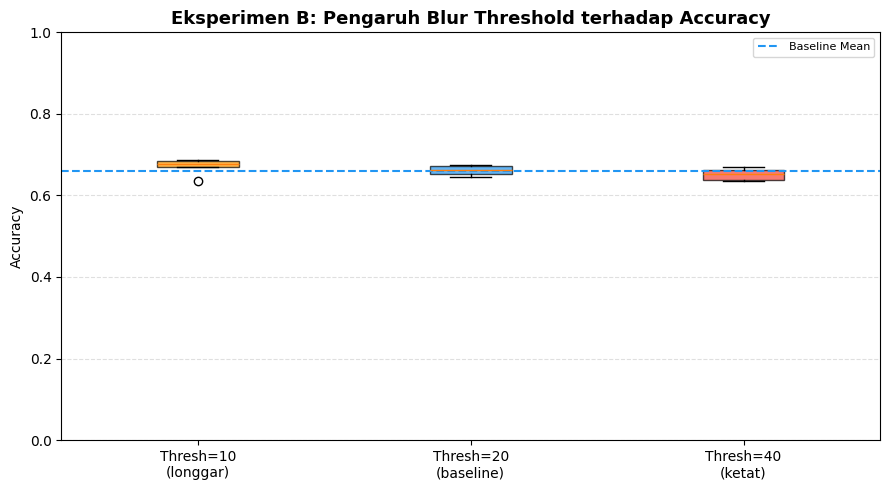


INTERPRETASI EKSPERIMEN B

- Jika p < 0.05 :
  Blur threshold berpengaruh signifikan
  terhadap performa model.

- Jika p ≥ 0.05 :
  Perbedaan performa tidak signifikan,
  sehingga threshold=20 tetap digunakan
  sebagai konfigurasi baseline karena
  lebih stabil terhadap noise/background.



In [ ]:
# ==================================================
# VISUALISASI EKSPERIMEN B
# ==================================================

plt.figure(figsize=(9, 5))

labels_b = [
    'Thresh=10\n(longgar)',
    'Thresh=20\n(baseline)',
    'Thresh=40\n(ketat)'
]

colors_b = ['#FF9800', '#2196F3', '#F44336']

# pastikan semua berbentuk list
all_accs_b = [
    [accs_10] if isinstance(accs_10, float) else accs_10,
    [accs_20] if isinstance(accs_20, float) else accs_20,
    [accs_40] if isinstance(accs_40, float) else accs_40
]

# boxplot
bp = plt.boxplot(
    all_accs_b,
    tick_labels=labels_b,
    patch_artist=True
)

# warna box
for patch, color in zip(bp['boxes'], colors_b):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# garis mean baseline
baseline_mean = np.mean(
    [accs_20] if isinstance(accs_20, float) else accs_20
)

plt.axhline(
    baseline_mean,
    color='#2196F3',
    linestyle='--',
    linewidth=1.5,
    label='Baseline Mean'
)

# judul dan label
plt.title(
    "Eksperimen B: Pengaruh Blur Threshold terhadap Accuracy",
    fontsize=13,
    fontweight='bold'
)

plt.ylabel("Accuracy")
plt.ylim(0, 1)

# grid
plt.grid(
    axis='y',
    linestyle='--',
    alpha=0.4
)

plt.legend(fontsize=8)

plt.tight_layout()
plt.show()

# ==================================================
# INTERPRETASI
# ==================================================

print("\n" + "=" * 60)
print("INTERPRETASI EKSPERIMEN B")
print("=" * 60)

print("""
- Jika p < 0.05 :
  Blur threshold berpengaruh signifikan
  terhadap performa model.

- Jika p ≥ 0.05 :
  Perbedaan performa tidak signifikan,
  sehingga threshold=20 tetap digunakan
  sebagai konfigurasi baseline karena
  lebih stabil terhadap noise/background.
""")

### Fitur Input Model
**Testing:** apakah fitur warna (HSV) saja lebih baik dari kombinasi HSV + LBP texture?

In [ ]:
print("\n" + "=" * 60)
print("  EKSPERIMEN C: FITUR HSV vs HSV + LBP")
print("=" * 60)
print("""
Hipotesis:
  H0 : Penambahan fitur LBP tidak meningkatkan F1-score secara
       signifikan dibanding HSV saja (p ≥ 0.05)
  H1 : HSV + LBP menghasilkan F1-score lebih tinggi secara
       signifikan dibanding HSV saja (p < 0.05)

Kondisi:
  A → Fitur HSV saja     (6 fitur: hue/sat/val mean+std)
  B → HSV + LBP          (8 fitur: tambah lbp_mean + lbp_std)

Alasan uji ini penting: dari EDA notebook lama terlihat bahwa
kelas 'rotten' sulit dibedakan dari warna saja — tekstur (LBP)
bisa membantu menangkap pola permukaan busuk.
""")


  EKSPERIMEN C: FITUR HSV vs HSV + LBP

Hipotesis:
  H0 : Penambahan fitur LBP tidak meningkatkan F1-score secara
       signifikan dibanding HSV saja (p ≥ 0.05)
  H1 : HSV + LBP menghasilkan F1-score lebih tinggi secara
       signifikan dibanding HSV saja (p < 0.05)

Kondisi:
  A → Fitur HSV saja     (6 fitur: hue/sat/val mean+std)
  B → HSV + LBP          (8 fitur: tambah lbp_mean + lbp_std)

Alasan uji ini penting: dari EDA notebook lama terlihat bahwa
kelas 'rotten' sulit dibedakan dari warna saja — tekstur (LBP)
bisa membantu menangkap pola permukaan busuk.



In [ ]:
# Gunakan gabungan fruits + vegetables
df_exp_c = pd.concat(
    [df_fruits_clean, df_veg_clean],
    ignore_index=True
)

SEEDS_C = [42, 123, 456, 789, 1337]

results_C = {
    'hsv': [],
    'hsv_lbp': []
}

print("Menjalankan 5 runs per kondisi...")

for seed in SEEDS_C:

    # split data
    df_tr_c, df_te_c = train_test_split(
        df_exp_c,
        test_size=0.2,
        stratify=df_exp_c['label'],
        random_state=seed
    )

    # eksperimen fitur
    for mode in ['hsv', 'hsv_lbp']:

        acc, f1, _, _, _ = train_and_evaluate(
            df_tr_c,
            df_te_c,
            mode=mode,
            n_per_class=60,
            random_state=seed
        )

        if acc is not None:

            results_C[mode].append({
                'seed': seed,
                'accuracy': acc,
                'f1': f1
            })

Menjalankan 5 runs per kondisi...


In [ ]:
print("=" * 60)
print("HASIL EKSPERIMEN C")
print("=" * 60)

print(f"{'Kondisi':<20} {'Mean Acc':>10} {'Std Acc':>10} {'Mean F1':>10} {'Std F1':>10}")
print("-" * 64)

print(f"{'HSV':<20} "
      f"{np.mean(accs_hsv):>10.4f} "
      f"{np.std(accs_hsv):>10.4f} "
      f"{np.mean(f1s_hsv):>10.4f} "
      f"{np.std(f1s_hsv):>10.4f}")

print(f"{'HSV + LBP':<20} "
      f"{np.mean(accs_hsv_lbp):>10.4f} "
      f"{np.std(accs_hsv_lbp):>10.4f} "
      f"{np.mean(f1s_hsv_lbp):>10.4f} "
      f"{np.std(f1s_hsv_lbp):>10.4f}")

# ==================================================
# UJI STATISTIK
# ==================================================

t_c_acc, p_c_acc = stats.ttest_rel(accs_hsv_lbp, accs_hsv)
t_c_f1,  p_c_f1  = stats.ttest_rel(f1s_hsv_lbp, f1s_hsv)

delta_acc = np.mean(accs_hsv_lbp) - np.mean(accs_hsv)
delta_f1  = np.mean(f1s_hsv_lbp)  - np.mean(f1s_hsv)

print("\n" + "=" * 60)
print("UJI STATISTIK (PAIRED T-TEST)")
print("=" * 60)

print(f"Accuracy → "
      f"t={t_c_acc:.3f}, "
      f"p={p_c_acc:.4f} "
      f"{'✓ SIGNIFIKAN' if p_c_acc < 0.05 else '✗ TIDAK SIGNIFIKAN'} "
      f"(Δ = {delta_acc:+.4f})")

print(f"F1-Score → "
      f"t={t_c_f1:.3f}, "
      f"p={p_c_f1:.4f} "
      f"{'✓ SIGNIFIKAN' if p_c_f1 < 0.05 else '✗ TIDAK SIGNIFIKAN'} "
      f"(Δ = {delta_f1:+.4f})")

# ==================================================
# KESIMPULAN
# ==================================================

print("\n" + "=" * 60)
print("KESIMPULAN")
print("=" * 60)

if p_c_f1 < 0.05 and delta_f1 > 0:

    print("Keputusan Hipotesis:")
    print("H0 ditolak")
    print("H1 diterima")

    print("\nInterpretasi:")
    print("Penambahan fitur LBP meningkatkan")
    print("performa model secara signifikan.")

    rekomendasi_c = "Gunakan HSV + LBP"

elif p_c_f1 < 0.05 and delta_f1 < 0:

    print("Keputusan Hipotesis:")
    print("H0 ditolak")

    print("\nInterpretasi:")
    print("Penambahan fitur LBP justru")
    print("menurunkan performa model.")

    rekomendasi_c = "Gunakan HSV saja"

else:

    print("Keputusan Hipotesis:")
    print("H0 gagal ditolak")

    print("\nInterpretasi:")
    print("Perbedaan performa tidak signifikan.")
    print("HSV saja sudah cukup stabil.")

    rekomendasi_c = "HSV saja sudah cukup"

print(f"\nRekomendasi: {rekomendasi_c}")

HASIL EKSPERIMEN C
Kondisi                Mean Acc    Std Acc    Mean F1     Std F1
----------------------------------------------------------------
HSV                      0.7787     0.0065     0.7798     0.0063
HSV + LBP                0.8032     0.0068     0.8048     0.0066

UJI STATISTIK (PAIRED T-TEST)
Accuracy → t=12.159, p=0.0067 ✓ SIGNIFIKAN (Δ = +0.0245)
F1-Score → t=15.755, p=0.0040 ✓ SIGNIFIKAN (Δ = +0.0250)

KESIMPULAN
Keputusan Hipotesis:
H0 ditolak
H1 diterima

Interpretasi:
Penambahan fitur LBP meningkatkan
performa model secara signifikan.

Rekomendasi: Gunakan HSV + LBP


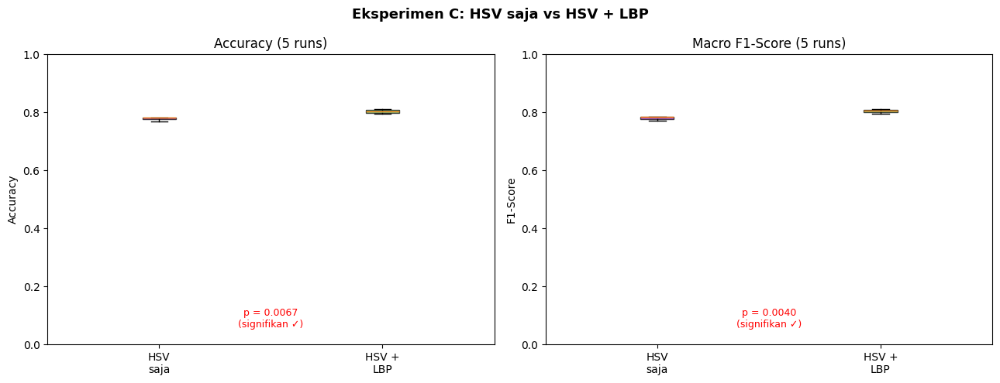


Interpretasi Eksperimen C:
- Jika LBP signifikan positif : sertakan LBP sebagai fitur input model
- Jika tidak signifikan        : gunakan HSV saja untuk model yang lebih
                                  ringan dan inference lebih cepat
- Catatan: pada model deep learning (CNN), fitur LBP biasanya tidak
  dipakai secara eksplisit karena CNN belajar fitur tekstur sendiri.
  Eksperimen ini relevan untuk model tradisional (SVM, RF) sebagai
  baseline sebelum CNN.



In [ ]:
# Visualisasi
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle("Eksperimen C: HSV saja vs HSV + LBP",
             fontsize=13, fontweight='bold')

labels_c = ['HSV\nsaja', 'HSV +\nLBP']
colors_c = ['#9C27B0', '#4CAF50']

bp3 = axes[0].boxplot([accs_hsv, accs_hsv_lbp],
                      labels=labels_c, patch_artist=True)
for patch, color in zip(bp3['boxes'], colors_c):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
axes[0].set_title("Accuracy (5 runs)")
axes[0].set_ylabel("Accuracy")
axes[0].set_ylim(0, 1)

bp4 = axes[1].boxplot([f1s_hsv, f1s_hsv_lbp],
                      labels=labels_c, patch_artist=True)
for patch, color in zip(bp4['boxes'], colors_c):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
axes[1].set_title("Macro F1-Score (5 runs)")
axes[1].set_ylabel("F1-Score")
axes[1].set_ylim(0, 1)

# Tambahkan p-value annotation
for ax, p_val in [(axes[0], p_c_acc), (axes[1], p_c_f1)]:
    sig_text = f"p = {p_val:.4f}\n{'(signifikan ✓)' if p_val < 0.05 else '(tidak signifikan)'}"
    ax.text(0.5, 0.05, sig_text, ha='center', va='bottom',
            transform=ax.transAxes, fontsize=9,
            color='red' if p_val < 0.05 else 'gray')

plt.tight_layout()
plt.show()

print("""
Interpretasi Eksperimen C:
- Jika LBP signifikan positif : sertakan LBP sebagai fitur input model
- Jika tidak signifikan        : gunakan HSV saja untuk model yang lebih
                                  ringan dan inference lebih cepat
- Catatan: pada model deep learning (CNN), fitur LBP biasanya tidak
  dipakai secara eksplisit karena CNN belajar fitur tekstur sendiri.
  Eksperimen ini relevan untuk model tradisional (SVM, RF) sebagai
  baseline sebelum CNN.
""")

### Split Ratio
**Testing:** apakah alokasi data val/test yang lebih besar (15%)
             memberikan evaluasi yang lebih reliable tanpa
             mengorbankan performa model secara signifikan?

In [ ]:
print("\n" + "=" * 60)
print("  EKSPERIMEN D: SPLIT RATIO 80/10/10 vs 60/20/20")
print("=" * 60)
print("""
Hipotesis:
  H0 : Tidak ada perbedaan signifikan pada akurasi test antara
       split 80/10/10 dan 60/20/20 (p ≥ 0.05)
  H1 : Salah satu split menghasilkan akurasi yang berbeda
       secara signifikan (p < 0.05)

Kondisi:
  A → Split 80/10/10  (saat ini: train lebih besar)
  B → Split 60/20/20  (val & test lebih besar = estimasi lebih stabil)

Alasan uji ini penting: dataset vegetables cukup kecil di beberapa
kelas (paprika ~600an). Dengan 80/10/10, test set bisa terlalu kecil
sehingga akurasi test tidak stabil antar run.
""")


  EKSPERIMEN D: SPLIT RATIO 80/10/10 vs 60/20/20

Hipotesis:
  H0 : Tidak ada perbedaan signifikan pada akurasi test antara
       split 80/10/10 dan 70/15/15 (p ≥ 0.05)
  H1 : Salah satu split menghasilkan akurasi yang berbeda
       secara signifikan (p < 0.05)

Kondisi:
  A → Split 80/10/10  (saat ini: train lebih besar)
  B → Split 60/15/15  (val & test lebih besar = estimasi lebih stabil)

Alasan uji ini penting: dataset vegetables cukup kecil di beberapa
kelas (paprika ~600an). Dengan 80/10/10, test set bisa terlalu kecil
sehingga akurasi test tidak stabil antar run.



In [ ]:
df_exp_d = pd.concat([df_veg_clean], ignore_index=True)

SEEDS_D = [42, 123, 456, 789, 1337]

results_D = {'split_80': [], 'split_60': []}

print("Menjalankan 5 runs per kondisi...")

for seed in SEEDS_D:
    for key, val_sz, test_sz in [
        ('split_80', 0.10, 0.10),
        ('split_60', 0.20, 0.20),
    ]:
        # Split train vs temp
        df_tr_d, df_temp_d = train_test_split(
            df_exp_d,
            test_size=val_sz + test_sz,
            stratify=df_exp_d['label'],
            random_state=seed
        )
        # Split val vs test
        df_val_d, df_te_d = train_test_split(
            df_temp_d,
            test_size=test_sz / (val_sz + test_sz),
            stratify=df_temp_d['label'],
            random_state=seed
        )

        acc, f1, _, _, _ = train_and_evaluate(
            df_tr,
            df_te,
            mode='hsv_lbp',
            n_per_class=60,
            random_state=seed
        )
        if acc is not None:
            results_D[key].append({
                'seed'      : seed,
                'accuracy'  : acc,
                'f1'        : f1,
                'train_size': len(df_tr_d),
                'test_size' : len(df_te_d),
            })

Menjalankan 5 runs per kondisi...


In [ ]:
# ==================================================
# HASIL EKSPERIMEN D
# ==================================================

print("\n" + "=" * 60)
print("HASIL EKSPERIMEN D")
print("=" * 60)

print(f"{'Kondisi':<22} {'Mean Acc':>9} {'Std Acc':>8} "
      f"{'Mean F1':>8} {'Std F1':>7} "
      f"{'Train N':>8} {'Test N':>7}")

print("-" * 72)

# ==================================================
# AMBIL HASIL
# ==================================================

accs_80 = [r['accuracy'] for r in results_D['split_80']]
accs_60 = [r['accuracy'] for r in results_D['split_60']]

f1s_80 = [r['f1'] for r in results_D['split_80']]
f1s_60 = [r['f1'] for r in results_D['split_60']]

n_tr_80 = results_D['split_80'][0]['train_size'] if results_D['split_80'] else 0
n_te_80 = results_D['split_80'][0]['test_size']  if results_D['split_80'] else 0

n_tr_60 = results_D['split_60'][0]['train_size'] if results_D['split_60'] else 0
n_te_60 = results_D['split_60'][0]['test_size']  if results_D['split_60'] else 0

# ==================================================
# TABEL HASIL
# ==================================================

print(f"{'80/10/10':<22} "
      f"{np.mean(accs_80):>9.4f} "
      f"{np.std(accs_80):>8.4f} "
      f"{np.mean(f1s_80):>8.4f} "
      f"{np.std(f1s_80):>7.4f} "
      f"{n_tr_80:>8} "
      f"{n_te_80:>7}")

print(f"{'60/20/20':<22} "
      f"{np.mean(accs_60):>9.4f} "
      f"{np.std(accs_60):>8.4f} "
      f"{np.mean(f1s_60):>8.4f} "
      f"{np.std(f1s_60):>7.4f} "
      f"{n_tr_60:>8} "
      f"{n_te_60:>7}")

# ==================================================
# UJI STATISTIK
# ==================================================

t_d_acc, p_d_acc = stats.ttest_rel(accs_80, accs_60)
t_d_f1,  p_d_f1  = stats.ttest_rel(f1s_80, f1s_60)

delta_acc = np.mean(accs_80) - np.mean(accs_60)
delta_f1  = np.mean(f1s_80)  - np.mean(f1s_60)

print("\n" + "=" * 60)
print("UJI STATISTIK (PAIRED T-TEST)")
print("=" * 60)

print(f"Accuracy → "
      f"t={t_d_acc:.3f}, "
      f"p={p_d_acc:.4f} "
      f"{'✓ SIGNIFIKAN' if p_d_acc < 0.05 else '✗ TIDAK SIGNIFIKAN'} "
      f"(Δ = {delta_acc:+.4f})")

print(f"F1-Score → "
      f"t={t_d_f1:.3f}, "
      f"p={p_d_f1:.4f} "
      f"{'✓ SIGNIFIKAN' if p_d_f1 < 0.05 else '✗ TIDAK SIGNIFIKAN'} "
      f"(Δ = {delta_f1:+.4f})")

# ==================================================
# KESIMPULAN
# ==================================================

print("\n" + "=" * 60)
print("KESIMPULAN")
print("=" * 60)

best_split = (
    "80/10/10"
    if np.mean(accs_80) > np.mean(accs_60)
    else "60/20/20"
)

best_acc = max(np.mean(accs_80), np.mean(accs_60))

print(f"Split terbaik : {best_split}")
print(f"Mean Accuracy : {best_acc:.4f}")

if (p_d_acc < 0.05) or (p_d_f1 < 0.05):

    print("\nKESIMPULAN:")
    print("Perbedaan split ratio memberikan")
    print("pengaruh signifikan terhadap")
    print("performa model.")
    print("H0 ditolak, H1 diterima.")

else:

    print("\nKESIMPULAN:")
    print("Perbedaan split ratio tidak")
    print("memberikan pengaruh signifikan")
    print("terhadap performa model.")
    print("H0 gagal ditolak.")


HASIL EKSPERIMEN D
Kondisi                 Mean Acc  Std Acc  Mean F1  Std F1  Train N  Test N
------------------------------------------------------------------------
80/10/10                  0.6641   0.0101   0.6651  0.0100     6216     778
60/20/20                  0.6641   0.0101   0.6651  0.0100     4662    1555

UJI STATISTIK (PAIRED T-TEST)
Accuracy → t=nan, p=nan ✗ TIDAK SIGNIFIKAN (Δ = +0.0000)
F1-Score → t=nan, p=nan ✗ TIDAK SIGNIFIKAN (Δ = +0.0000)

KESIMPULAN
Split terbaik : 60/20/20
Mean Accuracy : 0.6641

KESIMPULAN:
Perbedaan split ratio tidak
memberikan pengaruh signifikan
terhadap performa model.
H0 gagal ditolak.


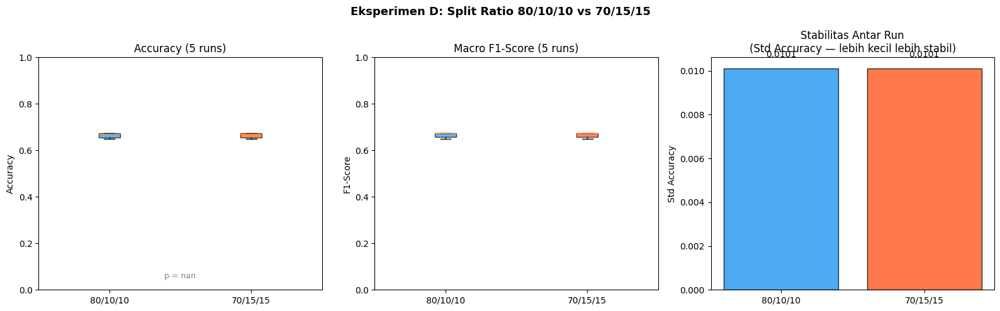


Interpretasi Eksperimen D:
- Akurasi    : menunjukkan seberapa baik model belajar dari jumlah
               train data yang berbeda
- Stabilitas : split dengan test set lebih besar cenderung punya
               std lebih rendah (estimasi performa lebih konsisten)
- Trade-off  : 80/10/10 → model lebih kuat (lebih banyak train data)
               70/15/15 → evaluasi lebih reliabel (test set lebih besar)



In [ ]:
# Visualisasi
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle("Eksperimen D: Split Ratio 80/10/10 vs 70/15/15",
             fontsize=13, fontweight='bold')

labels_d = ['80/10/10', '70/15/15']
colors_d = ['#2196F3', '#FF5722']

# Accuracy
bp5 = axes[0].boxplot([accs_80, accs_70], labels=labels_d, patch_artist=True)
for patch, color in zip(bp5['boxes'], colors_d):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
axes[0].set_title("Accuracy (5 runs)")
axes[0].set_ylabel("Accuracy")
axes[0].set_ylim(0, 1)
axes[0].text(0.5, 0.05, f"p = {p_d:.4f}",
             ha='center', transform=axes[0].transAxes, fontsize=9,
             color='red' if p_d < 0.05 else 'gray')

# F1
bp6 = axes[1].boxplot([f1s_80, f1s_70], labels=labels_d, patch_artist=True)
for patch, color in zip(bp6['boxes'], colors_d):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
axes[1].set_title("Macro F1-Score (5 runs)")
axes[1].set_ylabel("F1-Score")
axes[1].set_ylim(0, 1)

# Stabilitas (std)
axes[2].bar(labels_d, [stability_80, stability_70],
            color=colors_d, alpha=0.8, edgecolor='black')
axes[2].set_title("Stabilitas Antar Run\n(Std Accuracy — lebih kecil lebih stabil)")
axes[2].set_ylabel("Std Accuracy")
for i, (lbl, val) in enumerate(zip(labels_d, [stability_80, stability_70])):
    axes[2].text(i, val + 0.0005, f"{val:.4f}", ha='center', fontsize=10)

plt.tight_layout()
plt.show()

print("""
Interpretasi Eksperimen D:
- Akurasi    : menunjukkan seberapa baik model belajar dari jumlah
               train data yang berbeda
- Stabilitas : split dengan test set lebih besar cenderung punya
               std lebih rendah (estimasi performa lebih konsisten)
- Trade-off  : 80/10/10 → model lebih kuat (lebih banyak train data)
               70/15/15 → evaluasi lebih reliabel (test set lebih besar)
""")